### Introduction

Many cancer patients die of metastasis and treatment resistance frequently caused by low levels of oxygen (hypoxia) in their tumoural cells.
Hypoxia is a major adverse feature of solid tumours, leading to metastases and resistance to radiotherapy, chemotherapy, and a possibly molecular target for drugs and immunotherapies.
This is why checking the hypoxia status of the tumoral cells can be crucial for selecting the best treatment or clinical trial for the patient.
In particular, gene expression signatures through RNA have shown predictive impact in hypoxia-modifying combination therapies.
It was also evaluated the influence of intratumour heterogeneity in patient classification for target therapy, but up to now it doesn't seem to reduce significantly the accurancy of the method.
Single-cell RNA sequencing (scRNA-seq) offers new possibilities to address biological and medical questions; however there are different protocols to execute this procedure (e.g. Drop-seq and Smart-seq).
Genome-wide quantification of mRNA transcripts is highly informative for characterizing cellular states.
The aim of our analisys is to train a model on a given dataset so that it is able to classify whether cells are in hypoxia state or normoxia state.
Based on the number of hypoxic cells found in the test set we want to be able to classify the state of the cells of the tumour (more or less hypoxic) in order to select the best therapy to follow for each single patient.

### Materials and Methods

We analize two epithelial cells from mammary gland tissue: the first one is MCF7 from adenocarcinoma desease and the second one is HCC1806 from acantholytic squamous cell carcinoma, TNM Stage IIB, grade 2.
The two cells are put in two experimental conditions, hypoxia and normoxia state and are then sequenced using two transcription techniques: Drop-Seq and Smart-seq.
Power simulations showed that Drop-seq is more cost-efficient for transcriptome quantification of large numbers of cells while Smart-seq is more efficient when analyzing fewer cells.
Moreover the Smart-seq protocol has been optimized for sensitivity, full-length coverage, accuracy, and cost.
Our aim is to be able to understand the state of a cell based on the expression of some of its genes. 
For each cell we will perform an exploratory data analisys, unsupervised learning to look at possible different classes, or to see whether there are similarities in some of the features, and supervised learning to build a classifier for prediction of the state of the cells.

### Python libraries

In [1]:
import pandas as pd
import math
import seaborn as sns
import numpy as np
import os
import sys
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline     
sns.set(color_codes=True)

In [2]:
os.getcwd()
os.chdir("/Users/giuli/Downloads/")
os.getcwd()

'C:\\Users\\giuli\\Downloads'

In [191]:
df_mcf_ss_meta = pd.read_csv("MCF7_SmartS_MetaData.tsv",delimiter="\t",engine='python',index_col=0)
df_mcf_ss_unfilt = pd.read_csv("MCF7_SmartS_Unfiltered_Data.txt",delimiter="\ ",engine='python',index_col=0)
df_mcf_ss_filt= pd.read_csv("MCF7_SmartS_Filtered_Data.txt",delimiter="\ ",engine='python',index_col=0)

df_mcf_ss_train= pd.read_csv("MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt",delimiter="\ ",engine='python',index_col=0)

df_mcf_ds_train = pd.read_csv("MCF7_Filtered_Normalised_3000_Data_train.txt",delimiter=' ',engine='python',index_col=0).T
df_mcf_ds_test = pd.read_csv("MCF7_Filtered_Normalised_3000_Data_test_anonim.txt",delimiter=' ',engine='python',index_col=0).T

df_mcf_ss_unfilt.columns = df_mcf_ss_unfilt.columns.str.replace(r'"', '')
df_mcf_ss_filt.columns = df_mcf_ss_filt.columns.str.replace(r'"', '')
df_mcf_ss_train.columns = df_mcf_ss_train.columns.str.replace(r'"', '')

# MCF7

### Introduction

This notebook contains an analysis of the gene expression data obtained from the MCF7 cell line, we will achieve this through different methods. The first one consist of analysis of the metadata file (.tsv) that provides contextual information about the samples, in which we look for any pollution or bias of the metadata. While the seond one is an analysis of the gene expression file (.txt), both unfiltered and filtered. The analysis includes data cleaning, exploratory data analysis, statistical tests, and visualization techniques to gain insights into the dataset and identify potential associations between experimental conditions and gene expression patterns. This is done in order to give bases for the unsupervised and supervised learning techniques. Due to the nature of the exploration, there will be some similarities between the comments of this and HC18006 notebook.

### Exploratory data analysis

First we read in the metadata.

In [7]:
print("Dataframe dimensions:", np.shape(df_mcf_ss_meta))
print("First column: ", df_mcf_ss_meta.iloc[ : , 0])

Dataframe dimensions: (383, 8)
First column:  Filename
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam      MCF7
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam      MCF7
                                                            ... 
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam    MCF7
Name: Cell Line, Length: 383, dtype: object


In [8]:
df_mcf_ss_meta.head(5)  

,Cell Line,Lane,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A10,Hypo,72,S28,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A11,Hypo,72,S29,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A12,Hypo,72,S30,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A1,Norm,72,S1,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A2,Norm,72,S2,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


In [9]:
for i,x in enumerate(df_mcf_ss_meta.columns):
  print(df_mcf_ss_meta.iloc[:,i].value_counts().to_string(), '\n')

Cell Line
MCF7    383 

Lane
output.STAR.1    96
output.STAR.2    96
output.STAR.3    96
output.STAR.4    95 

Pos
A10    4
F10    4
F7     4
F6     4
F5     4
F4     4
F3     4
F2     4
F1     4
F12    4
F11    4
E9     4
F9     4
E8     4
E7     4
E6     4
E5     4
E4     4
E3     4
E2     4
E1     4
E12    4
F8     4
G10    4
E10    4
H10    4
H9     4
H8     4
H7     4
H6     4
H5     4
H4     4
H3     4
H2     4
H1     4
G9     4
G11    4
G8     4
G7     4
G6     4
G5     4
G4     4
G3     4
G2     4
G1     4
G12    4
A11    4
E11    4
D9     4
B10    4
B7     4
B6     4
B5     4
B4     4
B3     4
B2     4
B1     4
B12    4
B11    4
A9     4
B9     4
A8     4
A7     4
A6     4
A5     4
A4     4
A3     4
A2     4
A1     4
A12    4
D8     4
B8     4
C10    4
D7     4
D5     4
D4     4
D3     4
D2     4
D1     4
D12    4
D11    4
C11    4
D10    4
C9     4
C8     4
C7     4
C6     4
C5     4
C4     4
C3     4
C2     4
C1     4
C12    4
D6     4
H12    3
H11    2
H13    1
H14    1 

C

In the MCF7 cell line there are 383 cells evenly distributed on four lanes: the Pos specifies on which lane is every cell.
From the Condition we can see that cells are evenly distributes between hypoxia state or normoxia state and the values of hours specify how long they have been observed for. 
Moreover, each cell is associated to its unique name. 
Finally, we have the values of preprocessing tag and processing comments which are the same for every cell so they are non relevant for our analysis.

Next we download the actual sequencing data:

In [10]:
print("Dataframe dimensions:", np.shape(df_mcf_ss_unfilt))
print("First column: ", df_mcf_ss_unfilt.iloc[ : , 0])

Dataframe dimensions: (22934, 383)
First column:  "WASH7P"         0
"MIR6859-1"      0
"WASH9P"         1
"OR4F29"         0
"MTND1P23"       0
              ... 
"MT-TE"          4
"MT-CYB"       270
"MT-TT"          0
"MT-TP"          5
"MAFIP"          8
Name: "output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam", Length: 22934, dtype: int64


In [11]:
df_mcf_ss_unfilt.shape

(22934, 383)

In [12]:
list(df_mcf_ss_unfilt.columns)

['"output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A8_Hypo_S26_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A9_Hypo_S27_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_B10_Hypo_S76_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_B11_Hypo_S77_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_B12_Hypo_S78_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_B1_Norm_S49_Aligned.sortedByCoord.out.bam"',
 '"outpu

In [13]:
gene_symbls = df_mcf_ss_unfilt.index
print("Dataframe indexes: ", gene_symbls)

Dataframe indexes:  Index(['"WASH7P"', '"MIR6859-1"', '"WASH9P"', '"OR4F29"', '"MTND1P23"',
       '"MTND2P28"', '"MTCO1P12"', '"MTCO2P12"', '"MTATP8P1"', '"MTATP6P1"',
       ...
       '"MT-TH"', '"MT-TS2"', '"MT-TL2"', '"MT-ND5"', '"MT-ND6"', '"MT-TE"',
       '"MT-CYB"', '"MT-TT"', '"MT-TP"', '"MAFIP"'],
      dtype='object', length=22934)


The dataset has dimensions 22934, 383. The 383 columns represent the cells, which are located on four lanes as indicated by their name (output.STAR.number of lane), and can either be in hypoxia or normoxia state.
The 22934 rows identify the genes using their official symbols, which summarize their primary function, for example MIR6859-1 is short for 'MicroRNA 6859-1', which is involved in post-transcriptional regulation of gene expression.

In [14]:
np.shape(df_mcf_ss_unfilt)

(22934, 383)

In [15]:
df_mcf_ss_unfilt.head(5)

,"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,1
"""MIR6859-1""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""WASH9P""",1,0,0,0,0,1,10,1,0,0,...,1,1,0,0,0,0,1,1,4,5
"""OR4F29""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
"""MTND1P23""",0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [16]:
df_mcf_ss_unfilt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22934 entries, "WASH7P" to "MAFIP"
Columns: 383 entries, "output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam" to "output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"
dtypes: int64(383)
memory usage: 67.2+ MB


In [17]:
df_mcf_ss_unfilt.dtypes.value_counts()

int64    383
Name: count, dtype: int64

In [18]:
X = df_mcf_ss_unfilt.to_numpy()
X
np.shape(X)

(22934, 383)

Are there missing values in the data?

In [19]:
print(df_mcf_ss_unfilt.isnull().any().sum())

0


We plot some graphs of the cells and the genes:

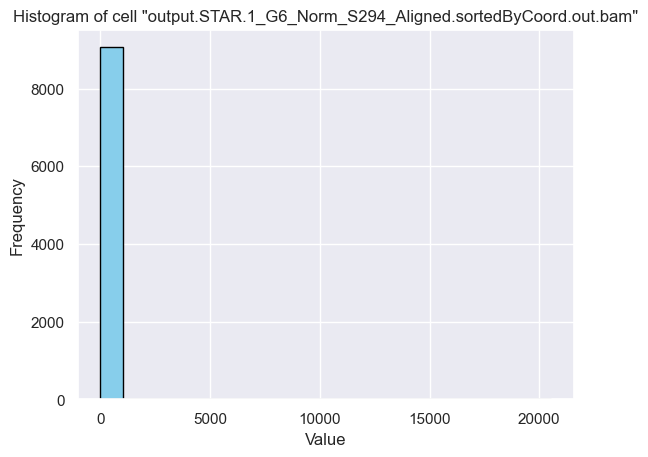

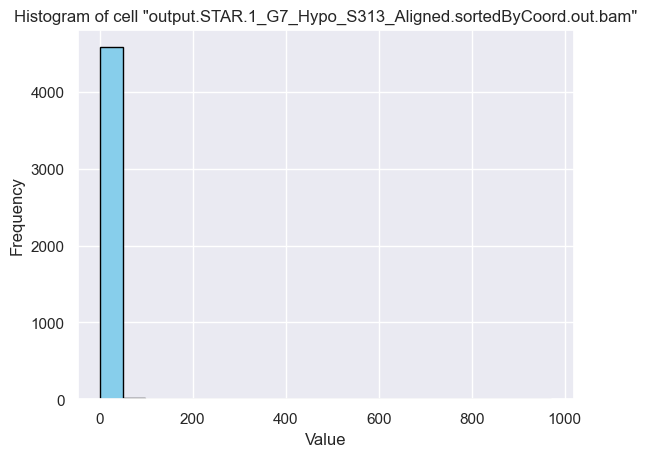

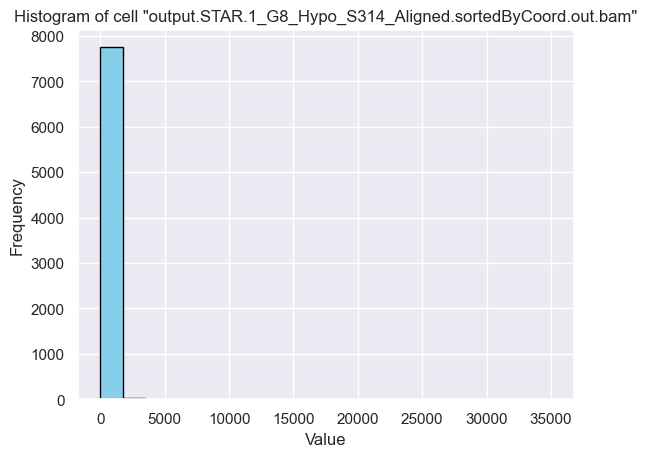

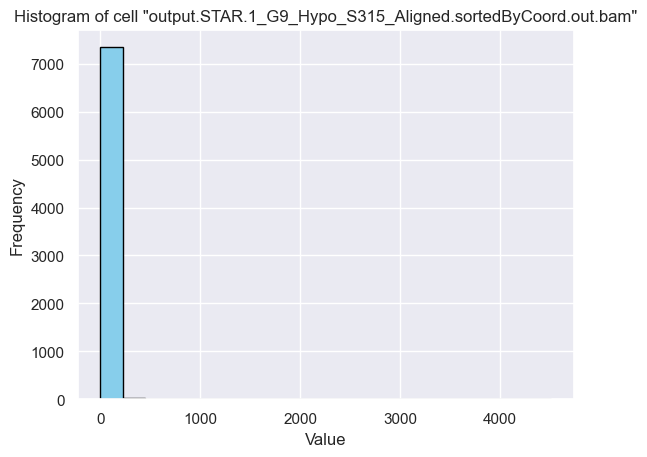

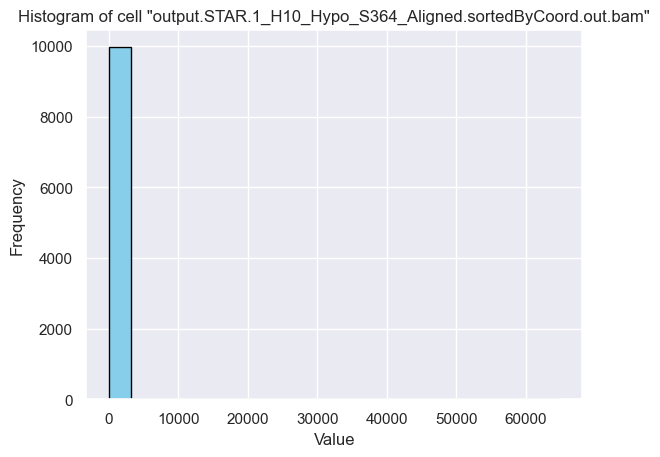

...

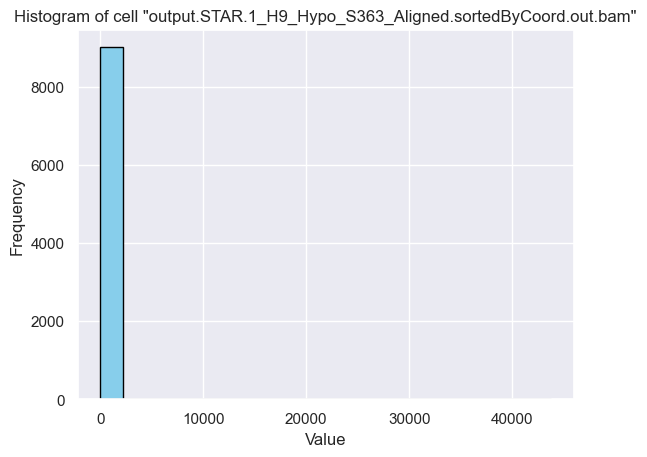

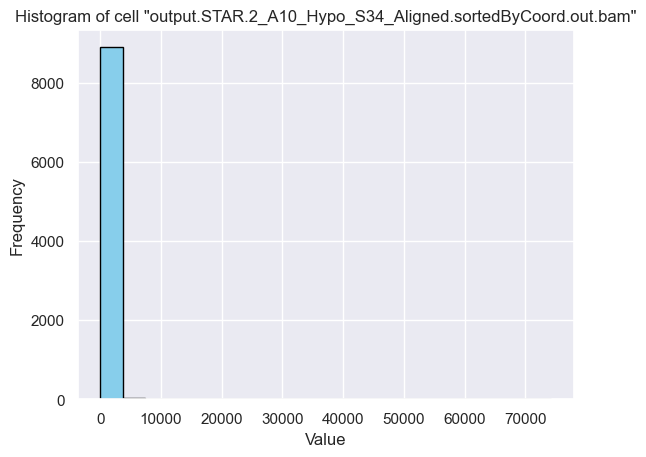

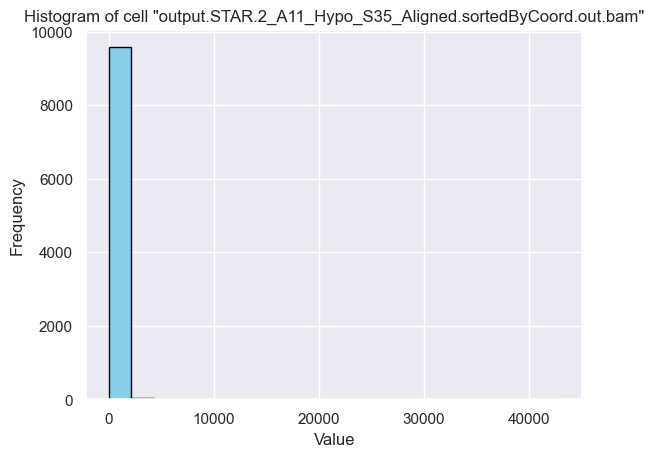

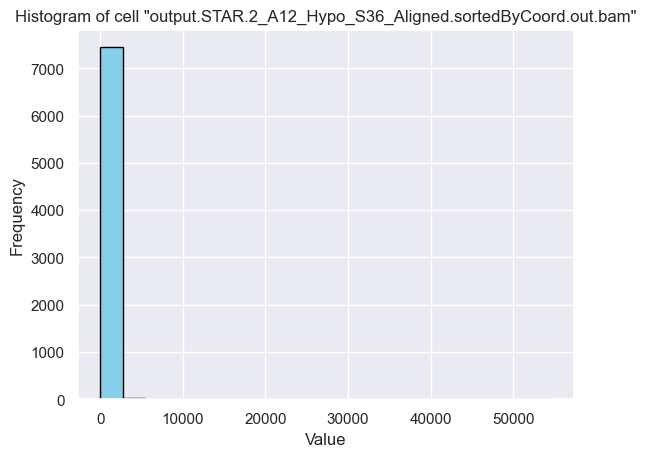

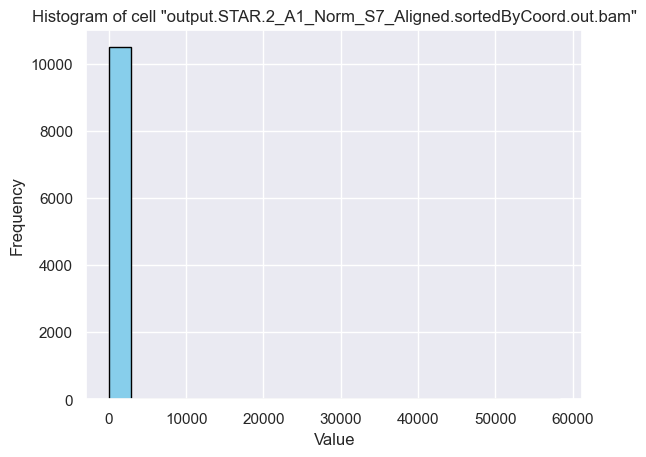

In [20]:
df_mcf_ss_small_cell = df_mcf_ss_unfilt.iloc[:, 80:100]
for column_name in df_mcf_ss_small_cell:
    row_not_null = []  # Reset the list for each column
    row_data = df_mcf_ss_small_cell[column_name]
    for i in range(len(row_data)):
        if row_data[i] != 0:
            row_not_null.append(row_data[i])
    
    # Plotting histogram
    plt.hist(row_not_null, bins=20, color='skyblue', edgecolor='black')

    # Adding labels and title
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of cell {column_name}')
    
    # Displaying the plot
    plt.show()

Most of the data are zero, but let's take a better look at the ones that are not

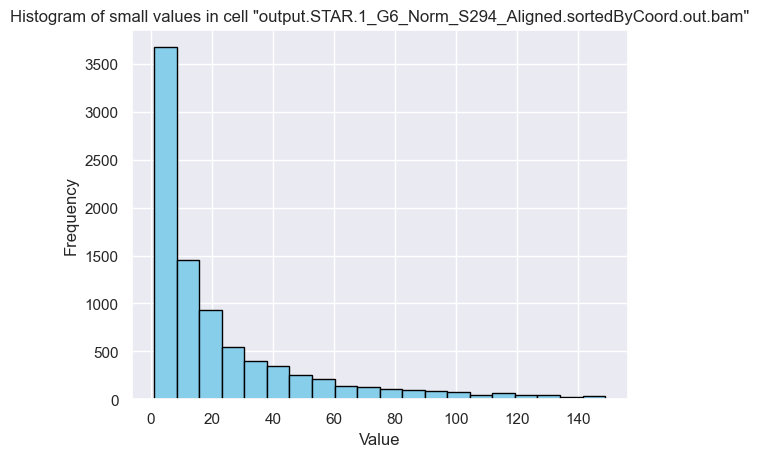

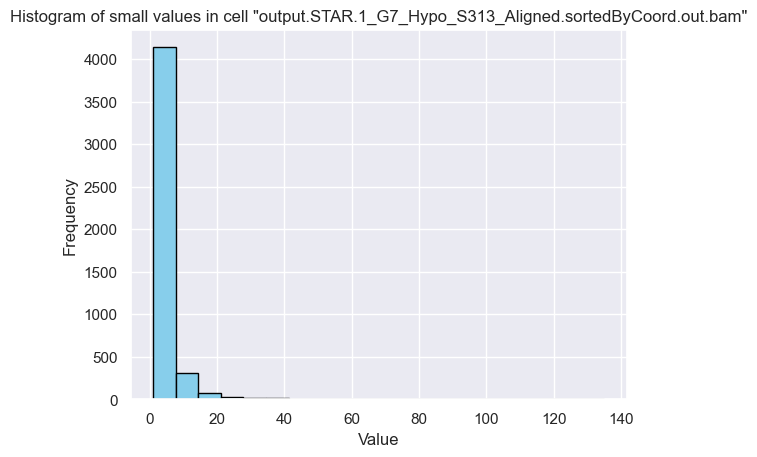

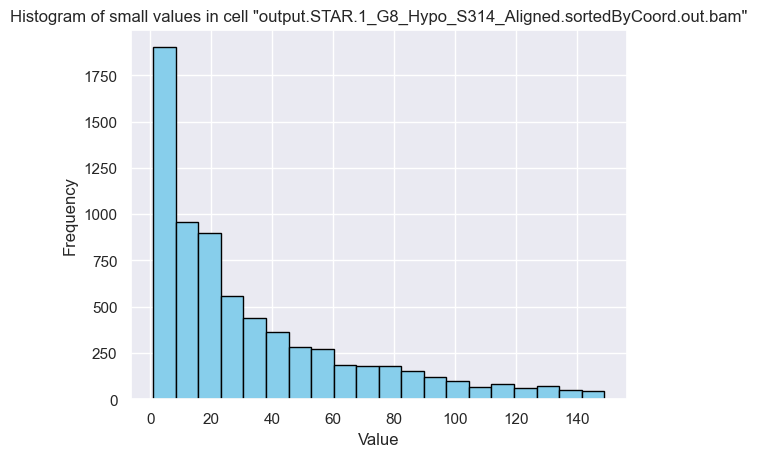

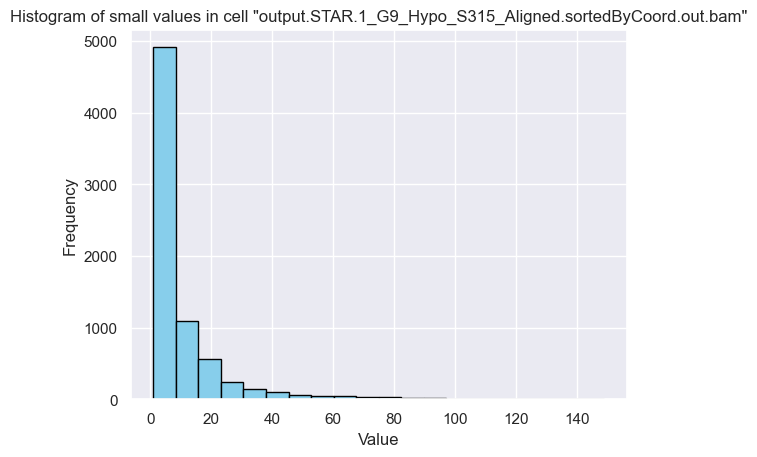

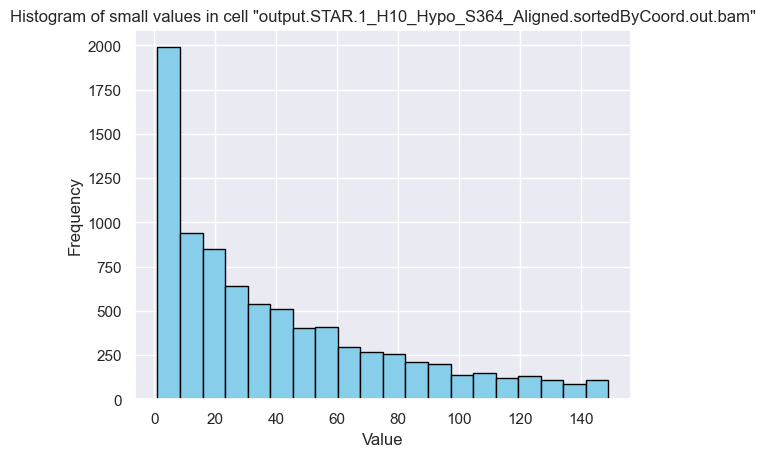

...

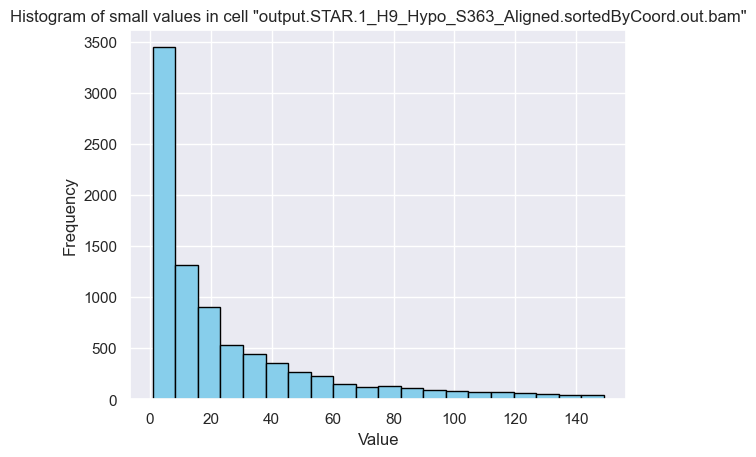

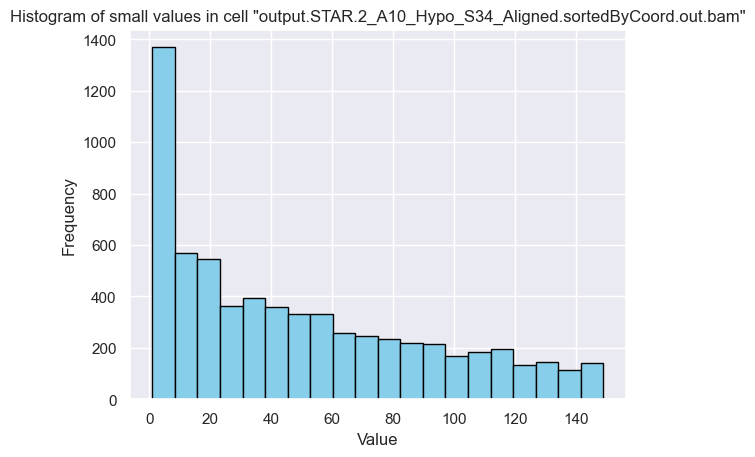

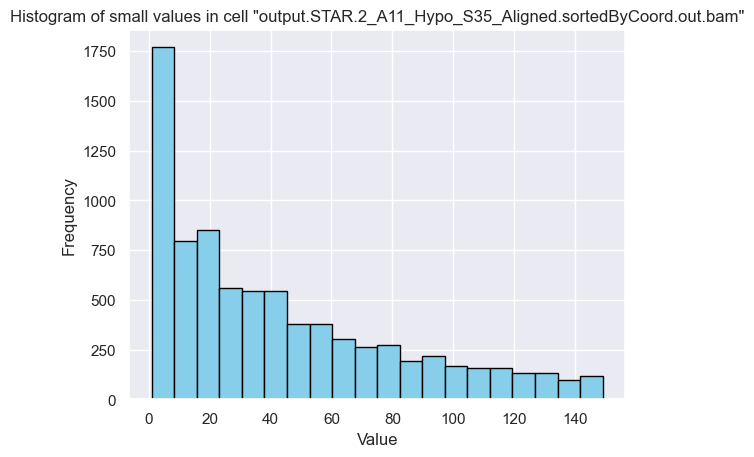

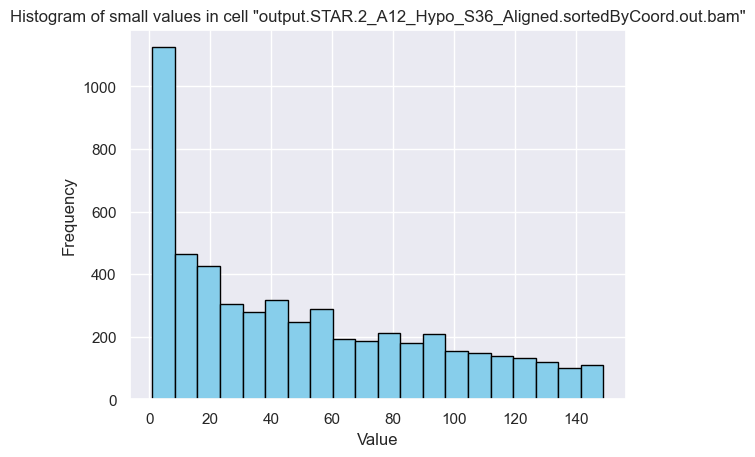

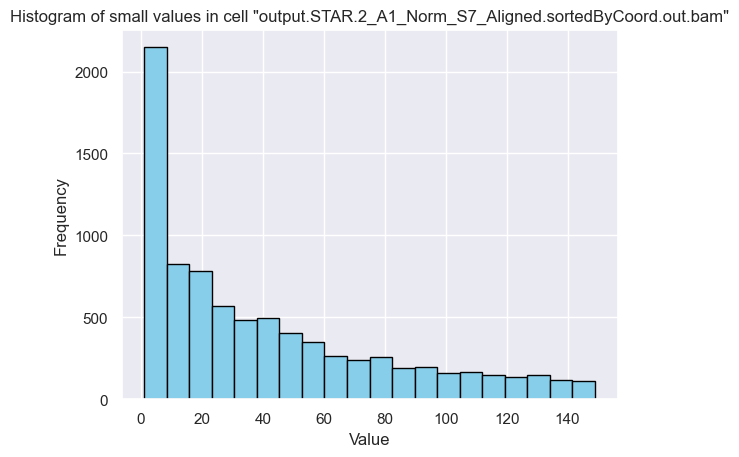

In [21]:
# Define a threshold for "small" values
threshold = 150  # Adjust this value as needed

df_mcf_ss_small_cell = df_mcf_ss_unfilt.iloc[:, 80:100]

for column_name in df_mcf_ss_small_cell:
    row_data = df_mcf_ss_small_cell[column_name]
    # Filter out zeroes and values greater than the threshold
    row_small_values = [value for value in row_data if 0 < value < threshold]
    
    # Plotting histogram
    plt.hist(row_small_values, bins=20, color='skyblue', edgecolor='black')

    # Adding labels and title
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of small values in cell {column_name}')
    
    # Displaying the plot
    plt.show()

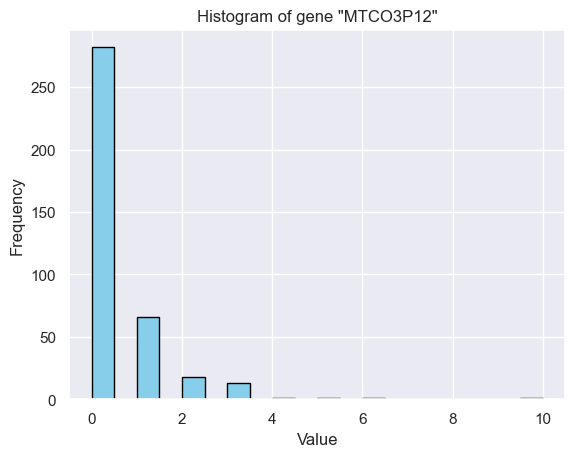

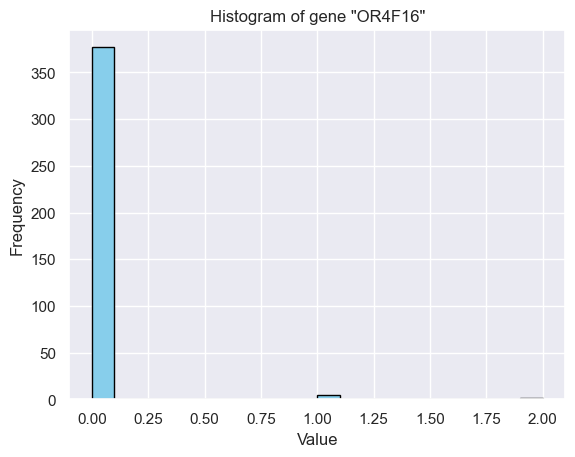

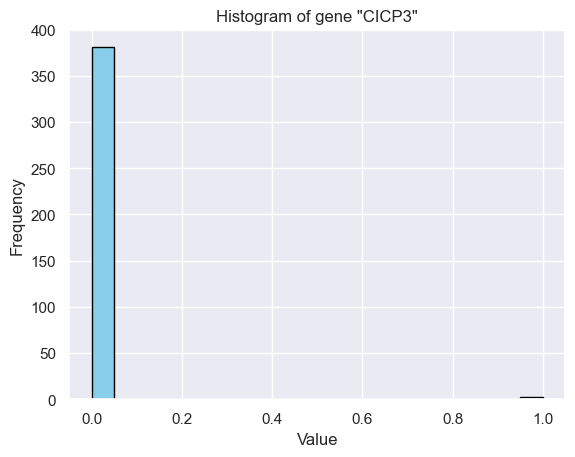

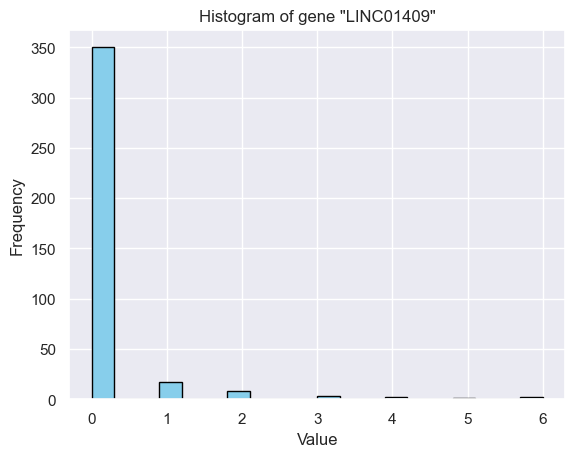

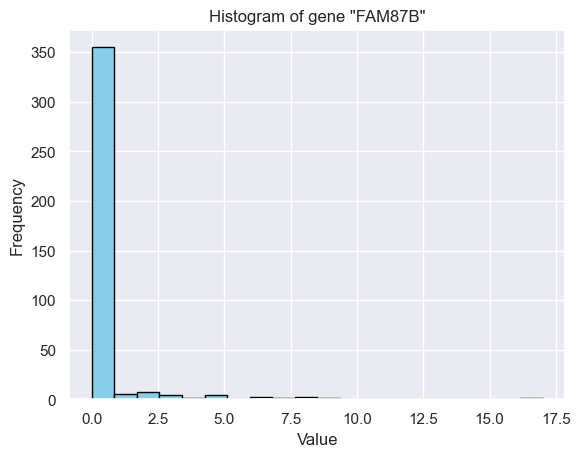

...

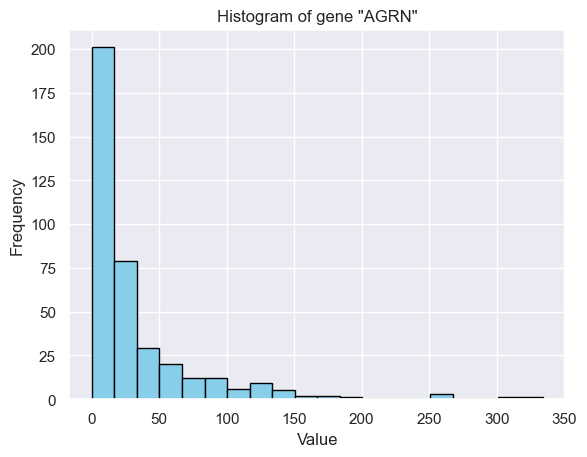

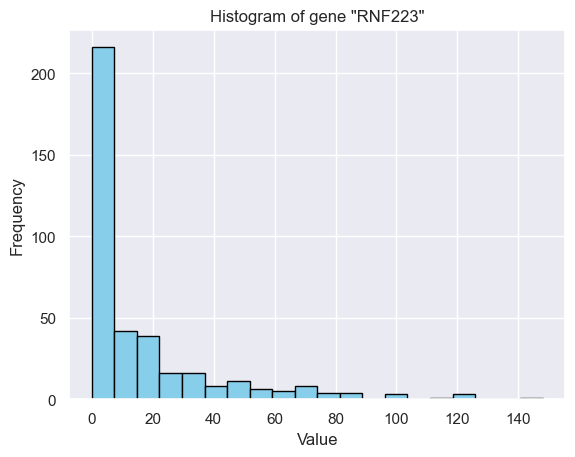

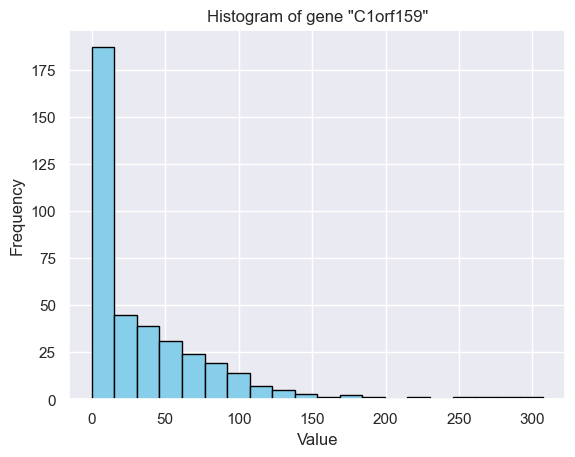

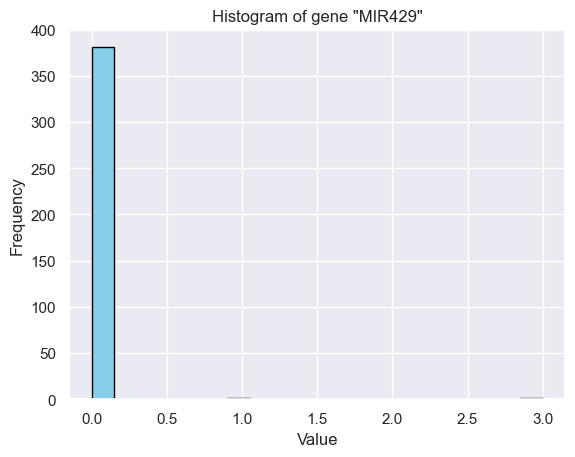

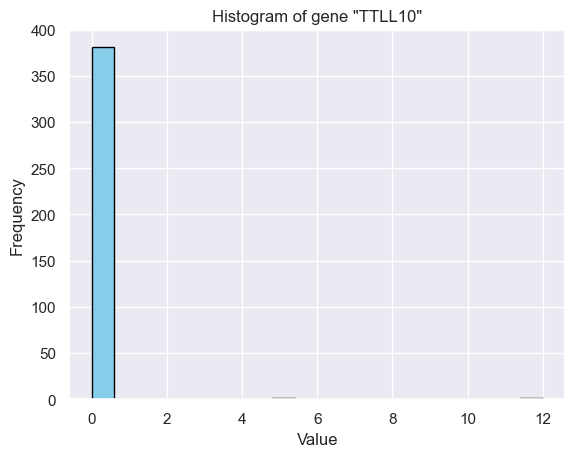

In [22]:
df_mcf_ss_small_gene = df_mcf_ss_unfilt.T.iloc[:, 10:30]
for column_name in df_mcf_ss_small_gene:
    row_data = df_mcf_ss_unfilt.T[column_name]
    
# Plotting histogram
    plt.hist(row_data, bins=20, color='skyblue', edgecolor='black')

# Adding labels and title
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of gene {column_name}')
    
# Displaying the plot
    plt.show()

#### Look at some descriptive statistic

In [23]:
df_mcf_ss_unfilt.describe()

,"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"""
count,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,...,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000
mean,40.817651,0.012253,86.442400,1.024636,14.531351,56.213613,75.397183,62.767725,67.396747,2.240734,...,17.362562,42.080230,34.692422,32.735284,21.992718,17.439391,49.242784,61.545609,68.289352,62.851400
std,465.709940,0.207726,1036.572689,6.097362,123.800530,503.599145,430.471519,520.167576,459.689019,25.449630,...,193.153757,256.775704,679.960908,300.291051,153.441647,198.179666,359.337479,540.847355,636.892085,785.670341
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,17.000000,0.000000,5.000000,0.000000,7.000000,23.000000,39.000000,35.000000,38.000000,1.000000,...,9.000000,30.000000,0.000000,17.000000,12.000000,9.000000,27.000000,30.000000,38.000000,33.000000
max,46744.000000,14.000000,82047.000000,289.000000,10582.000000,46856.000000,29534.000000,50972.000000,36236.000000,1707.000000,...,17800.000000,23355.000000,81952.000000,29540.000000,12149.000000,19285.000000,28021.000000,40708.000000,46261.000000,68790.000000


The data is sparse as most cells have many zero values, up until the 50% or even 75%.

In [24]:
df_mcf_ss_unfilt.T.describe()

,"""WASH7P""","""MIR6859-1""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""","""MTATP6P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
count,383.000000,383.000000,383.000000,383.00000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,...,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.00000,383.000000,383.000000,383.000000
mean,0.133159,0.026110,1.344648,0.05483,0.049608,6.261097,4.681462,0.524804,0.073107,222.054830,...,1.060052,0.443864,3.146214,1016.477807,204.600522,5.049608,2374.97389,2.083551,5.626632,1.749347
std,0.618664,0.249286,2.244543,0.31477,0.229143,7.565749,6.232649,0.980857,0.298131,262.616874,...,1.990566,1.090827,4.265352,1009.444811,220.781927,6.644302,2920.39000,3.372714,7.511180,3.895204
min,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,23.000000,...,0.000000,0.000000,0.000000,172.000000,30.500000,0.000000,216.50000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.00000,0.000000,3.000000,2.000000,0.000000,0.000000,98.000000,...,0.000000,0.000000,1.000000,837.000000,152.000000,3.000000,785.00000,0.000000,3.000000,0.000000
75%,0.000000,0.000000,2.000000,0.00000,0.000000,10.000000,7.000000,1.000000,0.000000,370.500000,...,1.000000,0.000000,5.000000,1549.000000,294.000000,7.000000,4059.00000,3.000000,8.000000,2.000000
max,9.000000,4.000000,20.000000,3.00000,2.000000,45.000000,36.000000,6.000000,2.000000,1662.000000,...,15.000000,8.000000,22.000000,8115.000000,2002.000000,46.000000,16026.00000,22.000000,56.000000,32.000000


Notice that genes are sparse as well, many of them are zero up to 50% or 75%, although there are also some which are not sparse at all (e.g. MT-ND5 as we can see from the table)

<Axes: xlabel='"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"'>

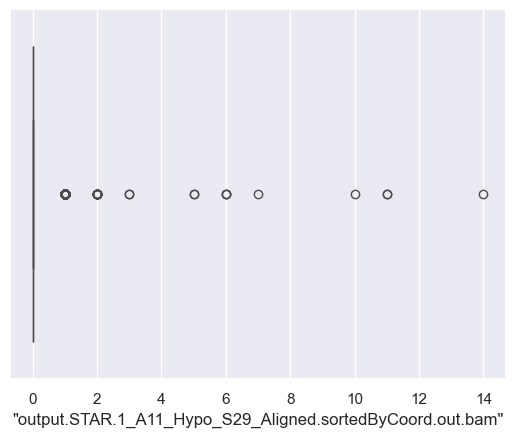

In [25]:
cnames = list(df_mcf_ss_unfilt.columns)
cnames[1]
sns.boxplot(x=df_mcf_ss_unfilt[cnames[1]])

<Axes: xlabel='"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"'>

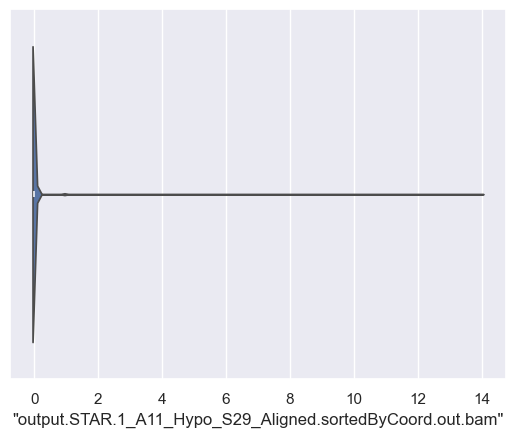

In [26]:
sns.violinplot(x=df_mcf_ss_unfilt[cnames[1]])

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

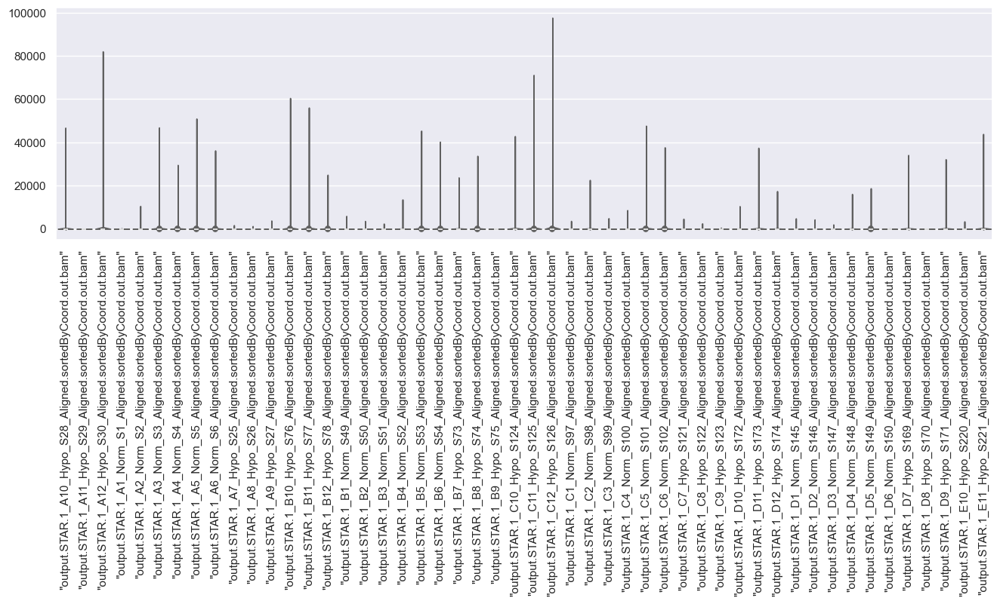

In [27]:
df_mcf_ss_unfilt_small = df_mcf_ss_unfilt.iloc[:, :50]
np.shape(df_mcf_ss_unfilt_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_mcf_ss_unfilt_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

The violin plot confirms sparsity of genes

#### Let's look for outliers


A standard appraoch with outliers is to compute the inter quantile range, and use this to define outliers and filter them as below.

In [28]:
Q1 = df_mcf_ss_unfilt.quantile(0.25)
Q3 = df_mcf_ss_unfilt.quantile(0.75)
IQR = Q3-Q1
print(IQR)

"output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"    17.0
"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"     0.0
"output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"     5.0
"output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam"       0.0
"output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam"       7.0
                                                              ... 
"output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam"     9.0
"output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam"    27.0
"output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam"    30.0
"output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam"    38.0
"output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"    33.0
Length: 383, dtype: float64


In [29]:
df_mcf_ss_unfilt_noOut = df_mcf_ss_unfilt[~((df_mcf_ss_unfilt < (Q1 - 1.5 * IQR)) |(df_mcf_ss_unfilt > (Q3 + 1.5 * IQR))).any(axis=1)]
df_mcf_ss_unfilt_noOut.head(3)

,"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"""
"""MIR6859-1""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""CICP3""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""FAM87B""",0,0,0,0,0,0,0,0,2,0,...,0,1,0,0,0,0,0,0,0,0


In [30]:
df_mcf_ss_unfilt_noOut.shape

(6435, 383)

More than half of the genes have been cut out. We look at violin plots again, with outliers removed

<Axes: xlabel='"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"'>

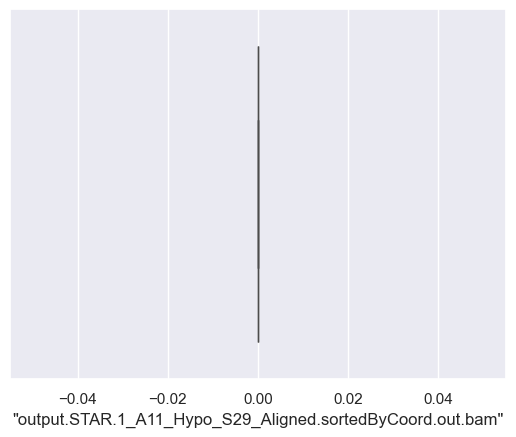

In [31]:
sns.boxplot(x=df_mcf_ss_unfilt_noOut[cnames[1]])

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

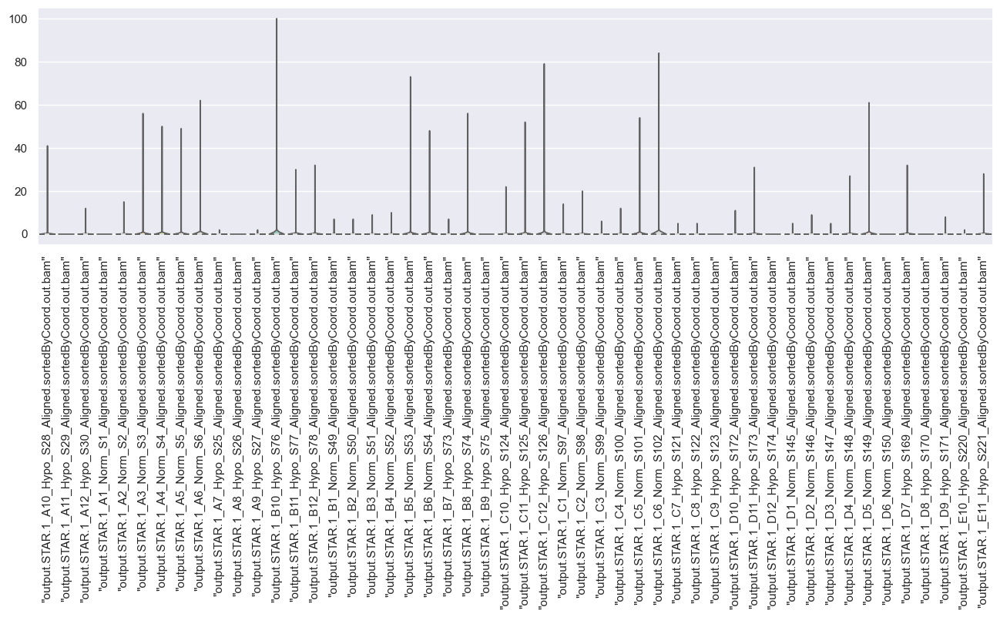

In [32]:
df_mcf_ss_unfilt_noOut_small = df_mcf_ss_unfilt_noOut.iloc[:, :50]
np.shape(df_mcf_ss_unfilt_noOut_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_mcf_ss_unfilt_noOut_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

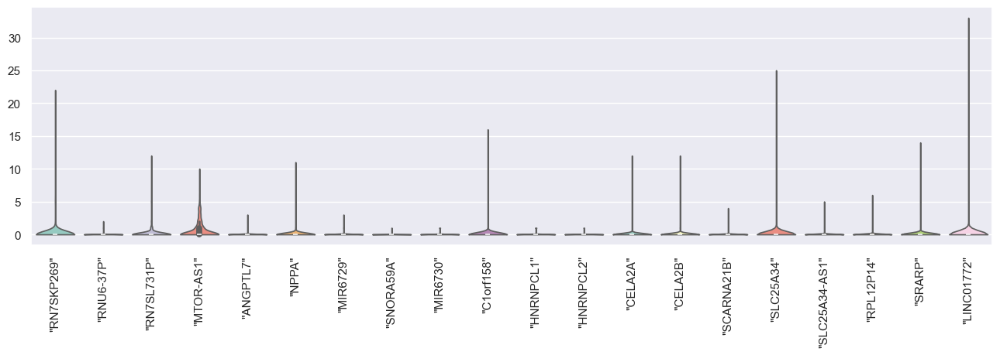

In [29]:
df_mcf_ss_unfilt_noOut_small = df_mcf_ss_unfilt_noOut.iloc[30:50,:].T
np.shape(df_mcf_ss_unfilt_noOut_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_mcf_ss_unfilt_noOut_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

It does not look good: outliers seem to be the values carrying information. 
Since we cannot remove outliers, we will try to remove the genes wich are more sparse

#### Sparsity

Let's look at the sparsity of the data

To compute sparsity, divide the number of non-zero elements by the total number of elements in the dataset

In [36]:
sparsity = sum((df_mcf_ss_unfilt==0).sum())/df_mcf_ss_unfilt.size
print("sparsity level:", sparsity)

sparsity level: 0.6021531646834907


In [37]:
sparsity = sum((df_mcf_ss_unfilt_noOut==0).sum())/df_mcf_ss_unfilt_noOut.size
print("sparsity level without outliers:", sparsity)

sparsity level without outliers: 0.9548755277214808


Notice that the sparsity increases when we remove outliers, which means that they carry some informations and therefore it is better not to remove them.

We try to remove the data which are more sparse to see whether we can remove them without losing important information

In [38]:
sparsity_cells= (df_mcf_ss_unfilt==0).sum()/df_mcf_ss_unfilt.shape[0]
sparsity_cells.sort_values()

"output.STAR.2_D6_Norm_S156_Aligned.sortedByCoord.out.bam"     0.454129
"output.STAR.3_A6_Norm_S18_Aligned.sortedByCoord.out.bam"      0.454783
"output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam"      0.465423
"output.STAR.4_F3_Norm_S261_Aligned.sortedByCoord.out.bam"     0.472137
"output.STAR.4_D5_Norm_S167_Aligned.sortedByCoord.out.bam"     0.473576
                                                                 ...   
"output.STAR.3_E7_Hypo_S229_Aligned.sortedByCoord.out.bam"     0.998823
"output.STAR.1_H5_Norm_S341_Aligned.sortedByCoord.out.bam"     0.999041
"output.STAR.1_G12_Hypo_S318_Aligned.sortedByCoord.out.bam"    0.999433
"output.STAR.1_D8_Hypo_S170_Aligned.sortedByCoord.out.bam"     0.999695
"output.STAR.1_H1_Norm_S337_Aligned.sortedByCoord.out.bam"     0.999956
Length: 383, dtype: float64

In [39]:
sparsity_genes = (df_mcf_ss_unfilt.T==0).sum()/df_mcf_ss_unfilt.T.shape[0]
sparsity_genes.sort_values()

"KRT8"         0.013055
"ACTB"         0.015666
"ALDOA"        0.015666
"KRT18"        0.015666
"GAPDH"        0.015666
                 ...   
"PECAM1"       0.994778
"RPL23AP23"    0.994778
"RPL26P29"     0.994778
"BEND7P1"      0.994778
"SLIT3"        0.994778
Length: 22934, dtype: float64

In [40]:
sparse_genes = (sparsity_genes > 0.95)
df_mcf_ss_genes_not_sparse = df_mcf_ss_unfilt.T.drop(df_mcf_ss_unfilt.T.columns[sparse_genes], axis=1)
print('Number of relevant genes:',df_mcf_ss_genes_not_sparse.shape[1])

Number of relevant genes: 16054


In [41]:
sparsity_genes_relevant = (df_mcf_ss_genes_not_sparse.T==0).sum()/df_mcf_ss_genes_not_sparse.T.shape[0]
sparsity_genes_relevant.sort_values()

"output.STAR.3_A6_Norm_S18_Aligned.sortedByCoord.out.bam"      0.235019
"output.STAR.2_D6_Norm_S156_Aligned.sortedByCoord.out.bam"     0.238632
"output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam"      0.248225
"output.STAR.4_F3_Norm_S261_Aligned.sortedByCoord.out.bam"     0.257755
"output.STAR.4_D5_Norm_S167_Aligned.sortedByCoord.out.bam"     0.260247
                                                                 ...   
"output.STAR.3_E7_Hypo_S229_Aligned.sortedByCoord.out.bam"     0.998380
"output.STAR.1_H5_Norm_S341_Aligned.sortedByCoord.out.bam"     0.998941
"output.STAR.1_G12_Hypo_S318_Aligned.sortedByCoord.out.bam"    0.999190
"output.STAR.1_D8_Hypo_S170_Aligned.sortedByCoord.out.bam"     0.999564
"output.STAR.1_H1_Norm_S337_Aligned.sortedByCoord.out.bam"     0.999938
Length: 383, dtype: float64

In [42]:
sparsity_relevant = sum((df_mcf_ss_genes_not_sparse==0).sum())/df_mcf_ss_genes_not_sparse.size
print("sparsity level:", sparsity_relevant)

sparsity level: 0.4390329504762159


The sparsity level has improved significantly: we confirm this by plotting some graphs

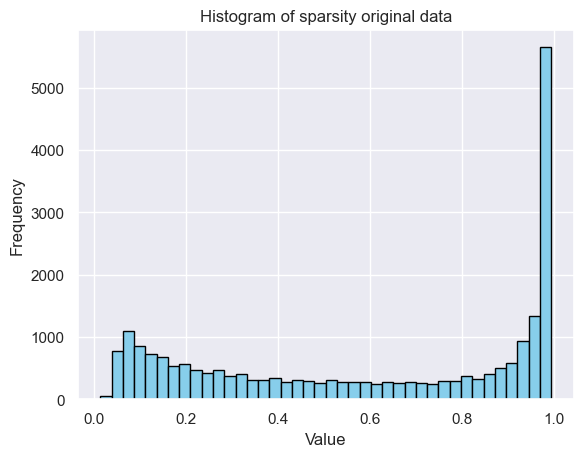

In [43]:
plt.hist(sparsity_genes, bins=40, color='skyblue', edgecolor='black')

# Adding labels and titl
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title(f'Histogram of sparsity original data')
    
# Displaying the plot
plt.show()

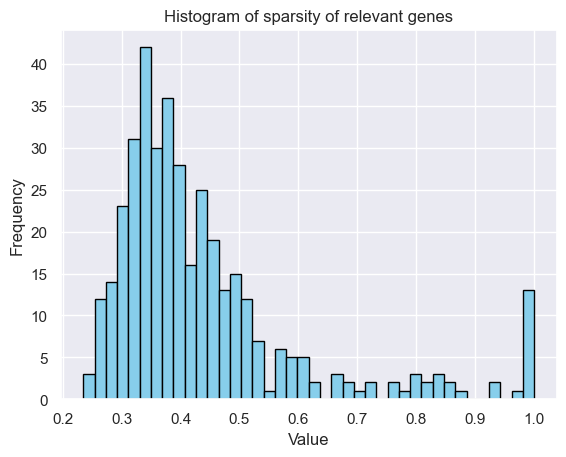

In [44]:
plt.hist(sparsity_genes_relevant, bins=40, color='skyblue', edgecolor='black')

# Adding labels and titl
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title(f'Histogram of sparsity of relevant genes')
    
# Displaying the plot
plt.show()

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

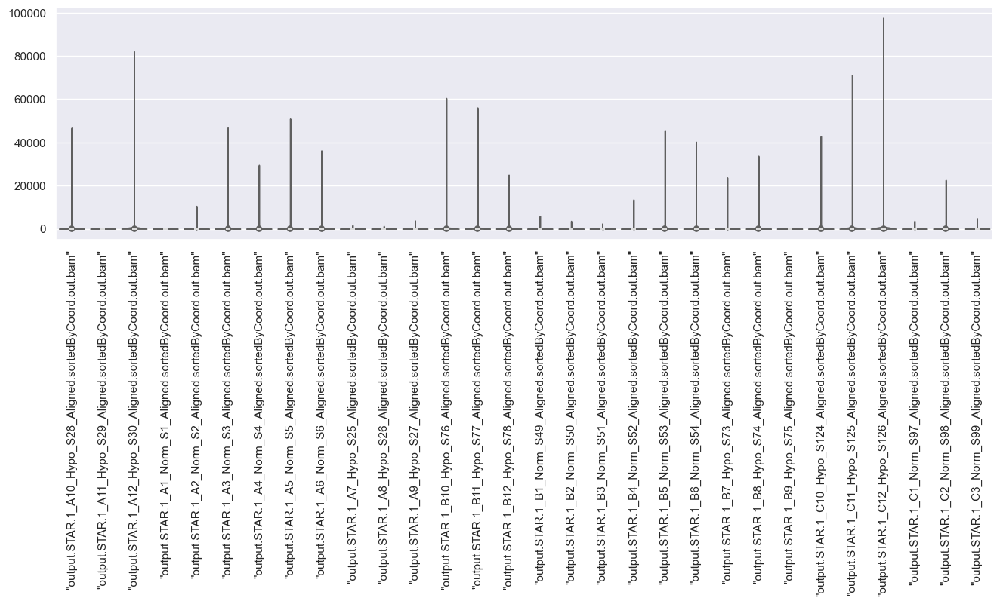

In [45]:
df_mcf_ss_small_genes_not_sparse = df_mcf_ss_genes_not_sparse.iloc[:30,:].T
np.shape(df_mcf_ss_small_genes_not_sparse)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_mcf_ss_small_genes_not_sparse,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

We now inspect summary statistics of the distribution of the data, by looking at the Skewness and Kurtosis of the gene expression profiles from both the original data and the data obtained by reducing the sparsity.

Text(0.5, 0, 'Skewness of single cells expression profiles - original df')

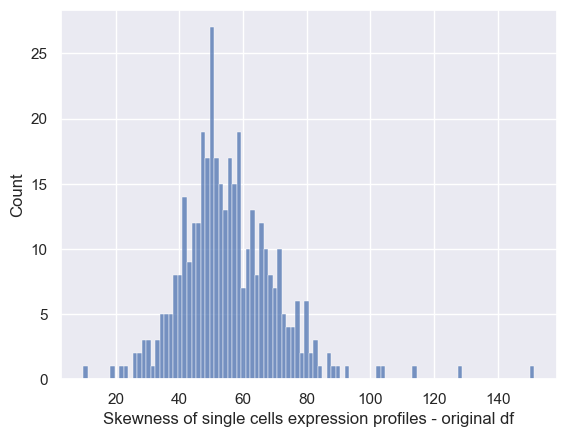

In [46]:
#skewness
from scipy.stats import kurtosis, skew
colN = np.shape(df_mcf_ss_unfilt)[1]
colN
df_mcf_ss_unfilt_skew_cells = []
for i in range(colN) :     
     v_df_mcf_ss_unfilt = df_mcf_ss_unfilt[cnames[i]]
     df_mcf_ss_unfilt_skew_cells += [skew(v_df_mcf_ss_unfilt)]   
  #  df_skew_cells += [df_unfilt[cnames[i]].skew()]
df_mcf_ss_unfilt_skew_cells
sns.histplot(df_mcf_ss_unfilt_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - original df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - original df')

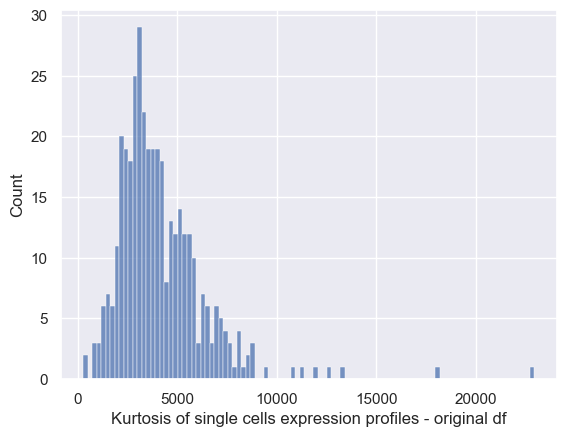

In [47]:
#kurtosis
df_mcf_ss_unfilt_kurt_cells = []
for i in range(colN) :     
     v_df_mcf_ss_unfilt = df_mcf_ss_unfilt[cnames[i]]
     df_mcf_ss_unfilt_kurt_cells += [kurtosis(v_df_mcf_ss_unfilt)]   
 #   df_unfilt_kurt_cells += [df_unfilt[cnames[i]].kurt()]
df_mcf_ss_unfilt_kurt_cells
sns.histplot(df_mcf_ss_unfilt_kurt_cells,bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - original df')

In [48]:
xnorm = np.random.normal(0, 2, 10000000)   # create random values based on a normal distribution
xnorm 

print( "Excess kurtosis of normal distribution: ",  kurtosis(xnorm) )
print( "Skewness of normal distribution: ", skew(xnorm) )

Excess kurtosis of normal distribution:  0.0003216458622836704
Skewness of normal distribution:  0.0006902796921178493


Text(0.5, 0, 'Skewness of single cells expression profiles - not sparse df')

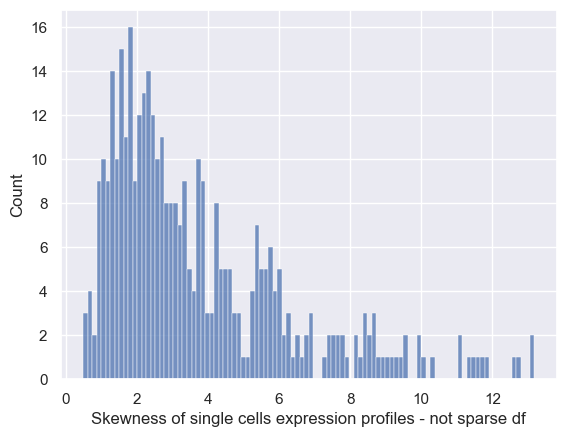

In [49]:
df_mcf_ss_genes_not_sparse_skew_cells = []
cnames = list(df_mcf_ss_genes_not_sparse.columns)
for i in range(colN) :     
     v_df_mcf_ss_genes_not_sparse = df_mcf_ss_genes_not_sparse[cnames[i]]
     df_mcf_ss_genes_not_sparse_skew_cells += [skew(v_df_mcf_ss_genes_not_sparse)]   
df_mcf_ss_genes_not_sparse_skew_cells
sns.histplot(df_mcf_ss_genes_not_sparse_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - not sparse df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - not sparse df')

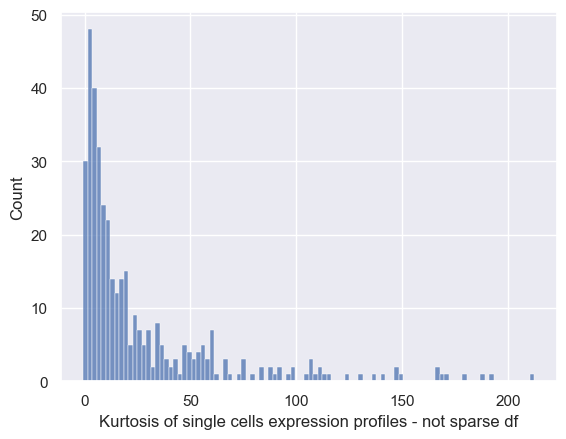

In [50]:
df_mcf_ss_genes_not_sparse_kurt_cells = []
for i in range(colN) :     
     v_df_mcf_ss_genes_not_sparse = df_mcf_ss_genes_not_sparse[cnames[i]]
     df_mcf_ss_genes_not_sparse_kurt_cells += [kurtosis(v_df_mcf_ss_genes_not_sparse)] 
df_mcf_ss_genes_not_sparse_kurt_cells
sns.histplot(df_mcf_ss_genes_not_sparse_kurt_cells,bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - not sparse df')

The distribution are highly non-normal, skewed with heavy tails, so it is far from being normal.
Moreover, the values observed have higher probability of falling on the right side of the distribution rather than on the left side.
This creates a mismatch between observed and imputed data which could adversely affect the estimates of interest.
The effect of non-normality is generally small for measures that rely on the center of the distribution, like means or regression weights, but it could be substantial for estimates like a variance or
a percentile. 
In general, normal imputations appear to be robust against violations of normality.

#### Data transformation:

We apply a logaritmic transformation to the data in order to see if it makes the distributions more similar to the normal

<Axes: xlabel='"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"'>

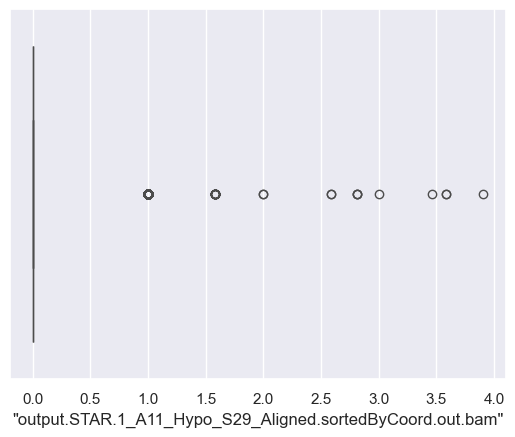

In [57]:
cnames = list(df_mcf_ss_unfilt.columns)
cnames[1]
df11_log2 = np.log2(df_mcf_ss_unfilt[cnames[1]]+1)
sns.boxplot(x=df11_log2)

<Axes: xlabel='"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"'>

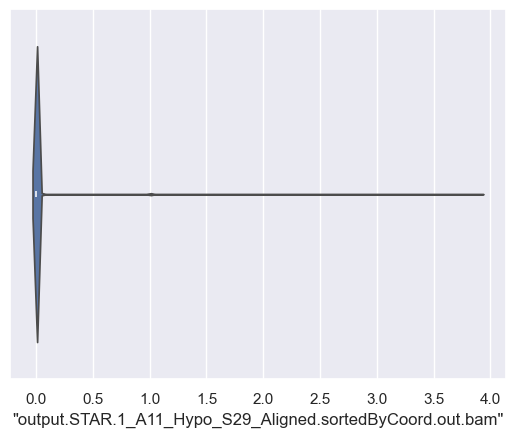

In [58]:
sns.violinplot(x=df11_log2)

We check the summary statistics again

In [59]:
display(df11_log2.describe().round(2))

count    22934.00
mean         0.01
std          0.12
min          0.00
25%          0.00
50%          0.00
75%          0.00
max          3.91
Name: "output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam", dtype: float64

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

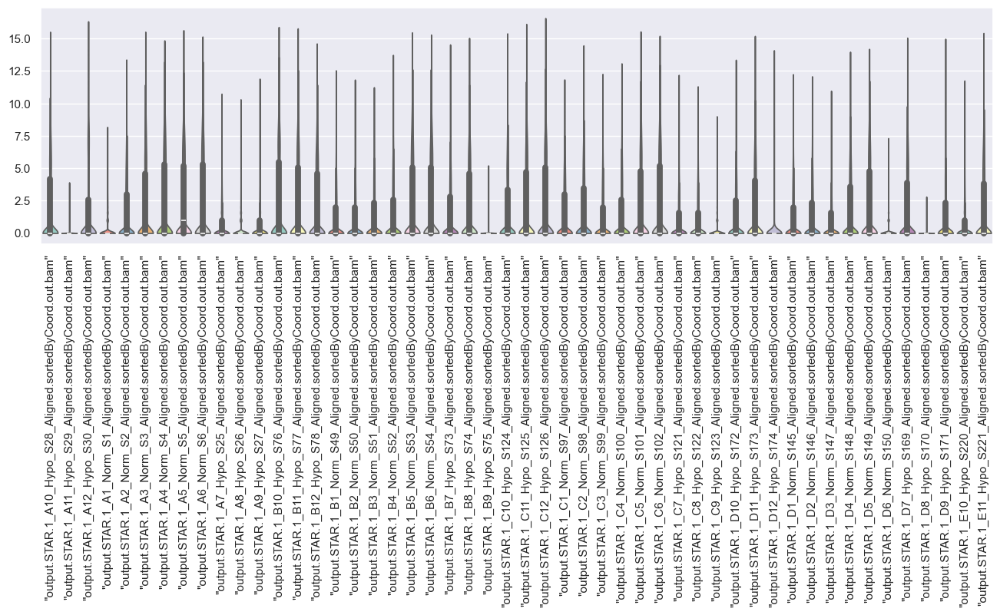

In [60]:
df1 = df_mcf_ss_unfilt + 1
df1_log2 = df1.apply(np.log2)
# I'm selecting part of the data as the plots would otherwise take too long to generate
df1_log2_small = df1_log2.iloc[:, :50]
np.shape(df1_log2_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df1_log2_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

Text(0.5, 0, 'Skewness of single cells expression profiles - log2 df')

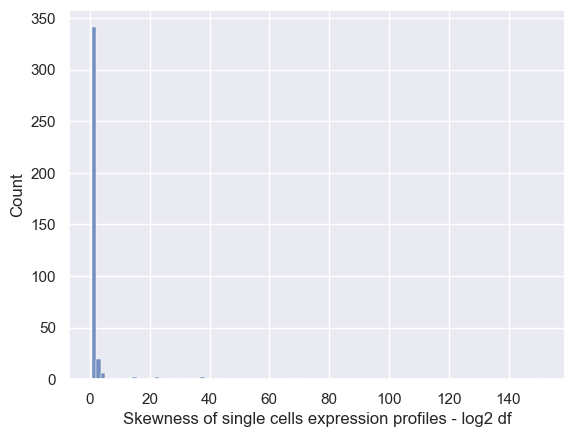

In [61]:
df1_log2_skew_cells = []
for i in range(colN) :     
     v_df_mcf_ss= df1_log2[cnames[i]]
     df1_log2_skew_cells += [skew(v_df_mcf_ss)]   
df1_log2_skew_cells
sns.histplot(df1_log2_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - log2 df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - log2 df')

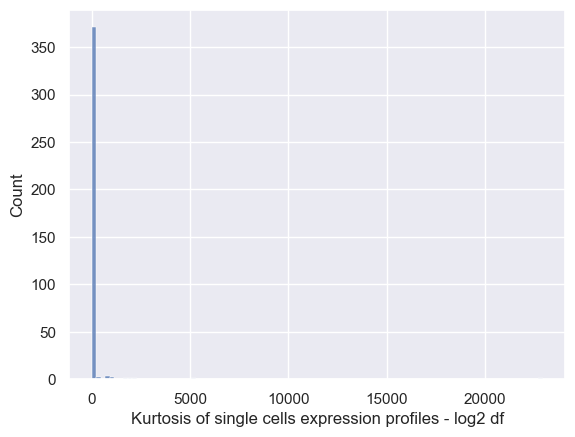

In [62]:
df1_log2_kurt_cells = []
for i in range(colN) :     
     v_df_mcf_ss = df1_log2[cnames[i]]
     df1_log2_kurt_cells += [kurtosis(v_df_mcf_ss)] 
df1_log2_kurt_cells
sns.histplot(df1_log2_kurt_cells,bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - log2 df')

It looks even less normalized, let's try a cube root transformation to see if something better comes out

<Axes: xlabel='"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"'>

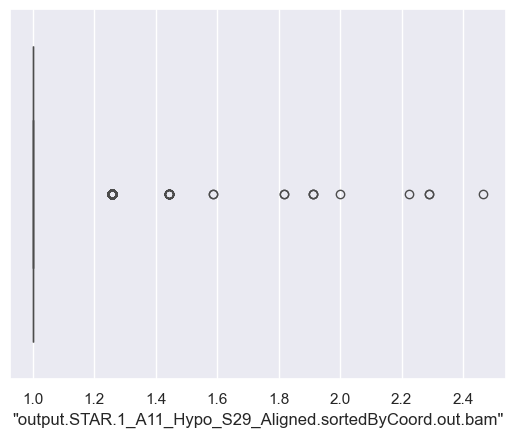

In [63]:
df_mcf_ss_cbrt = np.cbrt(df_mcf_ss_unfilt[cnames[1]]+1)
sns.boxplot(x=df_mcf_ss_cbrt)

<Axes: xlabel='"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"'>

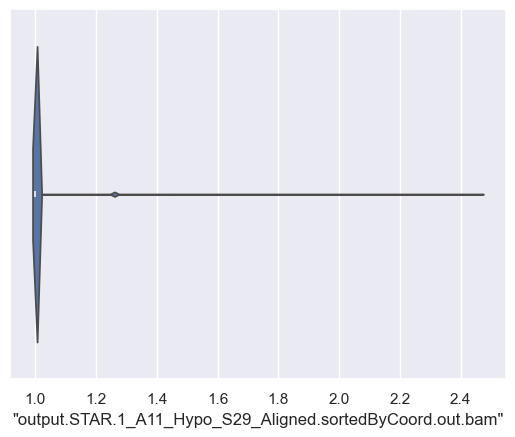

In [64]:
sns.violinplot(x=df_mcf_ss_cbrt)

In [65]:
display(df_mcf_ss_cbrt.describe().round(2))

count    22934.00
mean         1.00
std          0.03
min          1.00
25%          1.00
50%          1.00
75%          1.00
max          2.47
Name: "output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam", dtype: float64

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

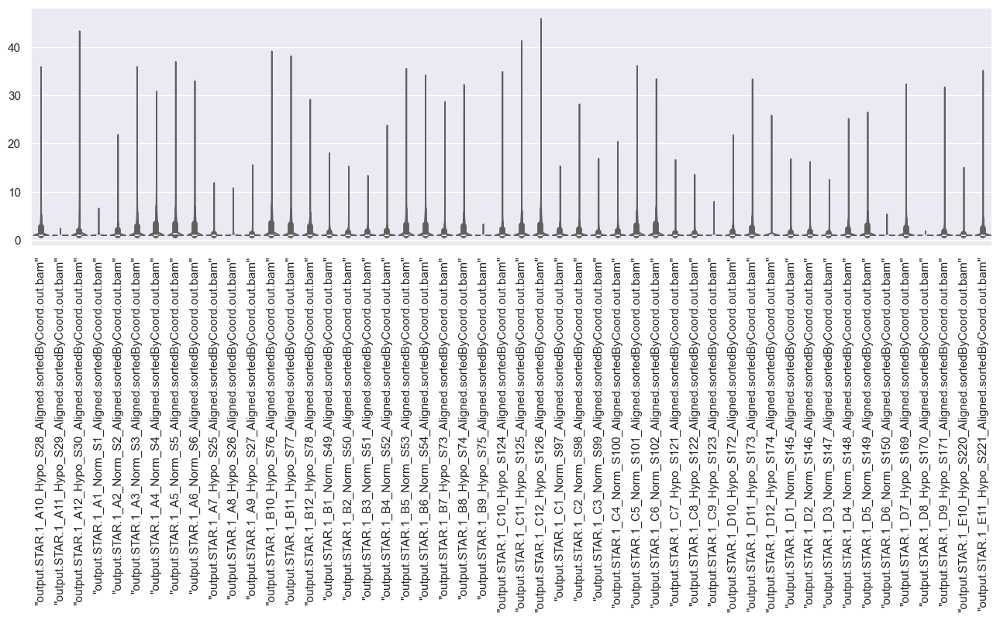

In [66]:
df1 = df_mcf_ss_unfilt + 1
df_mcf_ss_cbrt = df1.apply(np.cbrt)
# I'm selecting part of the data as the plots would otherwise take too long to generate
df_mcf_ss_cbrt_small = df_mcf_ss_cbrt.iloc[:, :50]
np.shape(df_mcf_ss_cbrt_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_mcf_ss_cbrt_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

Text(0.5, 0, 'Skewness of single cells expression profiles - cube root df')

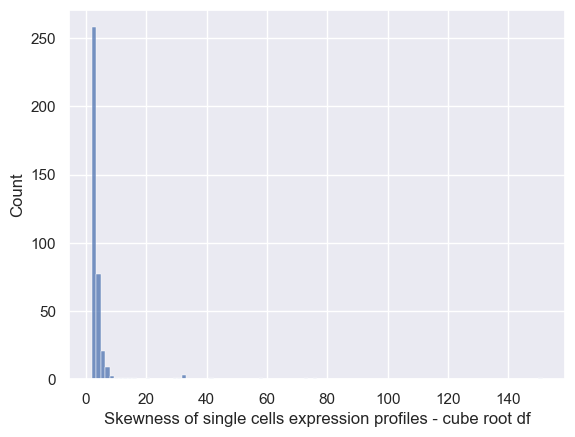

In [67]:
df_mcf_ss_cbrt_skew_cells = []
for i in range(colN) :     
     v_df_mcf_ss_unfilt_cb = df_mcf_ss_cbrt[cnames[i]]
     df_mcf_ss_cbrt_skew_cells += [skew(v_df_mcf_ss_unfilt_cb)]   
df_mcf_ss_cbrt_skew_cells
sns.histplot(df_mcf_ss_cbrt_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - cube root df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - cube root df')

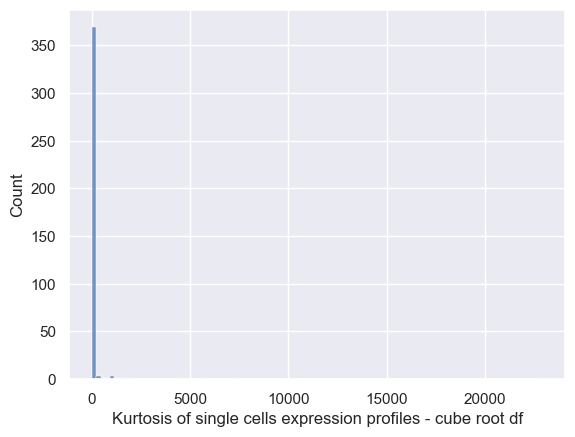

In [68]:
df_mcf_ss_cbrt_kurt_cells = []
for i in range(colN) :     
     v_df_mcf_ss_unfilt_cb = df_mcf_ss_cbrt[cnames[i]]
     df_mcf_ss_cbrt_kurt_cells += [kurtosis(v_df_mcf_ss_unfilt_cb)] 
df_mcf_ss_cbrt_kurt_cells
sns.histplot(df_mcf_ss_cbrt_kurt_cells,bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - cube root df')

The distributions still don't look normalized 

Each single cell was sequenced independently, so there might be need of normalizing the data between cells. Let's plot the gene expression distributions for each cell, and compare them.

C:\Users\giuli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


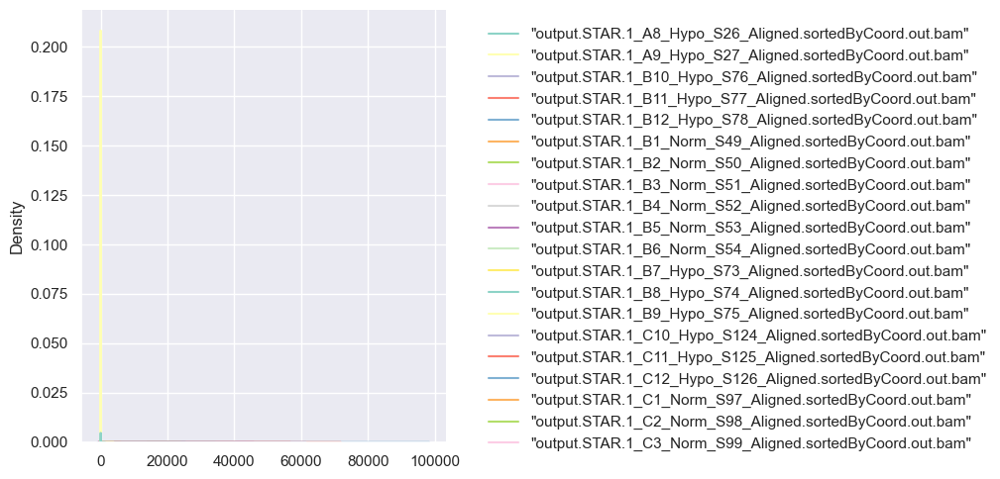

In [69]:
df_mcf_ss_unfilt_small = df_mcf_ss_unfilt.iloc[:, 10:30]  #just selecting part of the samples so run time not too long
sns.displot(data=df_mcf_ss_unfilt_small,palette="Set3",kind="kde", bw_adjust=2)

Let's try again with a logarithm transformation

C:\Users\giuli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


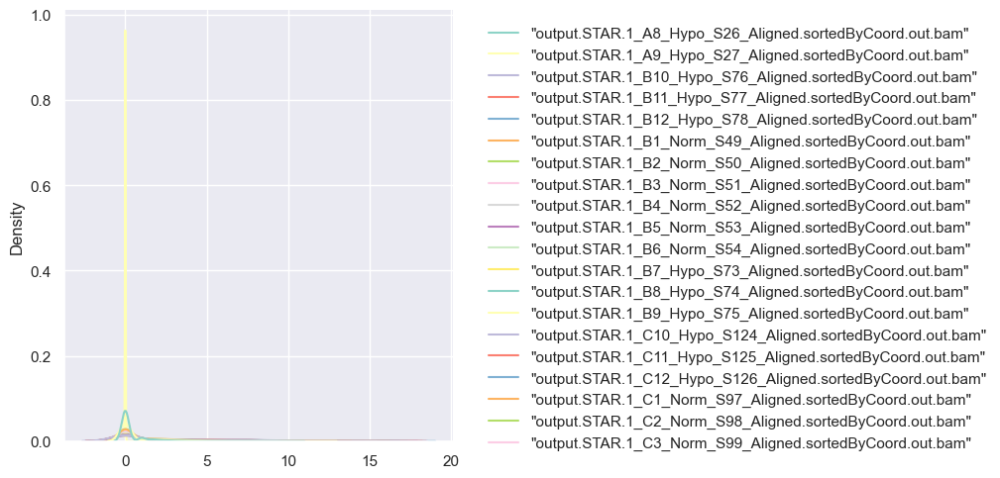

In [73]:
##normalization with logarithm transformation
df_mcf_ss_small = df1_log2.iloc[:, 10:0]  #just selecting part of the samples so run time not too long
sns.displot(data=df_mcf_ss_small,palette="Set3",kind="kde", bw_adjust=2)

It looks better but the data is still not normalized

We plot the filtered dataset

C:\Users\giuli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


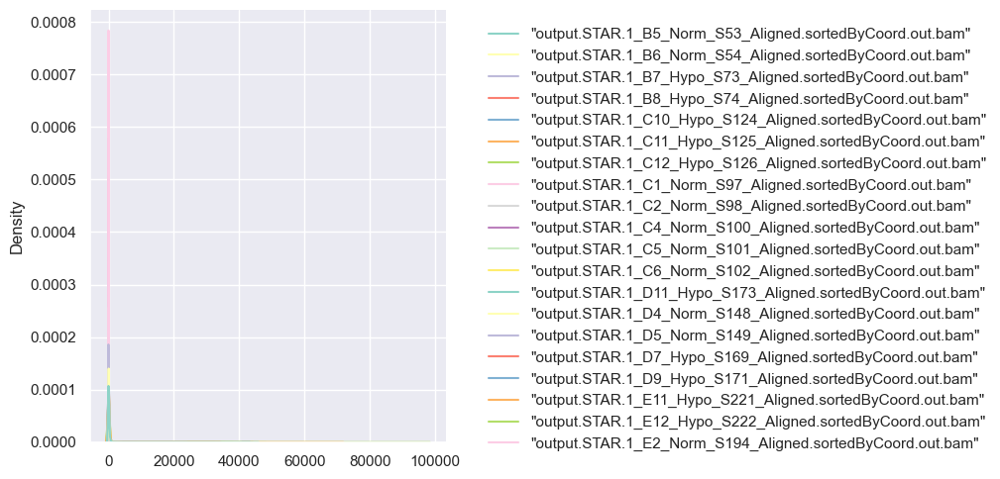

In [77]:
df_mcf_ss_small_filt = df_mcf_ss_filt.iloc[:, 10:30]  #just selecting part of the samples so run time not too long
sns.displot(data=df_mcf_ss_small_filt,palette="Set3",kind="kde", bw_adjust=2)

Let's apply the logarithm transformation to the filtered data as well

C:\Users\giuli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Distribution of gene expression of all cells')

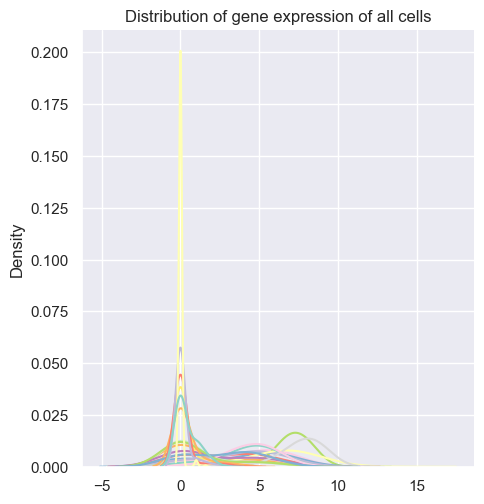

In [78]:
df_mcf_ss_log = (df_mcf_ss_filt.T+1).apply(np.log2)
df_mcf_ss_small_log = df_mcf_ss_log.iloc[:, 10:30]
sns.displot(data=df_mcf_ss_small_log,palette="Set3",kind="kde", bw_adjust=2, legend=False)
plt.title('Distribution of gene expression of all cells')

The distributions still don't look normalized and they also seem to have different means

Now we try to scale the filtered data 

In [79]:
from sklearn.preprocessing import StandardScaler

scaler = sklearn.preprocessing.StandardScaler().fit(df_mcf_ss_filt)
df_mcf_ss_scal= pd.DataFrame(scaler.transform(df_mcf_ss_filt), columns = df_mcf_ss_filt.columns)

C:\Users\giuli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


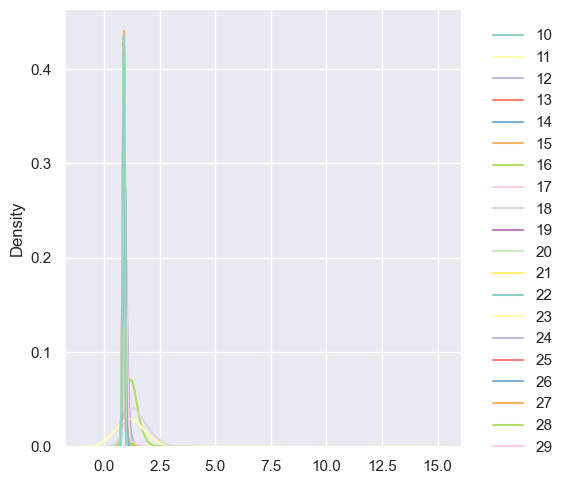

In [80]:
X_scal = (df_mcf_ss_scal.T+1)
df_mcf_ss_small_scal = X_scal.iloc[:, 10:30]  #just selecting part of the samples so run time not too long
sns.displot(data=df_mcf_ss_small_scal,palette="Set3",kind="kde", bw_adjust=2)

The plot looks a bit more normalized but still with different means

We plot the normalized dataset

In [190]:
df_mcf_ss_small_norm = df_mcf_ss_train.iloc[:, 10:30]  #just selecting part of the samples so run time not too long
sns.displot(data=df_mcf_ss_small_norm,palette="Set3",kind="kde", bw_adjust=2)

NameError: name 'df_mcf_ss_train' is not defined

In [84]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.stats import chi2_contingency

The libraries that are used in this notebook are imported

In [85]:
# Load the metadata
print("Dataframe dimensions:", df_mcf_ss_meta.shape)
print("First column: ", df_mcf_ss_meta.iloc[:, 0])
df_mcf_ss_meta.head()


Dataframe dimensions: (383, 8)
First column:  Filename
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam      MCF7
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam      MCF7
                                                            ... 
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam    MCF7
Name: Cell Line, Length: 383, dtype: object


,Cell Line,Lane,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A10,Hypo,72,S28,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A11,Hypo,72,S29,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A12,Hypo,72,S30,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A1,Norm,72,S1,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A2,Norm,72,S2,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


I upload the MCF7 Metadata into the dataframe, in order to check that the dataset is uploaded succesfully I am displaying the first few rows. Thus, providing a quick glimpse into the dataset, through this process I am able to ensure that all necessary columns are present. This initial inspection helps in identifying any immediate issues with the data, such as missing columns or unexpected data types. Luckly, we can check visually that none of the columns are missing and that the dataset was uploaded correctly.

In [86]:
# Check for duplicate rows
duplicate_rows = df_mcf_ss_meta.duplicated().sum()
print("Number of duplicate rows:", duplicate_rows)

Number of duplicate rows: 0


In order to mantain the integrity of the analysis we check for duplicate rows, in fact the presence of duplicate rows might affect and lead to incorrect conclusions. In case a duplicate row was present, luckly there were none, removing them would have ensured that each sample is uniquely represented, preventing bias in the analysis. This step is critical for the accuracy of statistical tests.

In [87]:
# Identify columns with only one unique value
columns_to_drop = [col for col in df_mcf_ss_meta.columns if df_mcf_ss_meta[col].nunique() == 1]

# Drop these columns
df_mcf_ss_meta_cleaned = df_mcf_ss_meta.drop(columns=columns_to_drop)

# Print the resulting DataFrame shape and the dropped columns
print("Dropped columns:", columns_to_drop)
print("Data shape after dropping uniform columns:", df_mcf_ss_meta_cleaned.shape)
print("First few rows of cleaned data:\n", df_mcf_ss_meta_cleaned.head())


Dropped columns: ['Cell Line', 'Hours', 'PreprocessingTag', 'ProcessingComments']
Data shape after dropping uniform columns: (383, 4)
First few rows of cleaned data:
                                                              Lane  Pos  \
Filename                                                                 
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoor...  output.STAR.1  A10   
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoor...  output.STAR.1  A11   
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoor...  output.STAR.1  A12   
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord....  output.STAR.1   A1   
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord....  output.STAR.1   A2   

                                                   Condition Cell name  
Filename                                                                
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoor...      Hypo       S28  
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoor...      Hypo       S29  
output.STAR.1_A12_Hypo

To make the processing of informations and data easier for the future codes the code reduces noises and tries to ensure that only useful information is left in the dataset, as useful is intentended columns that include changing variables. Furthermore, dropping uniform columns makes the dataset skinniner, making it more manageable for my computer. Also the filename columns contain information that are also contained in the other columns, but because it gives a summary for each cell I decided to keep it.

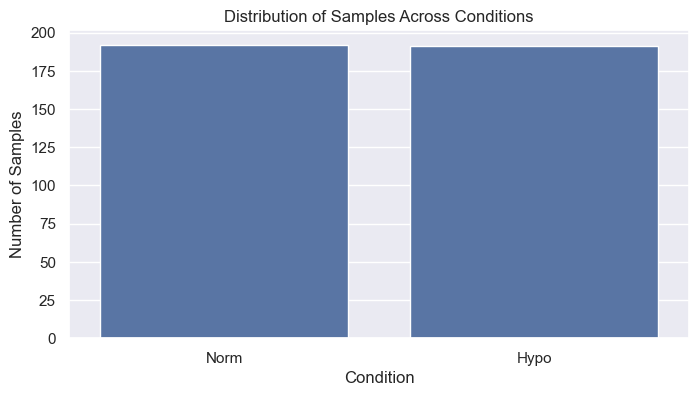

In [88]:
# Distribution of samples across conditions
condition_counts = df_mcf_ss_meta['Condition'].value_counts()
plt.figure(figsize=(8, 4))
sns.barplot(x=condition_counts.index, y=condition_counts.values)
plt.title('Distribution of Samples Across Conditions')
plt.xlabel('Condition')
plt.ylabel('Number of Samples')
plt.show()

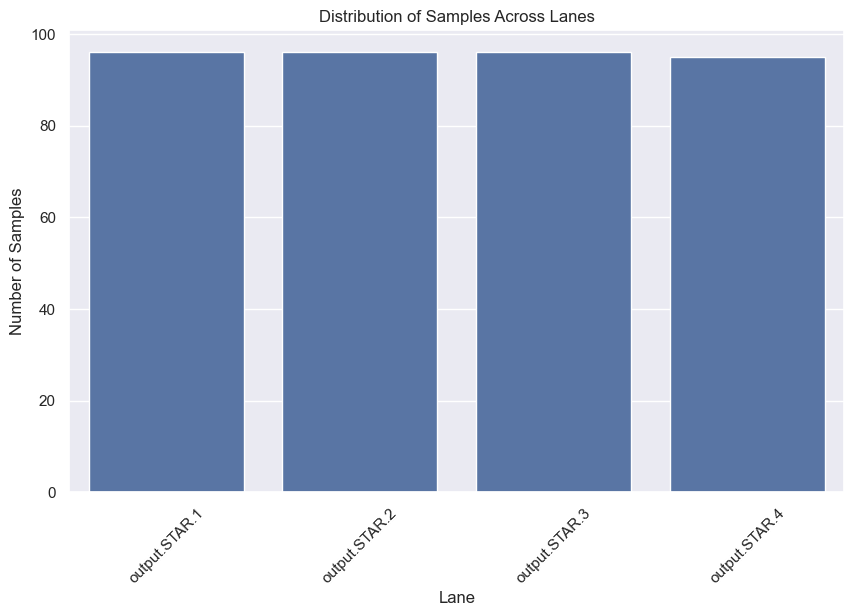

In [89]:
# Distribution of samples across Lanes
lane_counts = df_mcf_ss_meta['Lane'].value_counts()
plt.figure(figsize=(10, 6))
sns.barplot(x=lane_counts.index, y=lane_counts.values)
plt.title('Distribution of Samples Across Lanes')
plt.xlabel('Lane')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


Bar plots are created to visualize the distribution of samples across different conditions and Lanes. This helps in understanding the balance of samples within the dataset, ensuring that comparisons between conditions are fair. Visualizing the distribution of samples reveals potential biases or imbalances that could affect the analysis. It provides a clear picture of how the experimental conditions are represented in the dataset. In these cases we can see that there is around a 51% of cells that suffer from hypoxia and a 49% that doesn't, showing basically no significant bias. Furthermore, from the distribution accross the PCR plates we can see that all 4 lanes have around the same number of lanes, except for the third one that is missing a few. 

In [90]:
# Ensure there are no missing values
missing_values = df_mcf_ss_meta.isnull().sum()
print("Missing values in each column:\n", missing_values)

Missing values in each column:
 Cell Line             0
Lane                  0
Pos                   0
Condition             0
Hours                 0
Cell name             0
PreprocessingTag      0
ProcessingComments    0
dtype: int64


The code checks for missing values in the dataset and prints the count for each column. Because there are no missing values in the metadata, there in no need to handle them, which would have been fundamental in order to ensure the integrity of the analysis.

In [91]:
# Count the number of unique values in each categorical column
unique_counts = df_mcf_ss_meta.select_dtypes(include=[object]).nunique()
print("Unique Counts in Categorical Columns:\n", unique_counts)


Unique Counts in Categorical Columns:
 Cell Line               1
Lane                    4
Pos                    98
Condition               2
Cell name             383
PreprocessingTag        1
ProcessingComments      1
dtype: int64


The number of unique values in each categorical column is counted and printed. This helps in understanding the variability within these columns and identifying potential issues. Knowing the number of unique values in categorical columns helps in detecting anomalies and ensuring that the dataset is well-structured. It also provides insights into the diversity of the experimental conditions. Through these numbers, and a visually inspection of the file I can be sure that all the columns containing what they should.

In [92]:
# Count the number of occurrences for each Pos
pos_counts = df_mcf_ss_meta['Pos'].value_counts()

# Print the counts for each position
for pos, count in pos_counts.items():
    print(f"{pos} total = {count}")


A10 total = 4
F10 total = 4
F7 total = 4
F6 total = 4
F5 total = 4
F4 total = 4
F3 total = 4
F2 total = 4
F1 total = 4
F12 total = 4
F11 total = 4
E9 total = 4
F9 total = 4
E8 total = 4
E7 total = 4
E6 total = 4
E5 total = 4
E4 total = 4
E3 total = 4
E2 total = 4
E1 total = 4
E12 total = 4
F8 total = 4
G10 total = 4
E10 total = 4
H10 total = 4
H9 total = 4
H8 total = 4
H7 total = 4
H6 total = 4
H5 total = 4
H4 total = 4
H3 total = 4
H2 total = 4
H1 total = 4
G9 total = 4
G11 total = 4
G8 total = 4
G7 total = 4
G6 total = 4
G5 total = 4
G4 total = 4
G3 total = 4
G2 total = 4
G1 total = 4
G12 total = 4
A11 total = 4
E11 total = 4
D9 total = 4
B10 total = 4
B7 total = 4
B6 total = 4
B5 total = 4
B4 total = 4
B3 total = 4
B2 total = 4
B1 total = 4
B12 total = 4
B11 total = 4
A9 total = 4
B9 total = 4
A8 total = 4
A7 total = 4
A6 total = 4
A5 total = 4
A4 total = 4
A3 total = 4
A2 total = 4
A1 total = 4
A12 total = 4
D8 total = 4
B8 total = 4
C10 total = 4
D7 total = 4
D5 total = 4
D4 total

Number of occurrences of the number 4 in the contingency table: 94


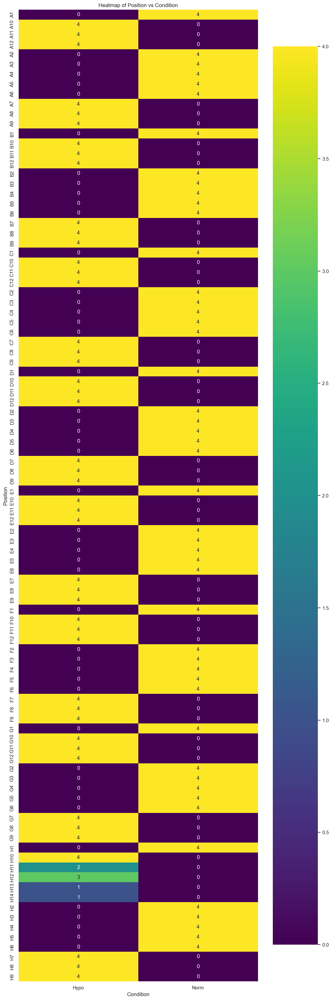

In [93]:
# Create a contingency table of Pos vs Condition
contingency_table = pd.crosstab(df_mcf_ss_meta['Pos'], df_mcf_ss_meta['Condition'])

# Count the number of occurrences of the number 4 in the contingency table
count_of_fours = (contingency_table == 4).sum().sum()

# Print the result
print("Number of occurrences of the number 4 in the contingency table:", count_of_fours)

# Plot the heatmap
plt.figure(figsize=(12, len(contingency_table) * 0.4))
sns.heatmap(contingency_table, annot=True, cmap='viridis')
plt.title('Heatmap of Position vs Condition')
plt.xlabel('Condition')
plt.ylabel('Position')
plt.show()


The heatmap is generated to visualize the location of cells in different Lanes under the two conditions, hypoxia and Normoxia. This visualization helps in identifying any patterns or biases in the placement of samples within the Lanes. By visualizing the cell locations, we can detect any systematic errors or biases in sample placement that might affect the results. This step ensures the experimental setup is robust and unbiased, indicating areas with higher or lower expression levels under different conditions. In this case, we can see that the positions on the Lanes always predicts it's condition.

In [94]:
# Create a contingency table of Pos vs Condition
contingency_table = pd.crosstab(df_mcf_ss_meta_cleaned['Pos'], df_mcf_ss_meta_cleaned['Condition'])

# Perform Chi-squared test of independence
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Print the results
print("Chi-squared test statistic:", chi2)
print("p-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies:\n", expected)

# Interpret the p-value
alpha = 0.05
if p < alpha:
    print("There is a significant association between position and condition.")
else:
    print("There is no significant association between position and condition.")


Chi-squared test statistic: 383.0000000000001
p-value: 1.2773114996502328e-35
Degrees of freedom: 97
Expected frequencies:
 [[1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 [1.99477807 2.00522193]
 

This analysis uses the Chi-squared test to evaluate whether there is a significant association between the positions on the Lanes and the experimental conditions (Hypoxia, Normoxia). The p-value obtained from the test helps determine the statistical significance. An alpha level of 0.05 is chosen as suggested by multiple statistics websites, like: the university of Idaho, https://www.webpages.uidaho.edu/~brian/why_significance_is_five_percent.pdf and https://www.statisticshowto.com/probability-and-statistics/statistics-definitions/what-is-an-alpha-level/. The results indicate whether any observed association is likely due to random chance or represents a true relationship in the data. If the p-value is less than 0.05, like in this case, we reject the null hypothesis, concluding that there is a significant association between the position and condition. This indicates that the spatial arrangement of samples affects the experimental outcome, which could be due to systematic biases in sample placement.

In [95]:
# Print the columns to check the names
print("Unfiltered columns:\n", df_mcf_ss_unfilt.columns)

Unfiltered columns:
 Index(['"output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam"',
       ...
       '"output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam"',
       '"outpu

In [96]:
# Check for duplicate names
duplicate_names = df_mcf_ss_unfilt[df_mcf_ss_unfilt.duplicated()]

# Print the duplicate names
if not duplicate_names.empty:
    print("Duplicate names found:\n", duplicate_names)
else:
    print("No duplicate names found.")

# Print the number of duplicate names
print(f"Number of duplicate names: {duplicate_names.shape[0]}")

# Extract gene names
gene_names = df_mcf_ss_unfilt.iloc[:, 0]

# Check for duplicate gene names 
duplicate_gene_names = gene_names[gene_names.duplicated() & ~gene_names.str.isnumeric()]

# Print the duplicate gene names
if not duplicate_gene_names.empty:
    print("Duplicate gene names found:\n", duplicate_gene_names)
else:
    print("No duplicate gene names found.")

# Print the number of duplicate gene names
print(f"Number of duplicate gene names: {duplicate_gene_names.shape[0]}")

Duplicate names found:
              "output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"  \
"KLF2P3"                                                     0            
"UGT1A9"                                                     0            
"SLC22A14"                                                   0            
"COQ10BP2"                                                   0            
"LAP3P2"                                                     0            
"GALNT17"                                                    0            
"PON1"                                                       0            
"MIR664B"                                                    0            
"KCNS2"                                                      0            
"MIR548D1"                                                   0            
"STRA6LP"                                                    0            
"MUC6"                                                       0            
"

AttributeError: Can only use .str accessor with string values!

In these two previous codes we are checking the integrity of the unfiltered data, in this case there are neither duplicate names, nor gene names. Note: from now on we will work with the filtered data.

In [97]:
# Load and parse the text file
file_pat = '/Users/giuli/Downloads/MCF7_SmartS_Filtered_Data.txt'

# Initialize lists to store cell names and gene data
cells = []
gene_data = []

# Read the file
with open(file_pat, 'r') as file:
    lines = file.readlines()
    
    # The first line contains the cell names
    cells = lines[0].strip().split()
    
    # Subsequent lines contain gene data
    for line in lines[1:]:
        parts = line.strip().split()
        gene_name = parts[0].strip('"')  # Remove potential quotes around gene names
        expression_values = list(map(float, parts[1:]))
        gene_data.append([gene_name] + expression_values)

# Create a DataFrame
columns = ['Gene'] + cells
df_mcf_ss_filt = pd.DataFrame(gene_data, columns=columns)

print("Data shape:", df_mcf_ss_filt.shape)
print("First few rows:\n", df_mcf_ss_filt.head())


Data shape: (18945, 314)
First few rows:
         Gene  "output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"  \
0     WASH7P                                                0.0            
1  MIR6859-1                                                0.0            
2     WASH9P                                                1.0            
3     OR4F29                                                0.0            
4   MTND1P23                                                0.0            

   "output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"  \
0                                                0.0            
1                                                0.0            
2                                                0.0            
3                                                0.0            
4                                                0.0            

   "output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam"  \
0                                              

In [98]:
# Extract expression values for t-SNE
expression_values = df_mcf_ss_filt.iloc[:, 1:].values

# Perform t-SNE
tsne = TSNE(n_components=2, random_state=0)
tsne_result = tsne.fit_transform(expression_values)

# Create a DataFrame for t-SNE results
tsne_df = pd.DataFrame(tsne_result, columns=['TSNE1', 'TSNE2'])
tsne_df['Gene'] = df_mcf_ss_filt['Gene']

# Plot t-SNE results
plt.figure(figsize=(12, 8))
sns.scatterplot(df_mcf_ss_filt=tsne_df, x='TSNE1', y='TSNE2', hue='Gene', palette='tab10', legend=None)
plt.title('t-SNE of Gene Expression Data')
plt.show()


KeyboardInterrupt: 

T-Distributed Stochastic Neighbor Embedding (t-SNE) is a powerful dimensionality reduction technique that visualizes high-dimensional data in a two-dimensional space. This technique is particularly effective for revealing clusters in complex datasets. The t-SNE plot displays distinct clusters of cells based on their gene expression profiles. Each point represents a cell, and the proximity of points indicates similarity in gene expression. Clusters in the t-SNE plot suggest groups of cells with similar transcriptional states or cellular identities. Identifying clusters can reveal subpopulations within the dataset, which may correspond to different cell types, stages of differentiation, or responses to treatment. This information is crucial for understanding cellular heterogeneity and the underlying biological processes in further analysis.

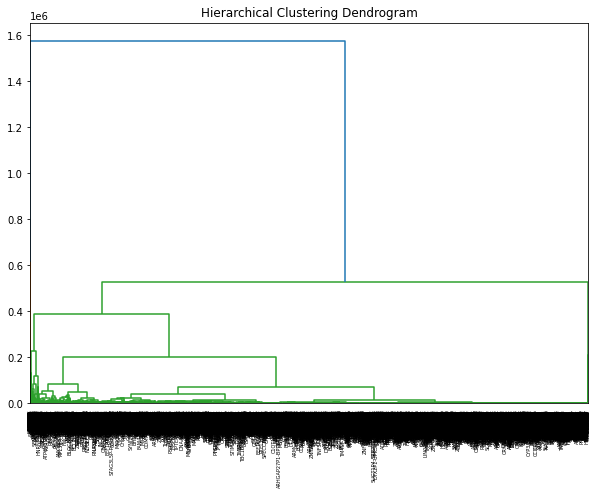

In [17]:
# Perform hierarchical clustering
linked = linkage(expression_values, method='ward')

# Plot dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linked, labels=df_mcf_ss_filt['Gene'].values, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram')
plt.show()


The hierarchical clustering dendrogram visualizes the arrangement of genes or samples into a tree structure based on their pairwise similarities. This method iteratively merges the most similar clusters, providing a comprehensive view of the data's hierarchical relationships. In this case we can see how the clustering is pretty well distributed at the end, exept for a little secotion on the far left side, that suggest some correlation. For example groups of genes that cluster together might be co-regulated or functionally related, participating in the same biological processes or pathways.

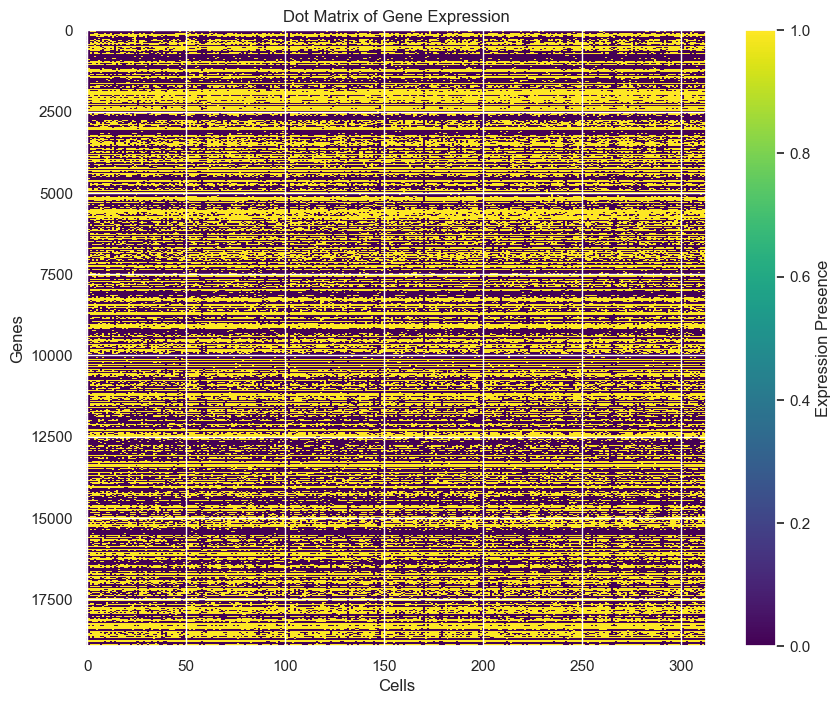

In [99]:
# Create dot matrix (binary matrix indicating presence of gene expression above a threshold)
threshold = 1.0  # Define a threshold for gene expression
binary_matrix = (expression_values > threshold).astype(int)

# Plot dot matrix with colors
plt.figure(figsize=(10, 8))
plt.imshow(binary_matrix, aspect='auto', cmap='viridis', interpolation='nearest')
plt.title('Dot Matrix of Gene Expression')
plt.xlabel('Cells')
plt.ylabel('Genes')
plt.colorbar(label='Expression Presence')
plt.show()


The dot matrix plot visualizes the presence or absence of gene expression across different cells. Each row represents a gene, and each column represents a cell. The presence of gene expression is indicated by colored dots, making it easy to spot patterns of expression, the dot matrix offers a high-level overview of the dataset, making it easier to understand the distribution of gene expression without diving into detailed numerical analysis.

# HCC1806

### Python libraries

In [100]:
import pandas as pd
import math
import seaborn as sns
import numpy as np
import os
import sys
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline     
sns.set(color_codes=True)

In [101]:
os.getcwd()
os.chdir("/Users/giuli/Downloads/")
os.getcwd()

'C:\\Users\\giuli\\Downloads'

In [262]:
df_hcc_ss_unfilt = pd.read_csv("HCC1806_SmartS_Unfiltered_Data.txt",delimiter=' ',engine='python',index_col=0)
df_hcc_ss_meta = pd.read_csv("HCC1806_SmartS_MetaData.tsv",delimiter='\t',engine='python',index_col=0)
df_hcc_ss_filt = pd.read_csv("HCC1806_SmartS_Filtered_Data.txt",delimiter=' ',engine='python',index_col=0)
df_hcc_ss_train = pd.read_csv("HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt",delimiter=' ',engine='python',index_col=0)

df_hcc_ds_train = pd.read_csv("HCC1806_Filtered_Normalised_3000_Data_train.txt",delimiter=' ',engine='python',index_col=0).T
df_hcc_ds_test = pd.read_csv("HCC1806_Filtered_Normalised_3000_Data_test_anonim.txt",delimiter=' ',engine='python',index_col=0).T


df_hcc_ss_unfilt.columns = df_hcc_ss_unfilt.columns.str.replace(r'"', '')
df_hcc_ss_filt.columns = df_hcc_ss_filt.columns.str.replace(r'"', '')
df_hcc_ss_train.columns = df_hcc_ss_train.columns.str.replace(r'"', '')

### Introduction

This notebook will present a comprehensive analysis of gene expression data obtained from the HCC1806 cell line under different experimental conditions. The dataset consists of two main parts: a metadata file (.tsv) that provides contextual information about the samples, and a gene expression file (.txt) that contains the gene expression levels for a variety of genes across multiple samples, the .txt file that is used in this notebook is the filtered one, on which some tests are done. The analysis includes data cleaning, exploratory data analysis, statistical tests, and visualization techniques to gain insights into the dataset and identify potential associations between experimental conditions and gene expression patterns. Furthermore, this notebook checks the first analysis in order to prepare for the future unsupervised and supervised learning algorithms. 

### Exploratory data analysis

 First we read in the metadata.

In [104]:
print("Dataframe dimensions:", np.shape(df_hcc_ss_meta))
print("First column: ", df_hcc_ss_meta.iloc[ : , 0])

Dataframe dimensions: (243, 8)
First column:  Filename
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam     HCC1806
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam       HCC1806
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam      HCC1806
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam        HCC1806
                                                                         ...   
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam      HCC1806
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam     HCC1806
output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam     HCC1806
Name: Cell Line, Length: 243, dtype: object


In [105]:
df_hcc_ss_meta.head(5)  

,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,HCC1806,1,A10,Normo,24,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,HCC1806,1,A12,Normo,24,S26,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,HCC1806,1,A1,Hypo,24,S97,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,HCC1806,1,A2,Hypo,24,S104,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,HCC1806,1,A3,Hypo,24,S4,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


In [106]:
for i,x in enumerate(df_hcc_ss_meta.columns):
  print(df_hcc_ss_meta.iloc[:,i].value_counts().to_string(), '\n')

Cell Line
HCC1806    243 

PCR Plate
3    68
1    64
2    63
4    48 

Pos
A10    4
H2     4
F12    4
F4     4
G10    4
G12    4
C6     4
G2     4
C12    4
C11    4
C10    4
G7     4
E12    4
B3     4
B6     4
B1     4
B11    4
A9     4
A3     4
G1     3
E5     3
E8     3
H10    3
F2     3
F9     3
F1     3
E3     3
F10    3
H1     3
G4     3
C3     3
B8     3
G6     3
H6     3
G9     3
E1     3
F7     3
D9     3
C8     3
A1     3
A6     3
D5     3
B2     3
B4     3
C1     3
C5     3
C7     3
A8     3
D1     3
D12    3
C9     2
A2     2
E7     2
E4     2
E9     2
A5     2
A4     2
F3     2
G11    2
F6     2
E6     2
H11    2
H3     2
C2     2
E2     2
H7     2
E11    2
E10    2
B9     2
F8     2
A12    2
G3     2
F5     2
D2     2
B7     2
G8     2
B5     2
H5     2
B12    2
H9     2
D3     2
A7     2
D10    2
H4     1
G5     1
D6     1
D4     1
D11    1
A11    1
C4     1
B10    1 

Condition
Hypo     126
Normo    117 

Hours
24    243 

Cell name
S123    1
S171    1
S96     1
S161    

The values of PRC Plate tell us how many cells are on each plate, while the values of Pos specify the plate where each cell is located. We have a total of four plates. Then we can see the values of Condition, which tells us whether the cell is in hypoxia or normoxia. Notice that they are almost evenly distributed. The values of hours indicate the time of observation of the cells during the experiment. As for the cell name we check that each cell is present only once. In the end, we have preprocessing and processing of the data, which are the same for every cell and therefore are not particularly relevant.

Next we download the actual sequencing data:


In [107]:
print("Dataframe dimensions:", np.shape(df_hcc_ss_unfilt))
print("First column: ", df_hcc_ss_unfilt.iloc[ : , 0])

Dataframe dimensions: (23396, 243)
First column:  "WASH7P"         0
"CICP27"         0
"DDX11L17"       0
"WASH9P"         0
"OR4F29"         2
              ... 
"MT-TE"         22
"MT-CYB"      4208
"MT-TT"         26
"MT-TP"         66
"MAFIP"          0
Name: "output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam", Length: 23396, dtype: int64


In [108]:
df_hcc_ss_unfilt.shape

(23396, 243)

In [109]:
list(df_hcc_ss_unfilt.columns)

['"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1B11_Normoxia_S127_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1B12_Normoxia_S27_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1B1_Hypoxia_S98_Aligned.so

In [110]:
gene_symbls = df_hcc_ss_unfilt.index
print("Dataframe indexes: ", gene_symbls)

Dataframe indexes:  Index(['"WASH7P"', '"CICP27"', '"DDX11L17"', '"WASH9P"', '"OR4F29"',
       '"MTND1P23"', '"MTND2P28"', '"MTCO1P12"', '"MTCO2P12"', '"MTATP8P1"',
       ...
       '"MT-TH"', '"MT-TS2"', '"MT-TL2"', '"MT-ND5"', '"MT-ND6"', '"MT-TE"',
       '"MT-CYB"', '"MT-TT"', '"MT-TP"', '"MAFIP"'],
      dtype='object', length=23396)


The dataset has dimensions 243x23396. 
The 243 columns represent the cells, which are located on four plates as indicated by their name, and can either be in hypoxia or normoxia state. 
The 23396 rows identify the genes using their official symbols, which summarize their primary function, for example DDX11L17 id short for 'DEAD/H-box helicase 11 like 17', which is a pseudogene (a sequence of nucleotides similar to a gene, but without any expression within the cell) . 



In [111]:
np.shape(df_hcc_ss_unfilt)

(23396, 243)

In [112]:
df_hcc_ss_unfilt.head(5)

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""CICP27""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""DDX11L17""",0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""WASH9P""",0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
"""OR4F29""",2,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [113]:
df_hcc_ss_unfilt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23396 entries, "WASH7P" to "MAFIP"
Columns: 243 entries, "output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam" to "output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"
dtypes: int64(243)
memory usage: 43.6+ MB


In [114]:
df_hcc_ss_unfilt.dtypes.value_counts()

int64    243
Name: count, dtype: int64

In [115]:
X= df_hcc_ss_unfilt.to_numpy()
X
np.shape(X)

(23396, 243)

Are there missing values in the data?

In [116]:
print(df_hcc_ss_unfilt.isnull().sum())

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"    0
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     0
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"       0
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"      0
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"        0
                                                                         ..
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"    0
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"    0
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"      0
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"     0
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"     0
Length: 243, dtype: int64


In [117]:
print(df_hcc_ss_unfilt.isnull().any().sum()) #after dropping the data

0


We plot some graphs of the cells and the genes:

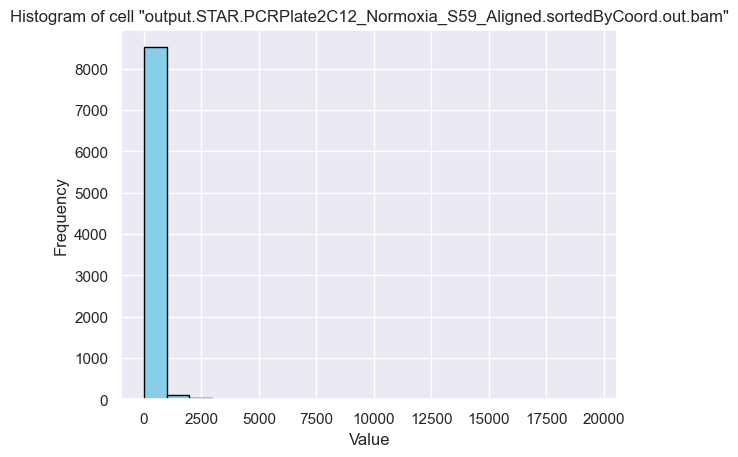

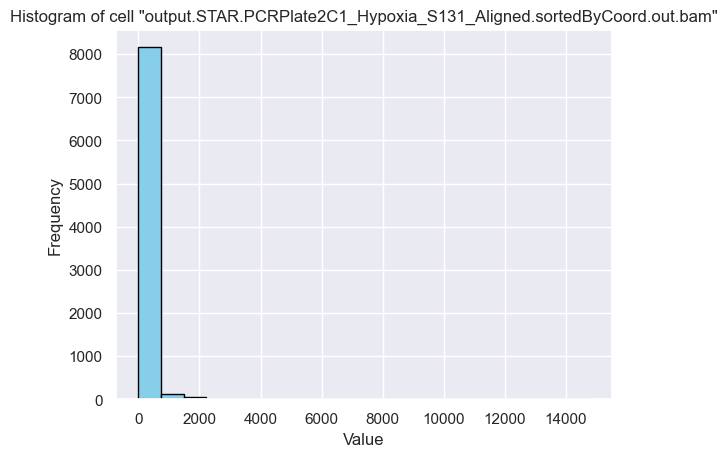

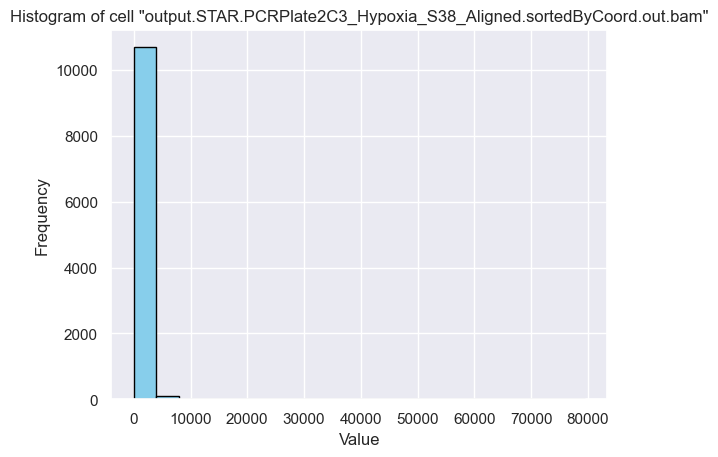

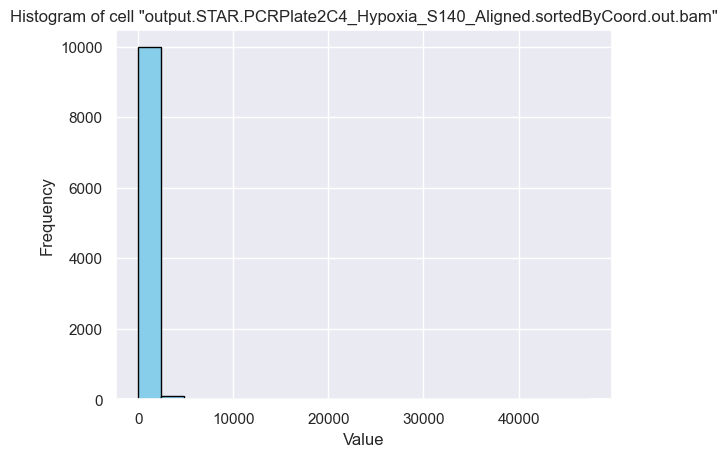

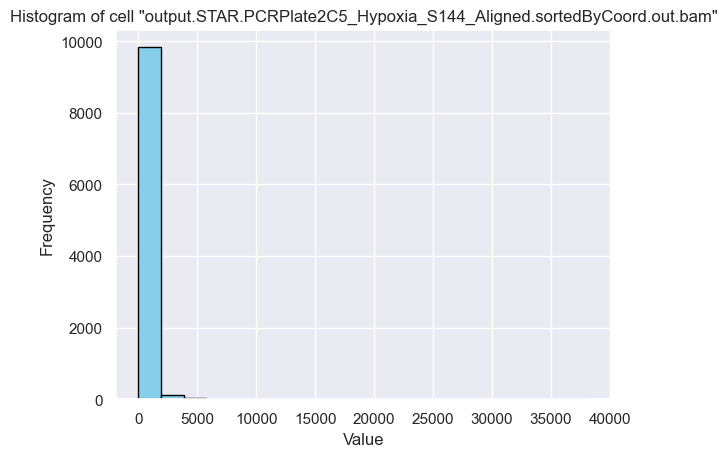

...

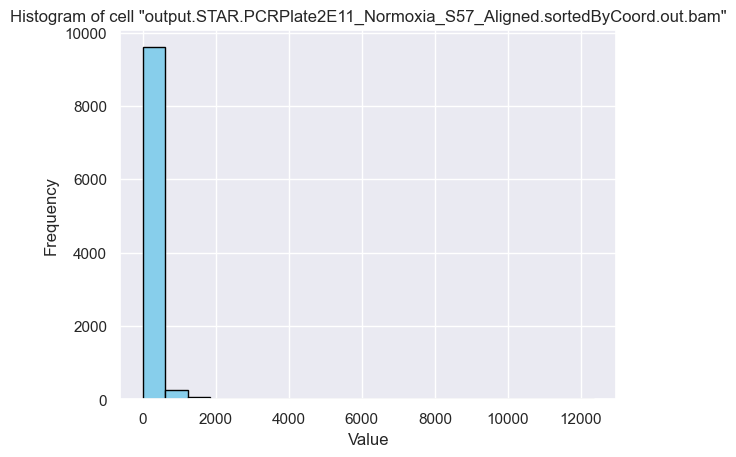

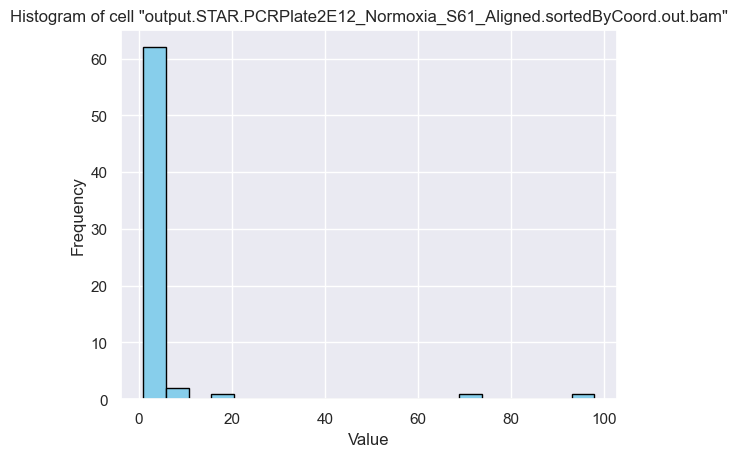

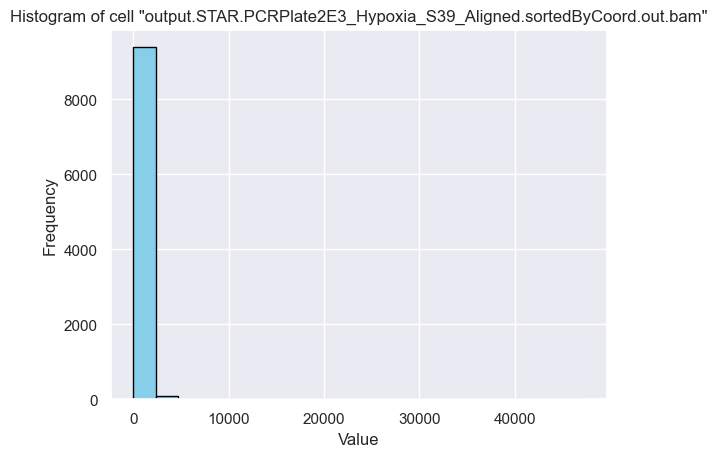

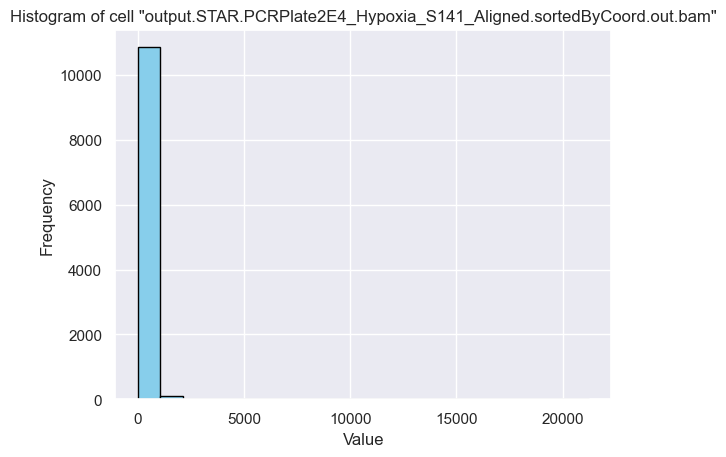

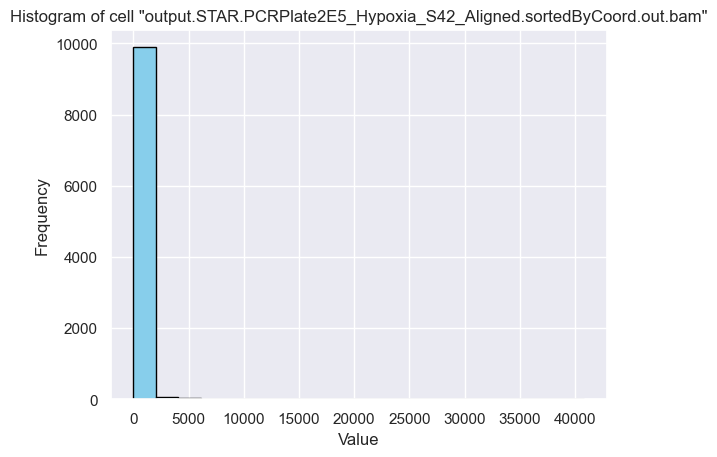

In [118]:
df_hcc_ss_unfilt_cell = df_hcc_ss_unfilt.iloc[:, 80:100]
for column_name in df_hcc_ss_unfilt_cell:
    row_not_null = []  # Reset the list for each column
    row_data = df_hcc_ss_unfilt_cell[column_name]
    for i in range(len(row_data)):
        if row_data[i] != 0:
            row_not_null.append(row_data[i])
    
    # Plotting histogram
    plt.hist(row_not_null, bins=20, color='skyblue', edgecolor='black')

    # Adding labels and title
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of cell {column_name}')
    
    # Displaying the plot
    plt.show()

Most of the data are zero, but let's take a better look at the ones that are not

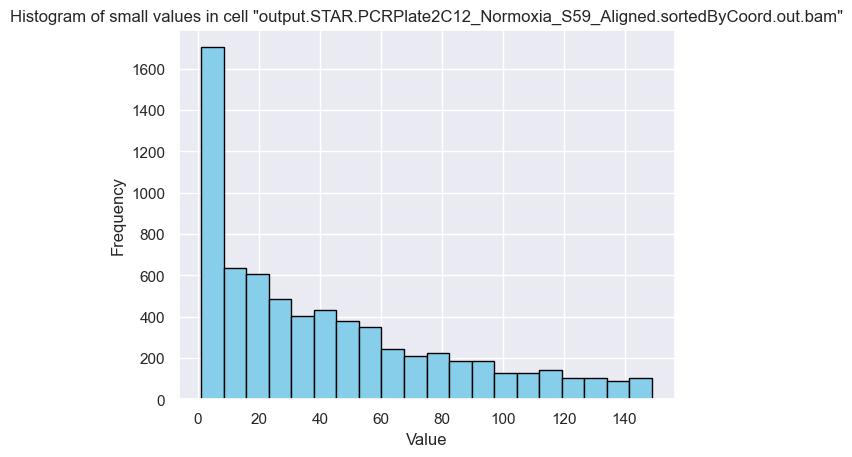

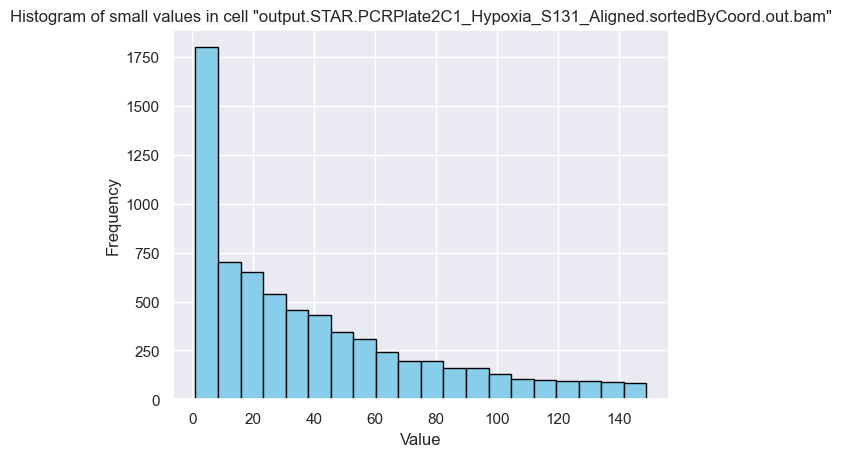

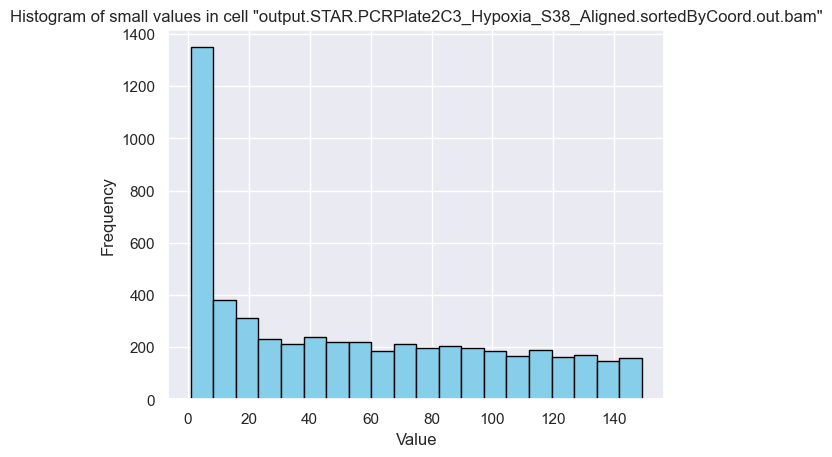

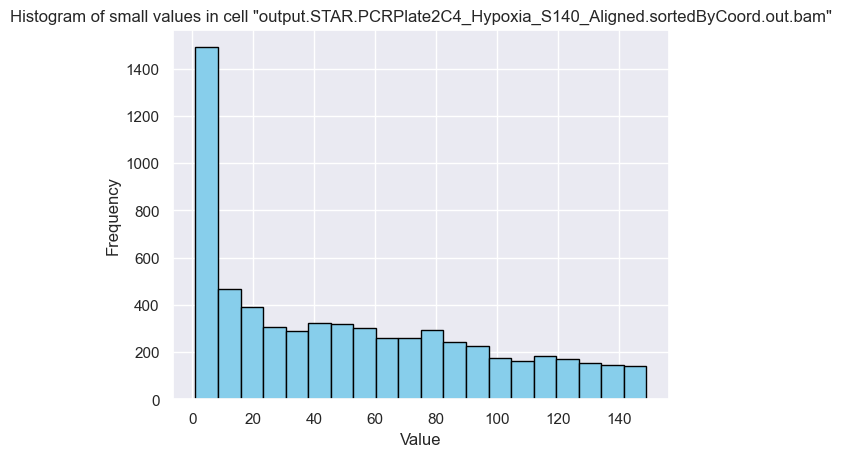

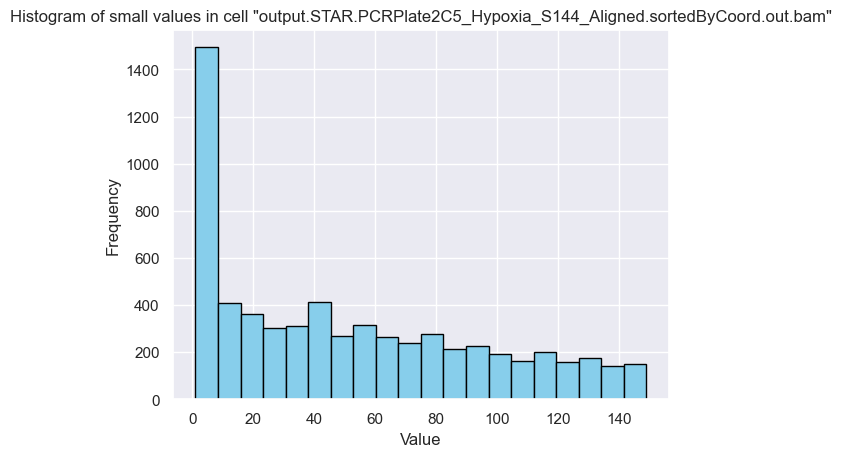

...

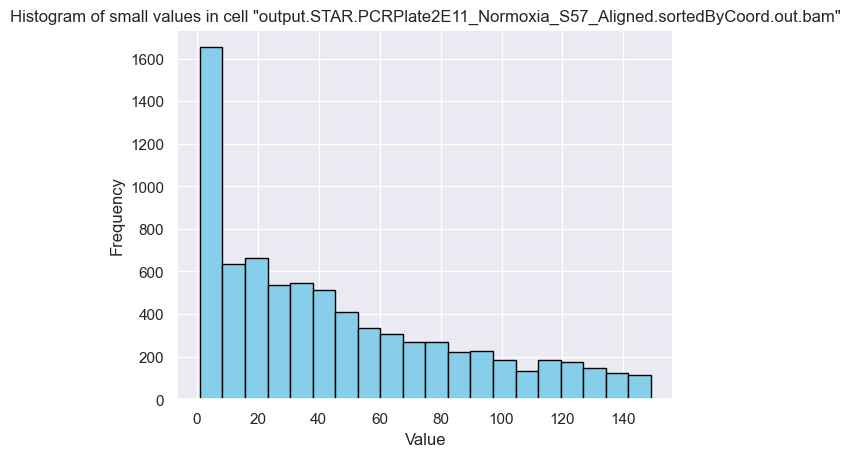

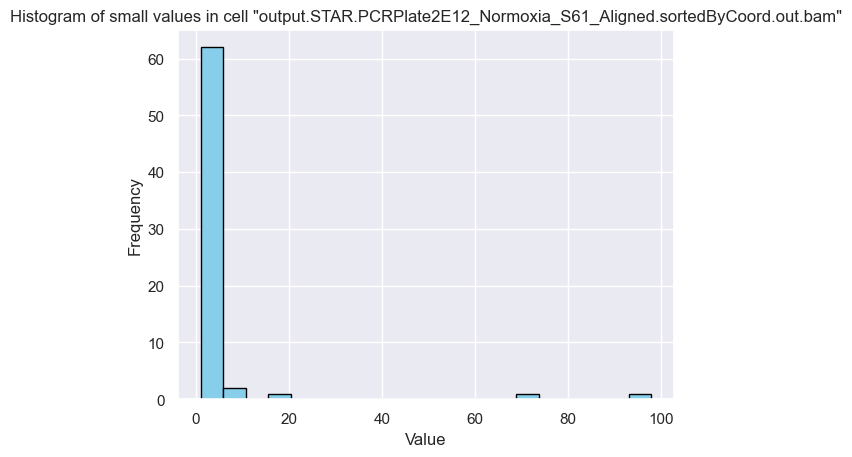

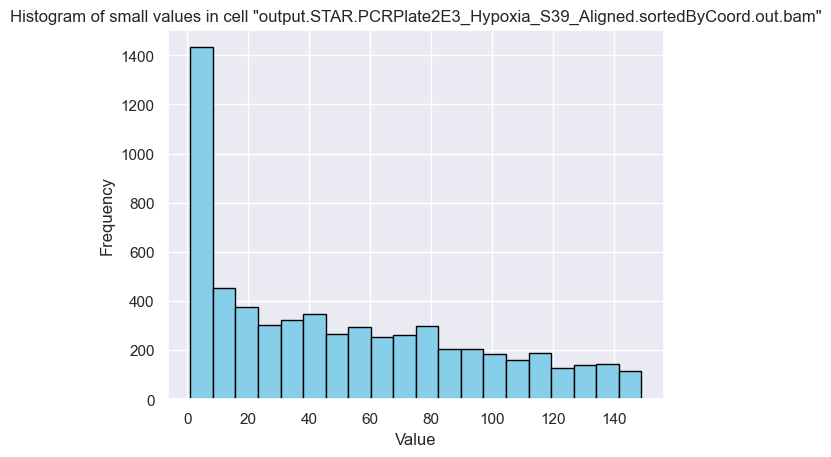

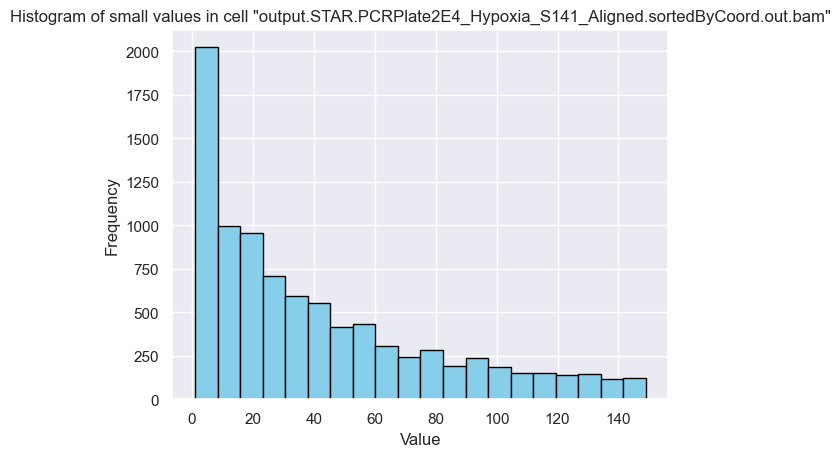

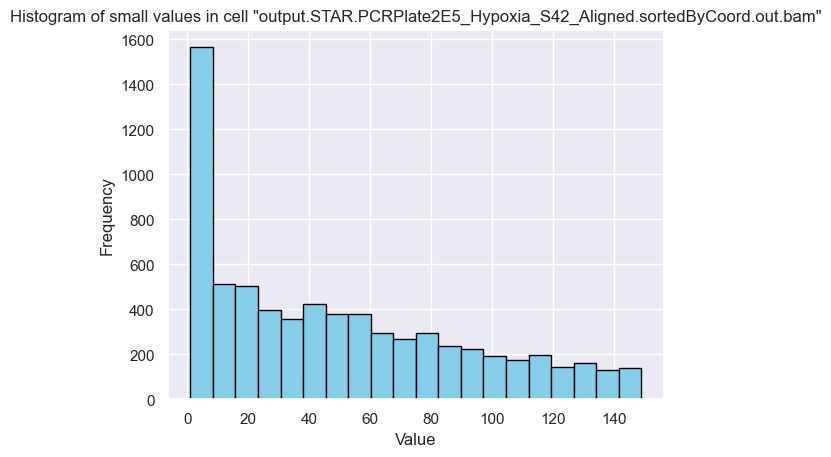

In [119]:
# Define a threshold for "small" values
threshold = 150  # Adjust this value as needed

df_hcc_ss_unfilt_cell = df_hcc_ss_unfilt.iloc[:, 80:100]

for column_name in df_hcc_ss_unfilt_cell:
    row_data = df_hcc_ss_unfilt_cell[column_name]
    # Filter out zeroes and values greater than the threshold
    row_small_values = [value for value in row_data if 0 < value < threshold]
    
    # Plotting histogram
    plt.hist(row_small_values, bins=20, color='skyblue', edgecolor='black')

    # Adding labels and title
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of small values in cell {column_name}')
    
    # Displaying the plot
    plt.show()

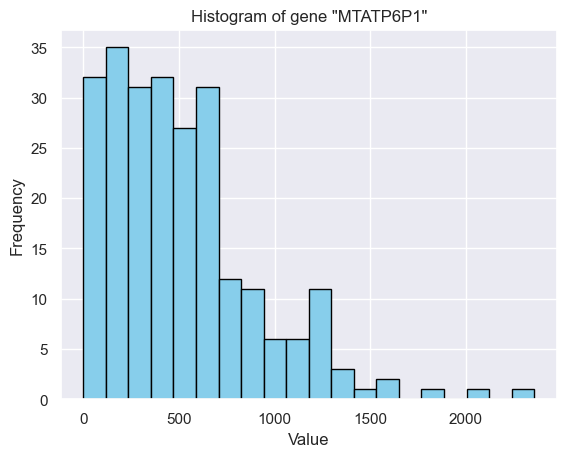

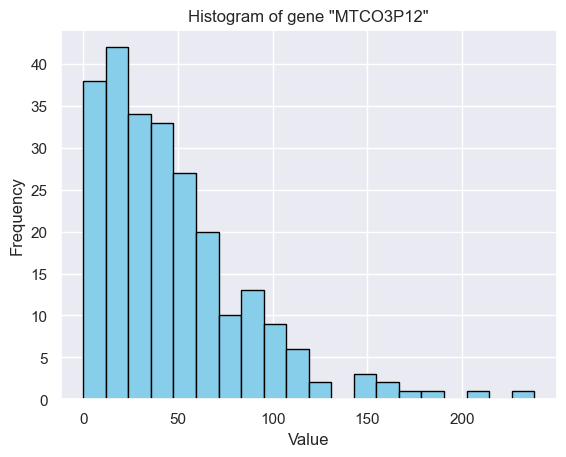

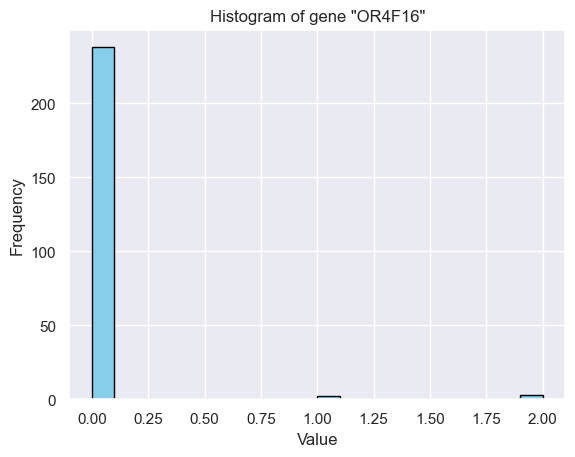

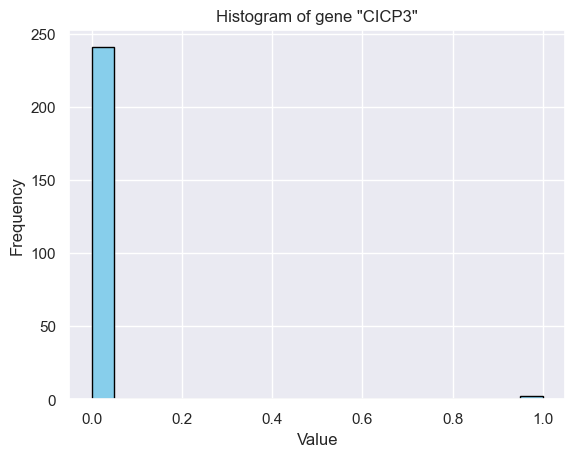

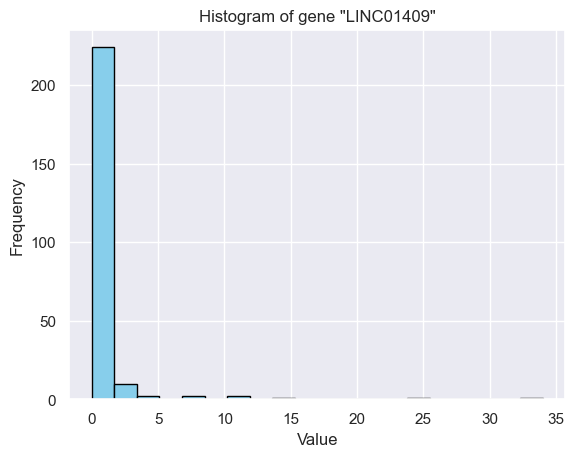

...

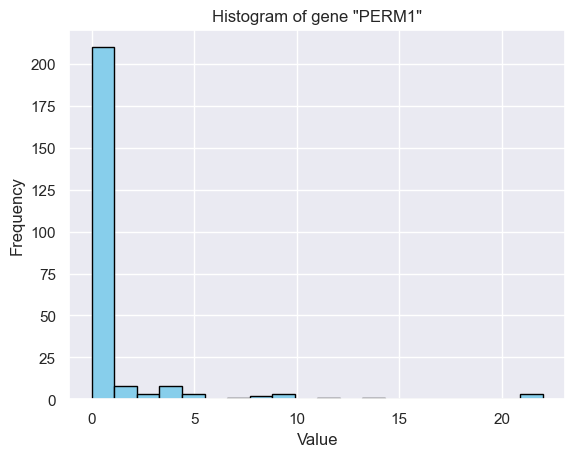

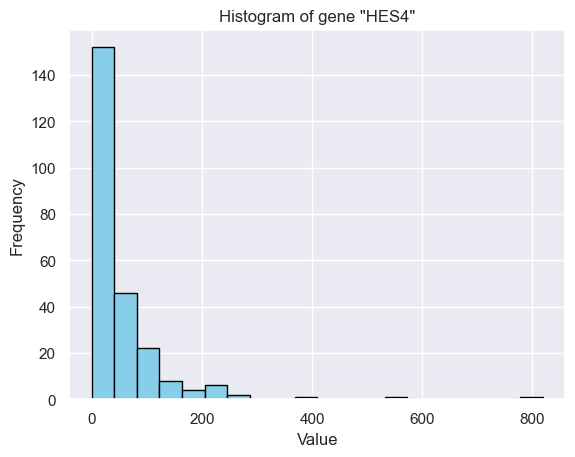

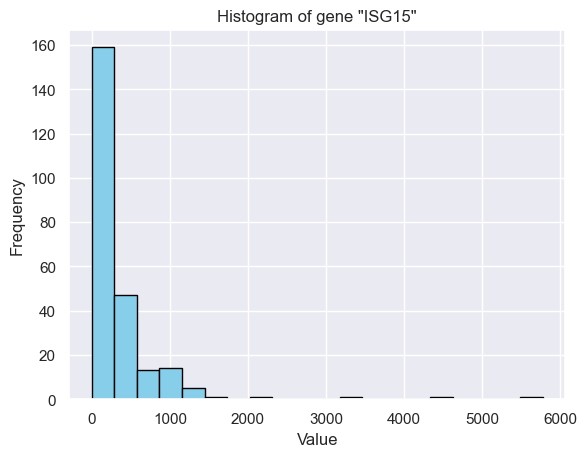

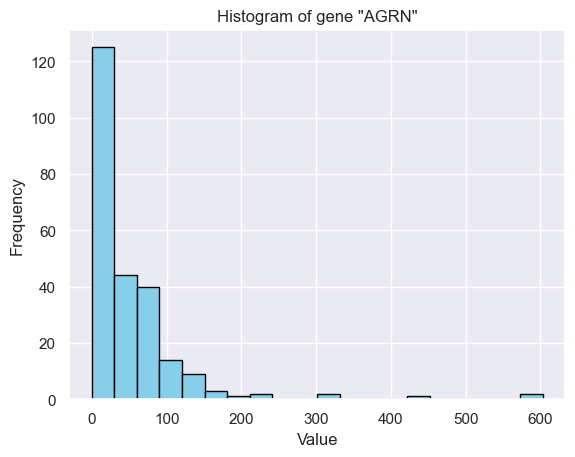

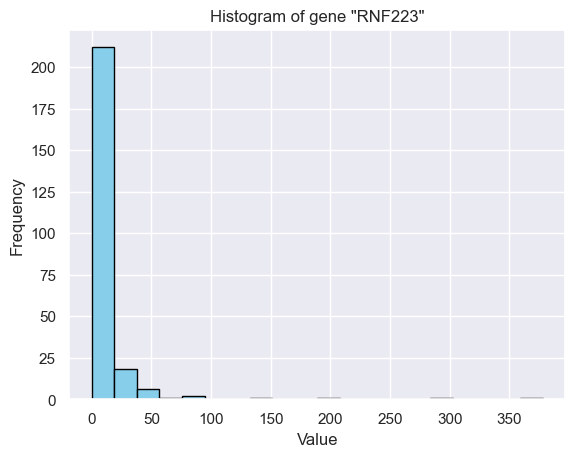

In [120]:
df_hcc_ss_unfilt_small_gene = df_hcc_ss_unfilt.T.iloc[:, 10:30]
for column_name in df_hcc_ss_unfilt_small_gene:
    row_data = df_hcc_ss_unfilt.T[column_name]
    
# Plotting histogram
    plt.hist(row_data, bins=20, color='skyblue', edgecolor='black')

# Adding labels and title
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of gene {column_name}')
    
# Displaying the plot
    plt.show()

#### Look at some descriptive statistic

In [121]:
df_hcc_ss_unfilt.describe()

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
count,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,...,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000
mean,99.565695,207.678278,9.694734,150.689007,35.700504,47.088434,152.799453,135.869422,38.363908,45.512139,...,76.361771,105.566593,54.026116,29.763806,28.905411,104.740725,35.181569,108.197940,37.279962,76.303855
std,529.532443,981.107905,65.546050,976.936548,205.885369,545.367706,864.974182,870.729740,265.062493,366.704721,...,346.659348,536.881574,344.068304,186.721266,135.474736,444.773045,170.872090,589.082268,181.398951,369.090274
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,1.000000
75%,51.000000,125.000000,5.000000,40.000000,22.000000,17.000000,81.000000,76.000000,22.000000,18.000000,...,56.000000,67.000000,29.000000,18.000000,19.000000,76.000000,24.000000,68.000000,22.000000,44.000000
max,35477.000000,69068.000000,6351.000000,70206.000000,17326.000000,47442.000000,43081.000000,62813.000000,30240.000000,35450.000000,...,19629.000000,30987.000000,21894.000000,13457.000000,11488.000000,33462.000000,15403.000000,34478.000000,10921.000000,28532.000000


The data are sparse since for most cells at least 50% of the data are zeroes

In [122]:
df_hcc_ss_unfilt.T.describe()

,"""WASH7P""","""CICP27""","""DDX11L17""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
count,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,...,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000
mean,0.045267,0.119342,0.469136,0.255144,0.127572,117.930041,28.427984,904.308642,1.403292,0.378601,...,10.358025,5.930041,13.493827,2290.213992,386.901235,18.246914,2163.588477,20.613169,46.444444,3.897119
std,0.318195,0.594531,1.455282,0.818639,0.440910,103.038022,26.062662,654.520308,1.735003,0.747361,...,10.910199,7.040559,11.803967,1726.423259,309.276105,54.076514,1730.393947,22.224590,47.684223,4.736193
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,46.500000,8.000000,390.500000,0.000000,0.000000,...,2.000000,1.000000,4.000000,918.000000,138.500000,4.000000,947.500000,5.000000,14.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,94.000000,22.000000,790.000000,1.000000,0.000000,...,7.000000,4.000000,10.000000,1848.000000,320.000000,11.000000,1774.000000,14.000000,38.000000,2.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,157.000000,42.000000,1208.000000,2.000000,1.000000,...,14.000000,7.500000,20.000000,3172.000000,528.000000,20.000000,2927.000000,30.500000,64.500000,6.000000
max,3.000000,5.000000,12.000000,6.000000,4.000000,694.000000,120.000000,3569.000000,12.000000,4.000000,...,52.000000,43.000000,57.000000,8972.000000,1439.000000,804.000000,11383.000000,154.000000,409.000000,24.000000


Notice that also the genes are sparse

<Axes: xlabel='"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"'>

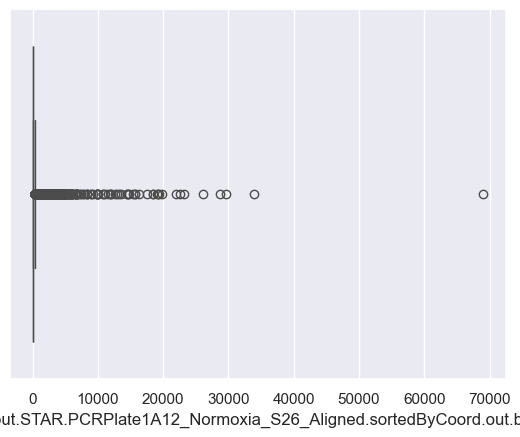

In [123]:
#you can plot the values for some features or some cases
cnames = list(df_hcc_ss_unfilt.columns)
cnames[1]
sns.boxplot(x=df_hcc_ss_unfilt[cnames[1]])

<Axes: xlabel='"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"'>

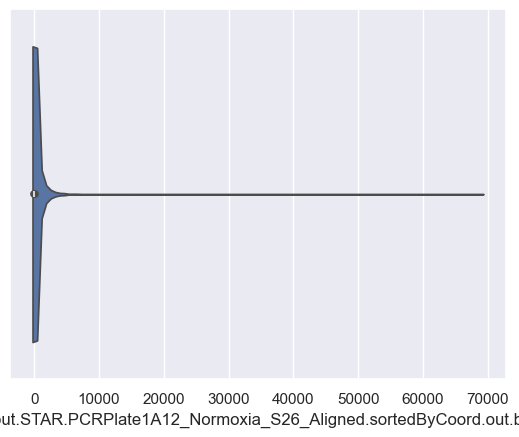

In [124]:
sns.violinplot(x=df_hcc_ss_unfilt[cnames[1]])

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

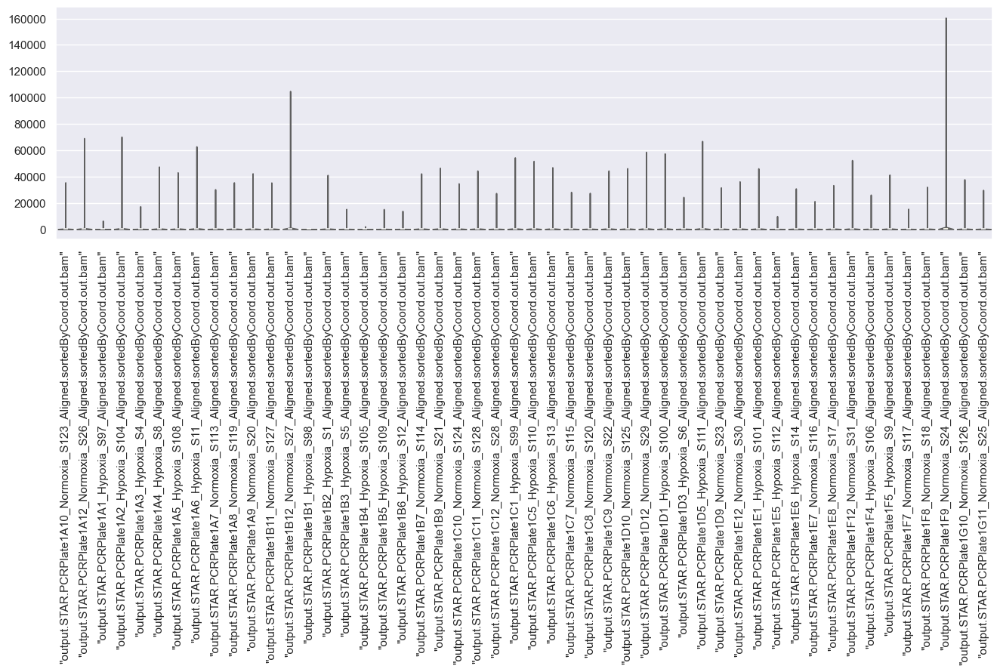

In [125]:
df_unfilt_small = df_hcc_ss_unfilt.iloc[:, :50]
np.shape(df_unfilt_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_unfilt_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

#### Let's look for outliers

A standard appraoch with outliers is to compute the inter quantile range, and use this to define outliers and filter them as below.

In [126]:
Q1 = df_hcc_ss_unfilt.quantile(0.25)
Q3 = df_hcc_ss_unfilt.quantile(0.75)
IQR = Q3-Q1
print(IQR)

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"     51.0
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     125.0
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"         5.0
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"       40.0
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"         22.0
                                                                          ...  
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"     76.0
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"     24.0
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"       68.0
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"      22.0
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"      44.0
Length: 243, dtype: float64


In [127]:
df_hcc_ss_unfilt_noOut = df_hcc_ss_unfilt[~((df_hcc_ss_unfilt < (Q1 - 1.5 * IQR)) |(df_hcc_ss_unfilt > (Q3 + 1.5 * IQR))).any(axis=1)]
df_hcc_ss_unfilt_noOut.shape
df_hcc_ss_unfilt_noOut.head(3)

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""CICP27""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""DDX11L17""",0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [128]:
df_hcc_ss_unfilt_noOut.shape

(10815, 243)

About half of the genes have now been cut from the original dataset. Now we repeat the plots without the outliers:

<Axes: xlabel='"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"'>

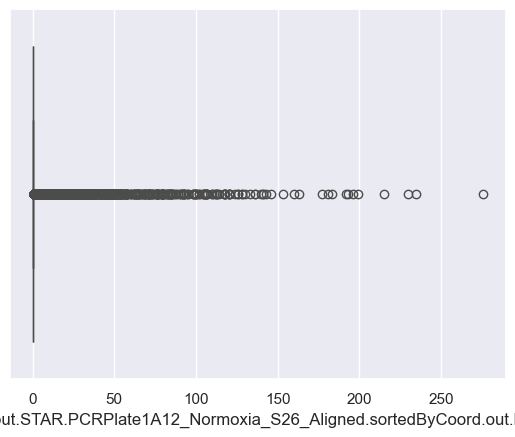

In [129]:
sns.boxplot(x=df_hcc_ss_unfilt_noOut[cnames[1]])

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

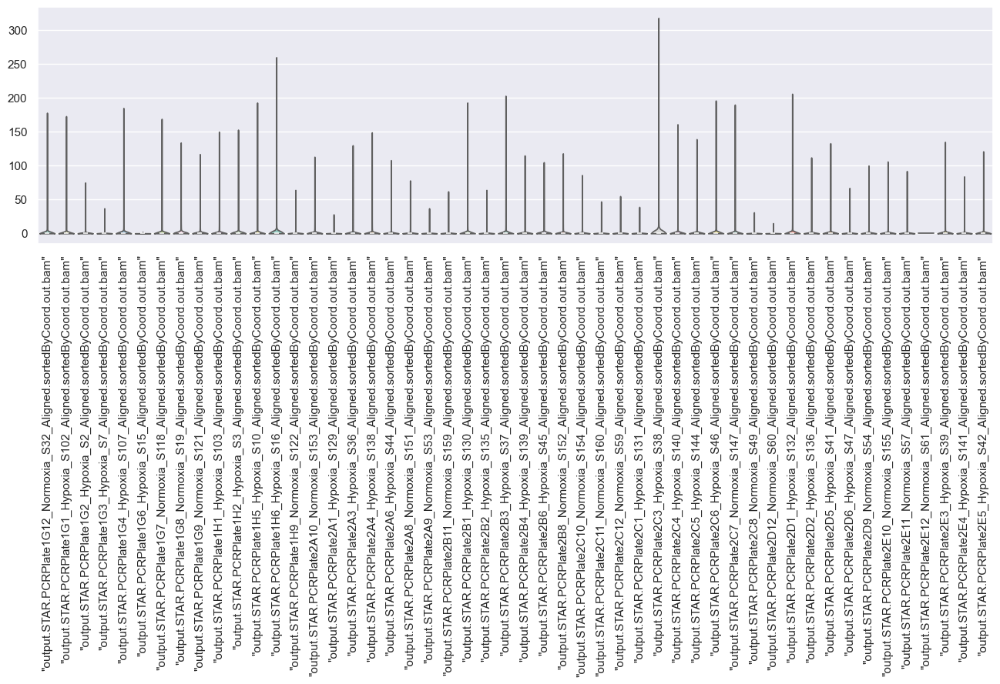

In [130]:
df_hcc_ss_unfilt_noOut_small = df_hcc_ss_unfilt_noOut.iloc[:,50:100]
np.shape(df_hcc_ss_unfilt_noOut_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_hcc_ss_unfilt_noOut_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

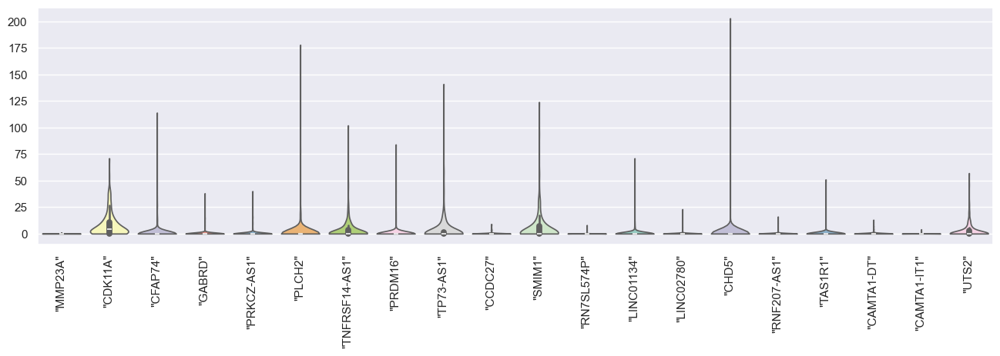

In [131]:
df_hcc_ss_unfilt_noOut_small = df_hcc_ss_unfilt_noOut.iloc[30:50,:].T
np.shape(df_hcc_ss_unfilt_noOut_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_hcc_ss_unfilt_noOut_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

Let's look at the sparsity of the data

To compute sparsity, divide the number of non-zero elements by the total number of elements in the dataset

In [132]:
sparsity = sum((df_hcc_ss_unfilt==0).sum())/df_hcc_ss_unfilt.size
print("sparsity level:", sparsity)

sparsity level: 0.558456230779135


In [133]:
sparsity = sum((df_hcc_ss_unfilt_noOut==0).sum())/df_hcc_ss_unfilt_noOut.size
print("sparsity level without outliers:", sparsity)

sparsity level without outliers: 0.8673120133026642


Notice that the sparsity increases when we remove outliers, which means that they carry some informations and therefore it is better not to remove them.

We try to remove the more sparse data to see whether we can remove them without losing important information

In [134]:
sparsity_cells= (df_hcc_ss_unfilt==0).sum()/df_hcc_ss_unfilt.shape[0]
sparsity_cells.sort_values()

"output.STAR.PCRPlate1D3_Hypoxia_S6_Aligned.sortedByCoord.out.bam"        0.402206
"output.STAR.PCRPlate1F8_Normoxia_S18_Aligned.sortedByCoord.out.bam"      0.443110
"output.STAR.PCRPlate3A9_Normoxia_S83_Aligned.sortedByCoord.out.bam"      0.457258
"output.STAR.PCRPlate3G1_Hypoxia_S164_Aligned.sortedByCoord.out.bam"      0.458882
"output.STAR.PCRPlate3D9_Normoxia_S86_Aligned.sortedByCoord.out.bam"      0.466105
                                                                            ...   
"output.STAR.PCRPlate2F12_Normoxia_S62_Aligned.sortedByCoord.out.bam"     0.996367
"output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam"      0.996538
"output.STAR.PCRPlate3D10_Normoxia_S188_Aligned.sortedByCoord.out.bam"    0.996965
"output.STAR.PCRPlate2E12_Normoxia_S61_Aligned.sortedByCoord.out.bam"     0.997136
"output.STAR.PCRPlate3D11_Normoxia_S92_Aligned.sortedByCoord.out.bam"     0.998504
Length: 243, dtype: float64

In [135]:
sparsity_genes = (df_hcc_ss_unfilt.T==0).sum()/df_hcc_ss_unfilt.T.shape[0]
sparsity_genes.sort_values()

"ACTB"         0.012346
"CD44"         0.016461
"LDHA"         0.016461
"H3-3B"        0.020576
"KRT8"         0.020576
                 ...   
"LINC00309"    0.991770
"RN7SL146P"    0.991770
"LINC01950"    0.991770
"RPS7P12"      0.991770
"SOX21"        0.991770
Length: 23396, dtype: float64

We remove sparse genes since they are the ones which benefit less from outliers filter, since they're mostry zeroes

In [136]:
sparse_genes = (sparsity_genes > 0.95)
df_hcc_ss_unfilt_genes_not_sparse = df_hcc_ss_unfilt.T.drop(df_hcc_ss_unfilt.T.columns[sparse_genes], axis=1)
print('Number of relevant genes:',df_hcc_ss_unfilt_genes_not_sparse.shape[1])

Number of relevant genes: 17509


In [137]:
sparsity_genes_relevant = (df_hcc_ss_unfilt_genes_not_sparse.T==0).sum()/df_hcc_ss_unfilt_genes_not_sparse.T.shape[0]
sparsity_genes_relevant.sort_values()

"output.STAR.PCRPlate1D3_Hypoxia_S6_Aligned.sortedByCoord.out.bam"        0.243018
"output.STAR.PCRPlate1F8_Normoxia_S18_Aligned.sortedByCoord.out.bam"      0.272488
"output.STAR.PCRPlate3A9_Normoxia_S83_Aligned.sortedByCoord.out.bam"      0.284882
"output.STAR.PCRPlate3G1_Hypoxia_S164_Aligned.sortedByCoord.out.bam"      0.286424
"output.STAR.PCRPlate3D9_Normoxia_S86_Aligned.sortedByCoord.out.bam"      0.296476
                                                                            ...   
"output.STAR.PCRPlate2F12_Normoxia_S62_Aligned.sortedByCoord.out.bam"     0.995260
"output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam"      0.995659
"output.STAR.PCRPlate3D10_Normoxia_S188_Aligned.sortedByCoord.out.bam"    0.996231
"output.STAR.PCRPlate2E12_Normoxia_S61_Aligned.sortedByCoord.out.bam"     0.996402
"output.STAR.PCRPlate3D11_Normoxia_S92_Aligned.sortedByCoord.out.bam"     0.998344
Length: 243, dtype: float64

In [138]:
sparsity_relevant = sum((df_hcc_ss_unfilt_genes_not_sparse==0).sum())/df_hcc_ss_unfilt_genes_not_sparse.size
print("sparsity level:", sparsity_relevant)

sparsity level: 0.41701445958304334


The sparsity level, as we expected, is lower than before: we can show this by plotting some graphs


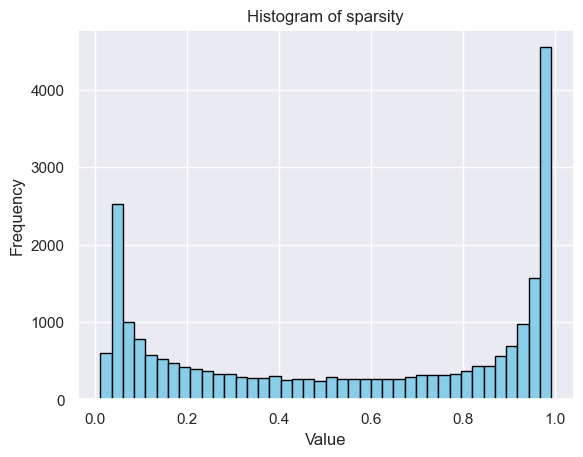

In [139]:
plt.hist(sparsity_genes, bins=40, color='skyblue', edgecolor='black')

# Adding labels and titl
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title(f'Histogram of sparsity')
    
# Displaying the plot
plt.show()

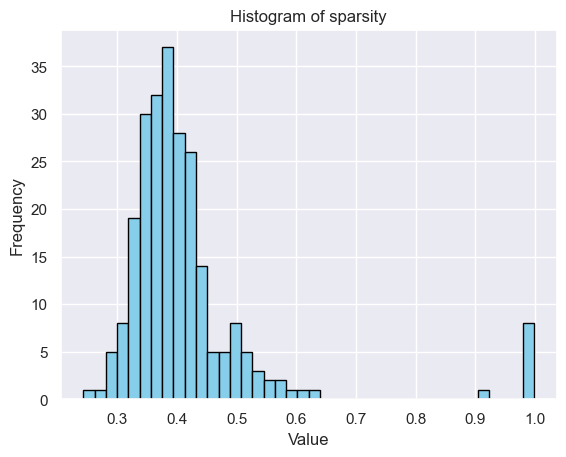

In [140]:
plt.hist(sparsity_genes_relevant, bins=40, color='skyblue', edgecolor='black')

# Adding labels and titl
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title(f'Histogram of sparsity')
    
# Displaying the plot
plt.show()

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

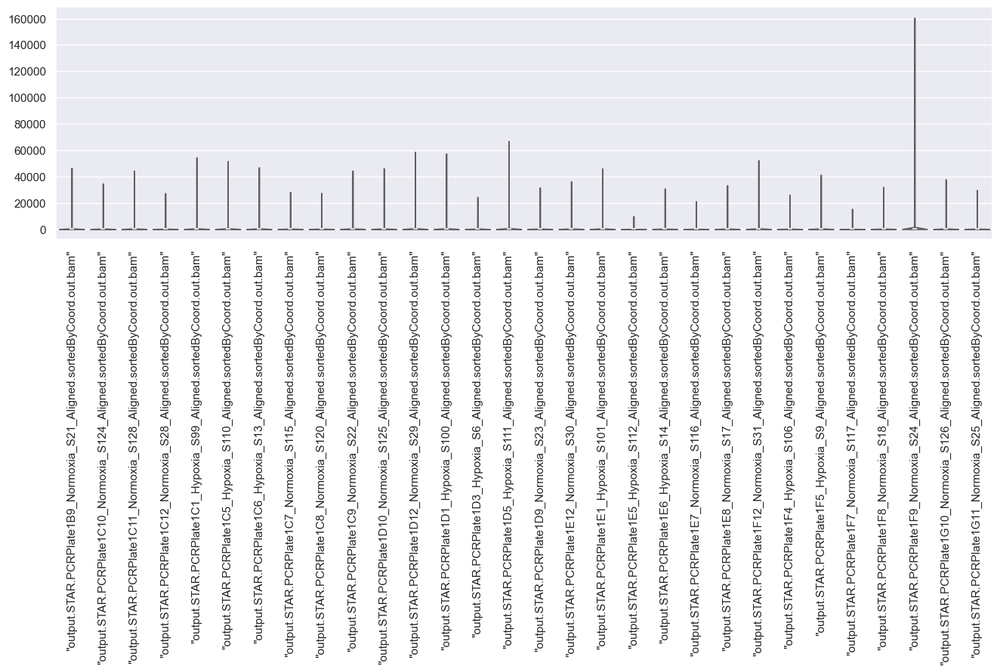

In [141]:
df_hcc_ss_unfilt_small_genes_not_sparse = df_hcc_ss_unfilt_genes_not_sparse.iloc[20:50,:].T
np.shape(df_hcc_ss_unfilt_small_genes_not_sparse)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_hcc_ss_unfilt_small_genes_not_sparse,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

We now inspect summary statistics of the distribution of the data, by looking at the Skewness and Kurtosis of the gene expression profiles from both the original data and the data obtained by reducing the sparsity.

Text(0.5, 0, 'Skewness of single cells expression profiles - original df')

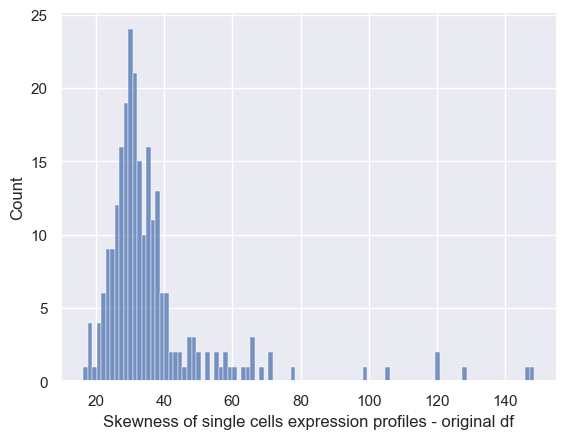

In [142]:
from scipy.stats import kurtosis, skew
colN = np.shape(df_hcc_ss_unfilt)[1]
colN
df_hcc_ss_unfilt_skew_cells = []
for i in range(colN) :     
     v_df_hcc_ss_unfilt = df_hcc_ss_unfilt[cnames[i]]
     df_hcc_ss_unfilt_skew_cells += [skew(v_df_hcc_ss_unfilt)]   
  #  df_skew_cells += [df[cnames[i]].skew()]
df_hcc_ss_unfilt_skew_cells
sns.histplot(df_hcc_ss_unfilt_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - original df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - original df')

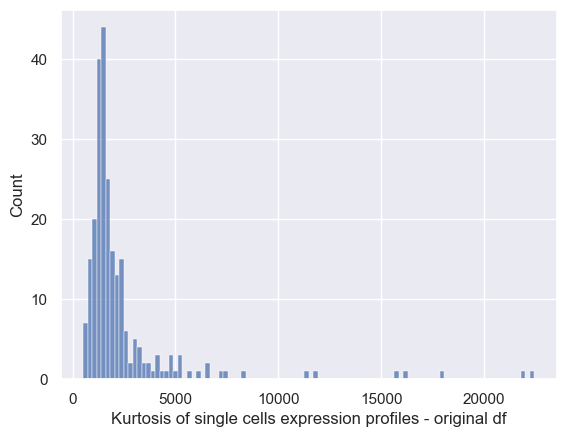

In [143]:
#kurtosis
df_hcc_ss_unfilt_kurt_cells = []
for i in range(colN) :     
     v_df_hcc_ss_unfilt = df_hcc_ss_unfilt[cnames[i]]
     df_hcc_ss_unfilt_kurt_cells += [kurtosis(v_df_hcc_ss_unfilt)]   
 #   df_kurt_cells += [df[cnames[i]].kurt()]
df_hcc_ss_unfilt_kurt_cells
sns.histplot(df_hcc_ss_unfilt_kurt_cells,bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - original df')

In [144]:
xnorm = np.random.normal(0, 2, 10000000)   # create random values based on a normal distribution
xnorm 

print( "Excess kurtosis of normal distribution: ",  kurtosis(xnorm) )
print( "Skewness of normal distribution: ", skew(xnorm) )

Excess kurtosis of normal distribution:  -3.527810969972123e-05
Skewness of normal distribution:  -5.112967677513242e-05


Text(0.5, 0, 'Skewness of single cells expression profiles - not sparse df')

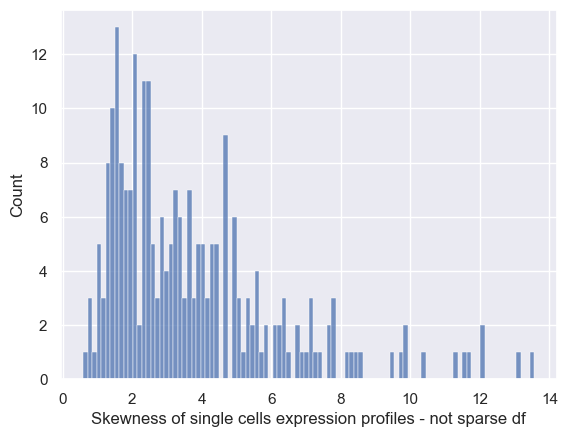

In [145]:
df_hcc_ss_unfilt_genes_not_sparse_skew_cells = []
cnames = list(df_hcc_ss_unfilt_genes_not_sparse.columns)
for i in range(colN) :     
     v_df_hcc_ss_unfilt_genes_not_sparse = df_hcc_ss_unfilt_genes_not_sparse[cnames[i]]
     df_hcc_ss_unfilt_genes_not_sparse_skew_cells += [skew(v_df_hcc_ss_unfilt_genes_not_sparse)]   
df_hcc_ss_unfilt_genes_not_sparse_skew_cells
sns.histplot(df_hcc_ss_unfilt_genes_not_sparse_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - not sparse df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - not sparse df')

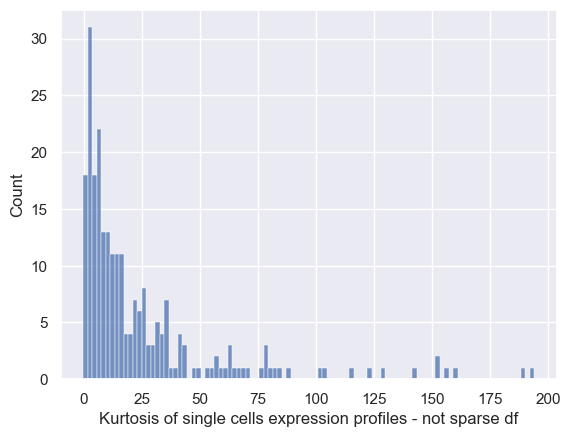

In [146]:
df_hcc_ss_unfilt_genes_not_sparse_kurt_cells = []
for i in range(colN) :     
     v_df_hcc_ss_unfilt_genes_not_sparse = df_hcc_ss_unfilt_genes_not_sparse[cnames[i]]
     df_hcc_ss_unfilt_genes_not_sparse_kurt_cells += [kurtosis(v_df_hcc_ss_unfilt_genes_not_sparse)] 
df_hcc_ss_unfilt_genes_not_sparse_kurt_cells
sns.histplot(df_hcc_ss_unfilt_genes_not_sparse_kurt_cells,bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - not sparse df')

The distribution are highly non-normal, skewed with heavy tails, so it is far from being normal.
Moreover, the values observed have higher probability of falling on the right side of the distribution rather than on the left side.
This creates a mismatch between observed and imputed data which could adversely affect the estimates of interest.
The effect of non-normality is generally small for measures that rely on the center of the distribution, like means or regression weights, but it could be substantial for estimates like a variance or
a percentile. 
In general, normal imputations appear to be robust against violations of normality.

#### Data transformation:

We apply a logaritmic transformation to the data 

<Axes: xlabel='"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"'>

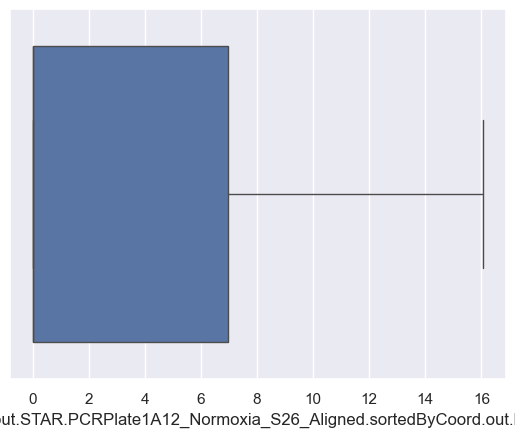

In [147]:
cnames = list(df_hcc_ss_unfilt.columns)
cnames[1]
df11_log2 = np.log2(df_hcc_ss_unfilt[cnames[1]]+1)
sns.boxplot(x=df11_log2)

<Axes: xlabel='"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"'>

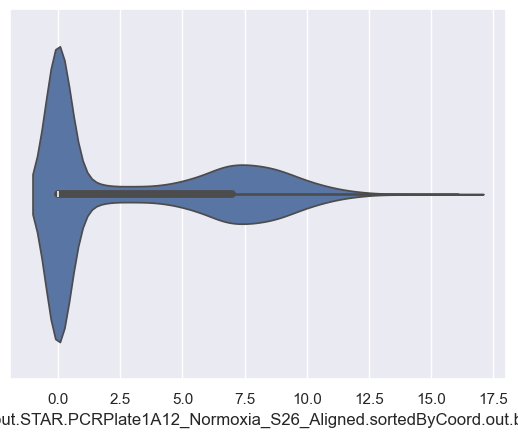

In [148]:
sns.violinplot(x=df11_log2)

In [149]:
display(df11_log2.describe().round(2))

count    23396.00
mean         3.22
std          3.85
min          0.00
25%          0.00
50%          0.00
75%          6.98
max         16.08
Name: "output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam", dtype: float64

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

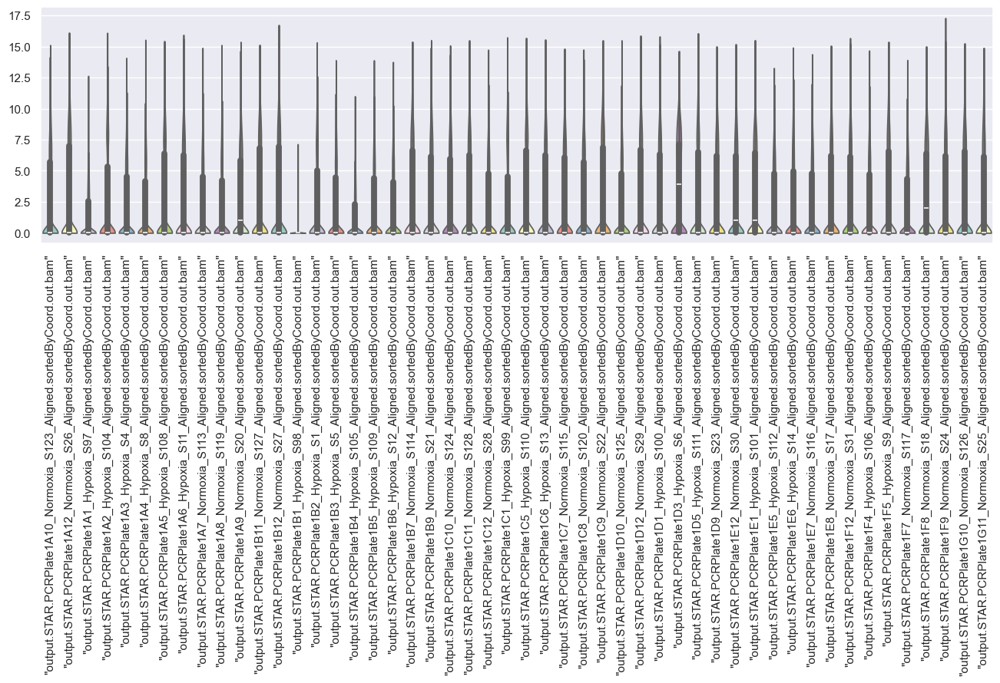

In [150]:
df1 = df_hcc_ss_unfilt + 1
df1_log2 = df1.apply(np.log2)
# I'm selecting part of the data as the plots would otherwise take too long to generate
df1_log2_small = df1_log2.iloc[:, :50]
np.shape(df1_log2_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df1_log2_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

Text(0.5, 0, 'Skewness of single cells expression profiles - log2 df')

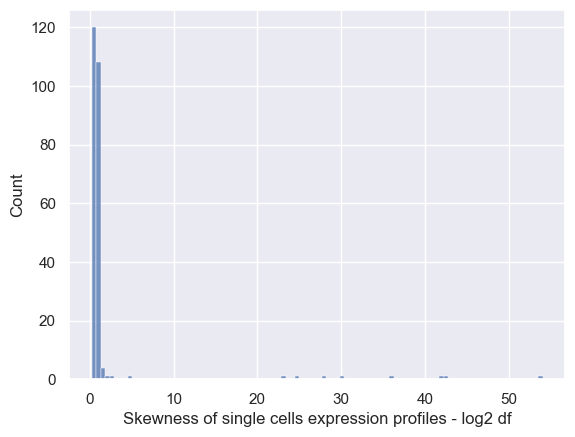

In [151]:
df1_log2_skew_cells = []
for i in range(colN) :     
     v_df_hcc_ss_unfilt = df1_log2[cnames[i]]
     df1_log2_skew_cells += [skew(v_df_hcc_ss_unfilt)]   
df1_log2_skew_cells
sns.histplot(df1_log2_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - log2 df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - log2 df')

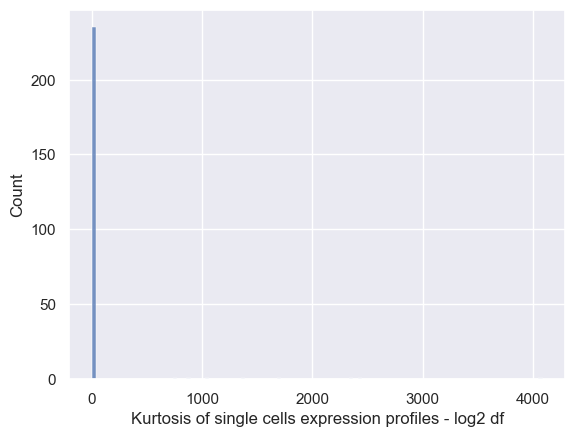

In [152]:
df1_log2_kurt_cells = []
for i in range(colN) :     
     v_df_hcc_ss_unfilt = df1_log2[cnames[i]]
     df1_log2_kurt_cells += [kurtosis(v_df_hcc_ss_unfilt)] 
df1_log2_kurt_cells
sns.histplot(df1_log2_kurt_cells,bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - log2 df')

It looks even less normalized, let's try a cube root transformation to see if something better comes out

<Axes: xlabel='"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"'>

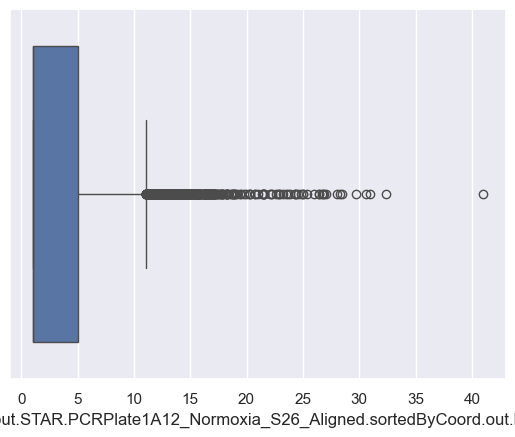

In [153]:
df_hcc_ss_unfilt_cbrt = np.cbrt(df_hcc_ss_unfilt[cnames[1]]+1)
sns.boxplot(x=df_hcc_ss_unfilt_cbrt)

<Axes: xlabel='"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"'>

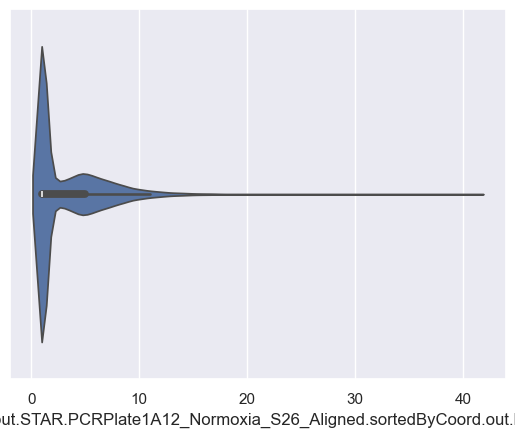

In [154]:
sns.violinplot(x=df_hcc_ss_unfilt_cbrt)

In [155]:
display(df_hcc_ss_unfilt_cbrt.describe().round(2))

count    23396.00
mean         3.24
std          3.30
min          1.00
25%          1.00
50%          1.00
75%          5.01
max         41.03
Name: "output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam", dtype: float64

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

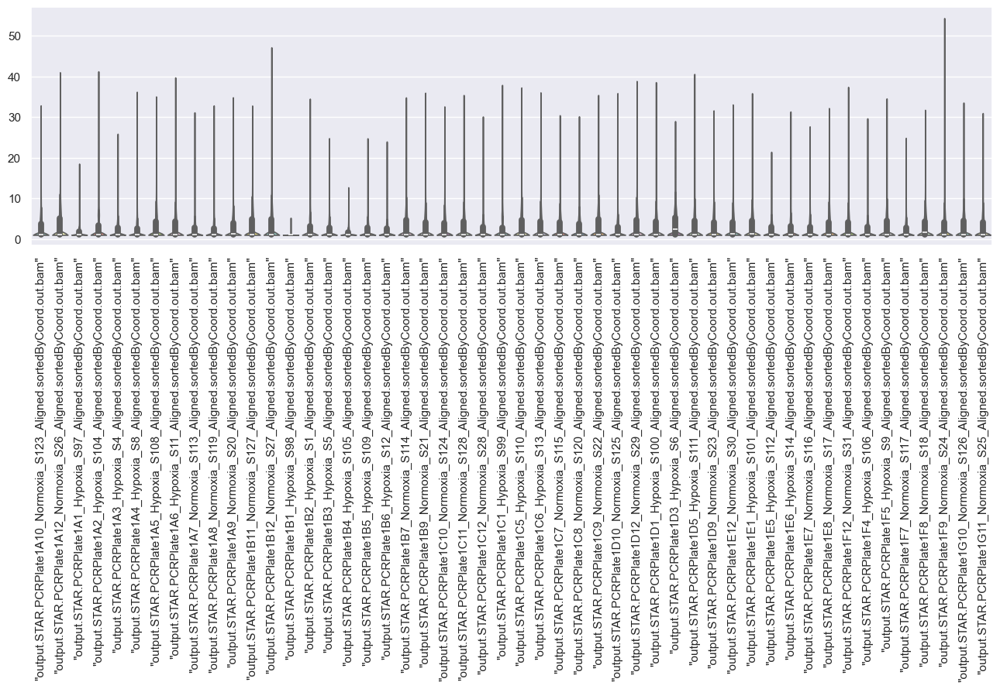

In [156]:
df1 = df_hcc_ss_unfilt + 1
df_cbrt = df1.apply(np.cbrt)
# I'm selecting part of the data as the plots would otherwise take too long to generate
df_cbrt_small = df_cbrt.iloc[:, :50]
np.shape(df_cbrt_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_cbrt_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

Text(0.5, 0, 'Skewness of single cells expression profiles - cube root df')

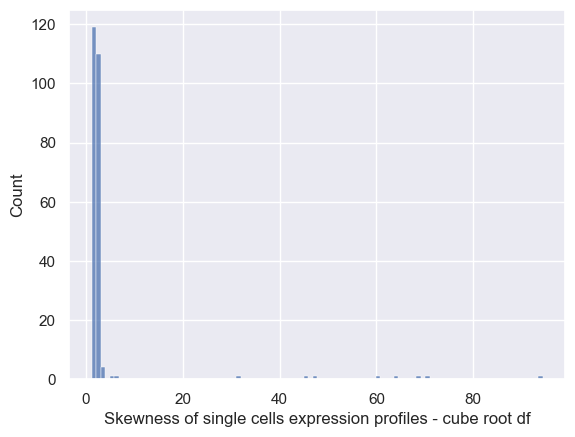

In [163]:
df_cbrt_skew_cells = []
for i in range(colN) :     
     v_df_hcc_ss_unfilt_cbrt = df_cbrt[cnames[i]]
     df_cbrt_skew_cells += [skew(v_df_hcc_ss_unfilt_cbrt)]   
df_cbrt_skew_cells
sns.histplot(df_cbrt_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - cube root df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - cube root df')

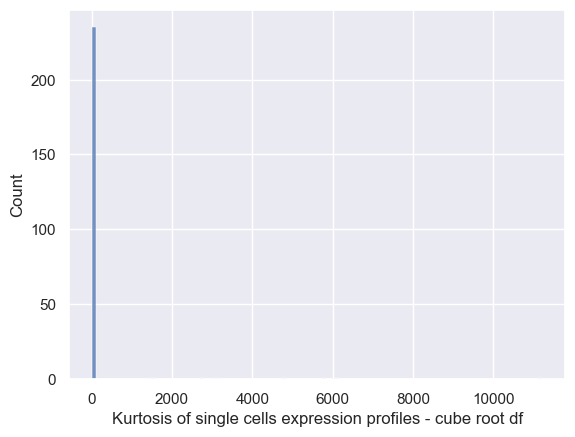

In [164]:
df_cbrt_kurt_cells = []
for i in range(colN) : 
     v_df_hcc_ss_unfilt = df_cbrt[cnames[i]]
     df_cbrt_kurt_cells += [kurtosis(v_df_hcc_ss_unfilt)] 
df_cbrt_kurt_cells
sns.histplot(df_cbrt_kurt_cells,bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - cube root df')


The distributions still don't look normalized

Each single cell was sequenced independently, so there might be need of normalizing the data between cells. Let's plot the gene expression distributions for each cell, and compare them.

C:\Users\giuli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


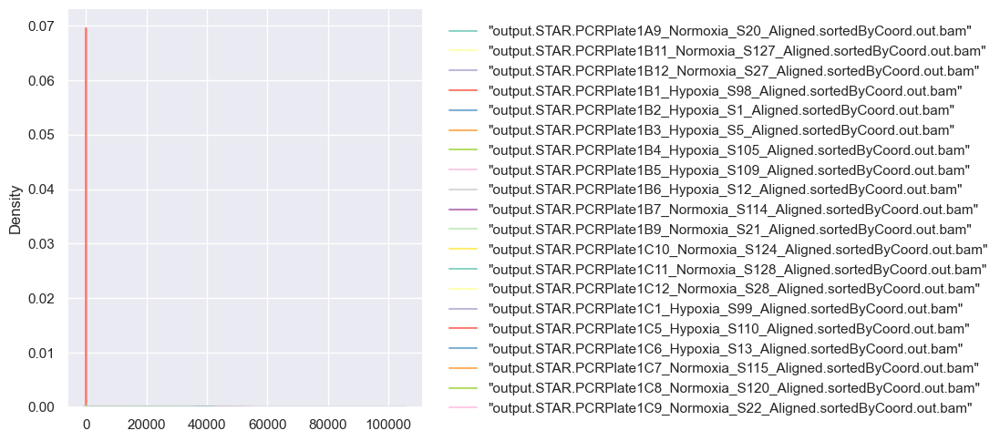

In [165]:
df_hcc_ss_unfilt_small = df_hcc_ss_unfilt.iloc[:, 10:30]  #just selecting part of the samples so run time not too long
sns.displot(data=df_hcc_ss_unfilt_small,palette="Set3",kind="kde", bw_adjust=2)

Let's try with a logarithm transformation

C:\Users\giuli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


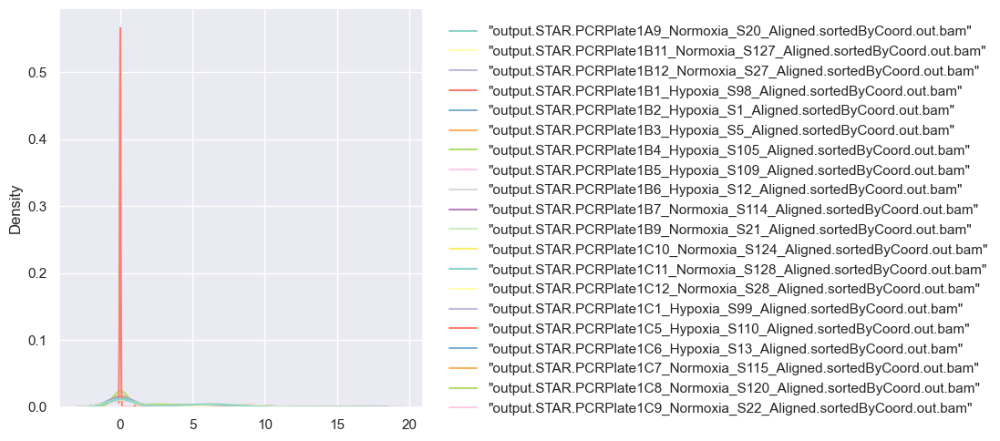

In [166]:
##normalization with logarithm transformation
df_hcc_ss_unfilt_small = df1_log2.iloc[:, 10:30]  #just selecting part of the samples so run time not too long
sns.displot(data=df_hcc_ss_unfilt_small,palette="Set3",kind="kde", bw_adjust=2)

It still doesn't look normalized

We plot the filtered dataset

C:\Users\giuli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


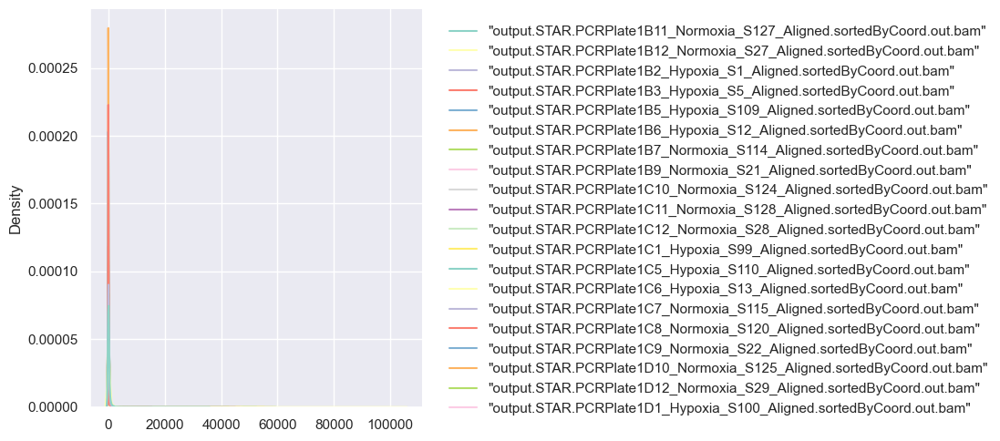

In [168]:
df_hcc_ss_filt_small = df_hcc_ss_filt.iloc[:, 10:30]  #just selecting part of the samples so run time not too long
sns.displot(data=df_hcc_ss_filt_small,palette="Set3",kind="kde", bw_adjust=2)

Let's apply the logarithm transformation to the filtered data as well

C:\Users\giuli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Distribution of gene expression of all cells')

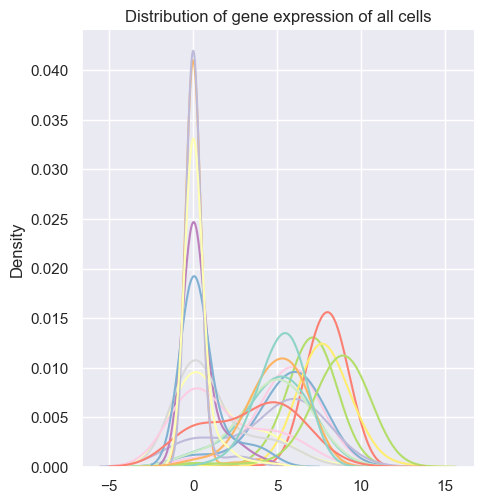

In [174]:
df_hcc_ss_filt_log = (df_hcc_ss_filt.T+1).apply(np.log2)
df_hcc_ss_filt_small_log = df_hcc_ss_filt_log.iloc[:, 10:30]
sns.displot(data=df_hcc_ss_filt_small_log,palette="Set3",kind="kde", bw_adjust=2, legend=False)
plt.title('Distribution of gene expression of all cells')

The distributions look quite normalized but with very different means

Now we try to scale the filtered data

In [170]:
from sklearn.preprocessing import StandardScaler

scaler = sklearn.preprocessing.StandardScaler().fit(df_hcc_ss_filt)
df_hcc_ss_filt_scal= pd.DataFrame(scaler.transform(df_hcc_ss_filt), columns = df_hcc_ss_filt.columns)

C:\Users\giuli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


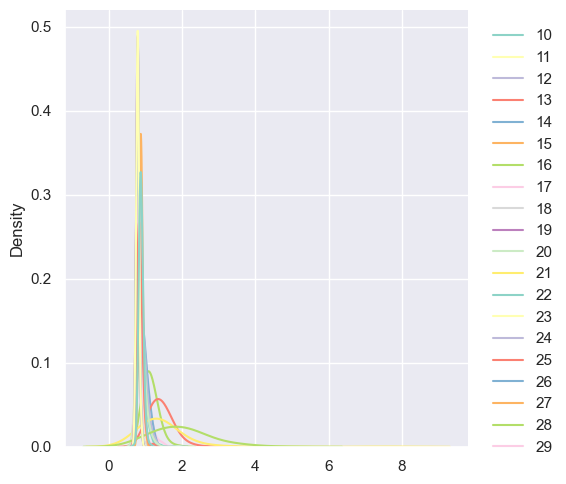

In [171]:
X_scal = (df_hcc_ss_filt_scal.T+1)
df_hcc_ss_filt_small_scal = X_scal.iloc[:, 10:30]  #just selecting part of the samples so run time not too long
sns.displot(data=df_hcc_ss_filt_small_scal,palette="Set3",kind="kde", bw_adjust=2)

The means are now more similar even though still different

We plot the normalized dataset

C:\Users\giuli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


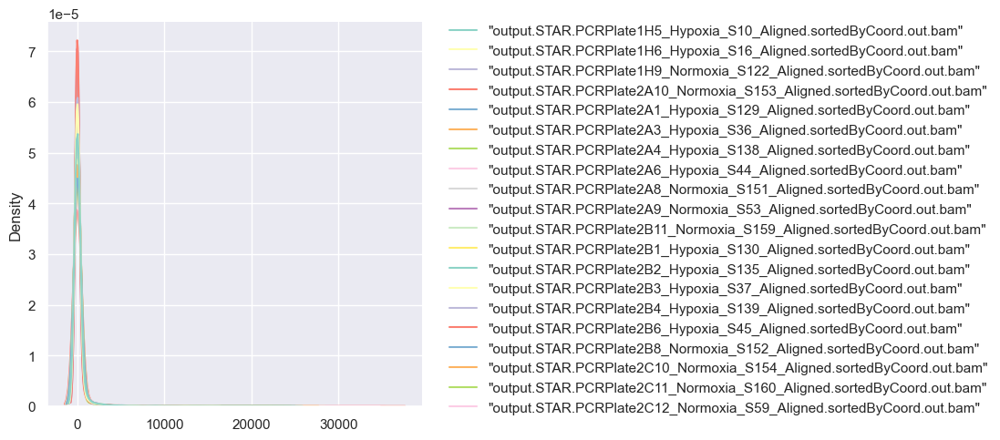

In [175]:
df_hcc_ss_norm_small = df_hcc_ss_train.iloc[:, 10:30]  #just selecting part of the samples so run time not too long
sns.displot(data=df_hcc_ss_norm_small,palette="Set3",kind="kde", bw_adjust=2)

In [177]:
print("Dataframe dimensions:", df_hcc_ss_meta.shape)
print("First column: ", df_hcc_ss_meta.iloc[:, 0])
df_hcc_ss_meta.head()

Dataframe dimensions: (243, 8)
First column:  Filename
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam     HCC1806
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam       HCC1806
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam      HCC1806
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam        HCC1806
                                                                         ...   
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam      HCC1806
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam     HCC1806
output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam     HCC1806
Name: Cell Line, Length: 243, dtype: object


,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,HCC1806,1,A10,Normo,24,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,HCC1806,1,A12,Normo,24,S26,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,HCC1806,1,A1,Hypo,24,S97,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,HCC1806,1,A2,Hypo,24,S104,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,HCC1806,1,A3,Hypo,24,S4,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


The metadata file is loaded into a DataFrame, and the dimensions and first few rows of the DataFrame are displayed. This step is crucial for confirming that the data has been loaded correctly and understanding its structure. It provides a quick glimpse into the dataset, ensuring that all necessary columns are present. This initial inspection helps in identifying any immediate issues with the data, such as missing columns or unexpected data types. Lockly, we can check visually that none of the columns are missing and that all the data were uploaded correctly.

In [178]:
# Check for duplicate rows
duplicate_rows = df_hcc_ss_meta.duplicated().sum()
print("Number of duplicate rows:", duplicate_rows)

Number of duplicate rows: 0


The code checks for duplicate rows in the metadata and prints the number of duplicates found. Ensuring there are no duplicates is important for maintaining the integrity of the analysis. Duplicate rows can skew results and lead to incorrect conclusions. In case a duplicate row was present, luckly there were none, removing them would have ensured that each sample is uniquely represented, preventing bias in the analysis. This step is critical for the accuracy of statistical tests.

In [179]:
# Identify columns with only one unique value
columns_to_drop = [col for col in df_hcc_ss_meta.columns if df_hcc_ss_meta[col].nunique() == 1]

# Drop these columns
df_hcc_ss_meta_cleaned = df_hcc_ss_meta.drop(columns=columns_to_drop)

# Print the resulting DataFrame shape and the dropped columns
print("Dropped columns:", columns_to_drop)
print("Data shape after dropping uniform columns:", df_hcc_ss_meta_cleaned.shape)
print("First few rows of cleaned data:\n", df_hcc_ss_meta_cleaned.head())


Dropped columns: ['Cell Line', 'Hours', 'PreprocessingTag', 'ProcessingComments']
Data shape after dropping uniform columns: (243, 4)
First few rows of cleaned data:
                                                     PCR Plate  Pos Condition  \
Filename                                                                       
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned....          1  A10     Normo   
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.s...          1  A12     Normo   
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sor...          1   A1      Hypo   
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.so...          1   A2      Hypo   
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sort...          1   A3      Hypo   

                                                   Cell name  
Filename                                                      
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned....      S123  
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.s...       S26  
output.STAR.PCRPlate

Columns with only one unique value are identified and dropped to simplify the dataset. This reduces noise and ensures that only informative variables are included in the analysis. The cleaned data is then inspected to confirm the changes. Dropping uniform columns makes the dataset skinniner, making it more manageable for my computer and focused. This step is essential for enhancing the efficiency and interpretability of the analysis. In this case the columns that were dropped were: Cell Line, Hours, preprocessingTag and ProcessingComments. Furthermore, also the filename columns contain information that are also containe in the other columns, but because it gives a summary for each cell I decided to keep it.

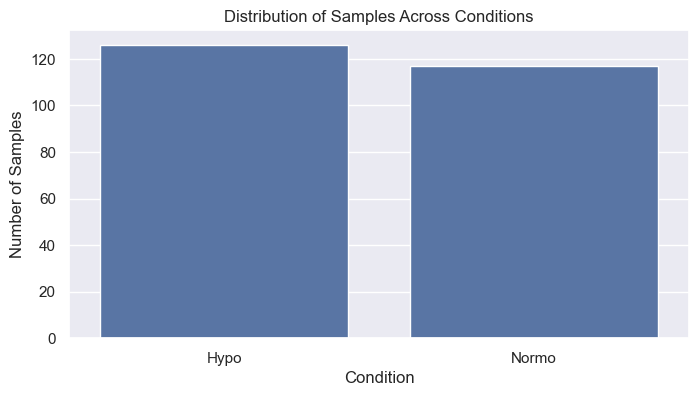

In [180]:
# Distribution of samples across conditions
condition_counts = df_hcc_ss_meta['Condition'].value_counts()
plt.figure(figsize=(8, 4))
sns.barplot(x=condition_counts.index, y=condition_counts.values)
plt.title('Distribution of Samples Across Conditions')
plt.xlabel('Condition')
plt.ylabel('Number of Samples')
plt.show()

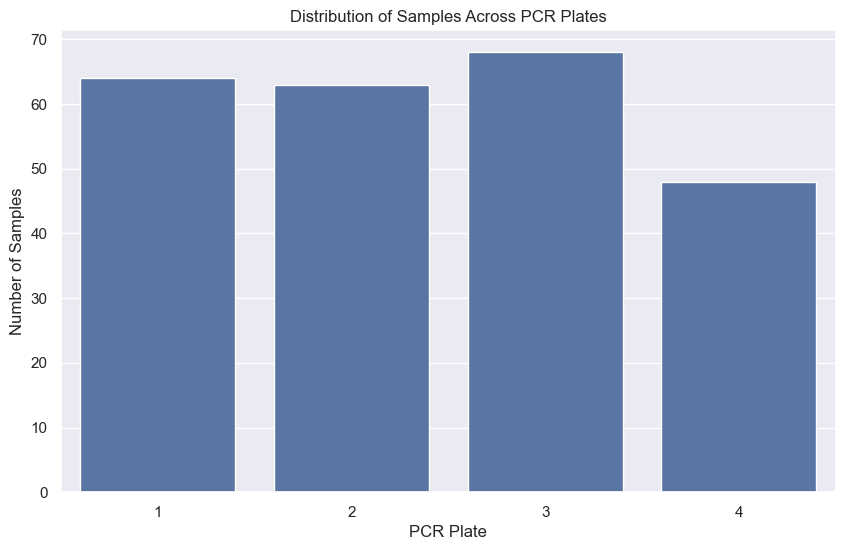

In [181]:
# Distribution of samples across PCR plates
plate_counts = df_hcc_ss_meta['PCR Plate'].value_counts()
plt.figure(figsize=(10, 6))
sns.barplot(x=plate_counts.index, y=plate_counts.values)
plt.title('Distribution of Samples Across PCR Plates')
plt.xlabel('PCR Plate')
plt.ylabel('Number of Samples')
plt.show()

Bar plots are created to visualize the distribution of samples across different conditions and PCR plates. This helps in understanding the balance of samples within the dataset, ensuring that comparisons between conditions are fair. Visualizing the distribution of samples reveals potential biases or imbalances that could affect the analysis. It provides a clear picture of how the experimental conditions are represented in the dataset. In these cases we can see that there is around a 60% of cells that suffer from hypoxia and a 40% that doesn't, showing no significant bias. Furthermore, from the distribution accross the PCR plates we can see that the first 3 plates have a balanced distribution while the 4th one doesn't have as many, thus requiring further tests with a heatmap to check if the position of the cells in the pcr plate might be significant for the condition

In [182]:
# Ensure there are no missing values
missing_values = df_hcc_ss_meta.isnull().sum()
print("Missing values in each column:\n", missing_values)

Missing values in each column:
 Cell Line             0
PCR Plate             0
Pos                   0
Condition             0
Hours                 0
Cell name             0
PreprocessingTag      0
ProcessingComments    0
dtype: int64


The code checks for missing values in the dataset and prints the count for each column. In case some of them were presents, not this case, handling them would have been  crucial to ensure the integrity of the analysis. Identifying and addressing missing values is important for maintaining the quality of the dataset. Missing data can lead to inaccurate results and reduced statistical power in subsequent analyses.


In [183]:
# Count the number of unique values in each categorical column
unique_counts = df_hcc_ss_meta.select_dtypes(include=[object]).nunique()
print("Unique Counts in Categorical Columns:\n", unique_counts)


Unique Counts in Categorical Columns:
 Cell Line               1
Pos                    91
Condition               2
Cell name             243
PreprocessingTag        1
ProcessingComments      1
dtype: int64


The number of unique values in each categorical column is counted and printed. This helps in understanding the variability within these columns and identifying potential issues. Knowing the number of unique values in categorical columns helps in detecting anomalies and ensuring that the dataset is well-structured. It also provides insights into the diversity of the experimental conditions. Through these numbers, and a visually inspection of the file I can be sure that all the columns containing what they should.

In [184]:
# Count the number of occurrences for each Pos
pos_counts = df_hcc_ss_meta['Pos'].value_counts()

# Print the counts for each position
for pos, count in pos_counts.items():
    print(f"{pos} total = {count}")


A10 total = 4
H2 total = 4
F12 total = 4
F4 total = 4
G10 total = 4
G12 total = 4
C6 total = 4
G2 total = 4
C12 total = 4
C11 total = 4
C10 total = 4
G7 total = 4
E12 total = 4
B3 total = 4
B6 total = 4
B1 total = 4
B11 total = 4
A9 total = 4
A3 total = 4
G1 total = 3
E5 total = 3
E8 total = 3
H10 total = 3
F2 total = 3
F9 total = 3
F1 total = 3
E3 total = 3
F10 total = 3
H1 total = 3
G4 total = 3
C3 total = 3
B8 total = 3
G6 total = 3
H6 total = 3
G9 total = 3
E1 total = 3
F7 total = 3
D9 total = 3
C8 total = 3
A1 total = 3
A6 total = 3
D5 total = 3
B2 total = 3
B4 total = 3
C1 total = 3
C5 total = 3
C7 total = 3
A8 total = 3
D1 total = 3
D12 total = 3
C9 total = 2
A2 total = 2
E7 total = 2
E4 total = 2
E9 total = 2
A5 total = 2
A4 total = 2
F3 total = 2
G11 total = 2
F6 total = 2
E6 total = 2
H11 total = 2
H3 total = 2
C2 total = 2
E2 total = 2
H7 total = 2
E11 total = 2
E10 total = 2
B9 total = 2
F8 total = 2
A12 total = 2
G3 total = 2
F5 total = 2
D2 total = 2
B7 total = 2
G8 total

Number of occurrences of the number 4 in the contingency table: 19


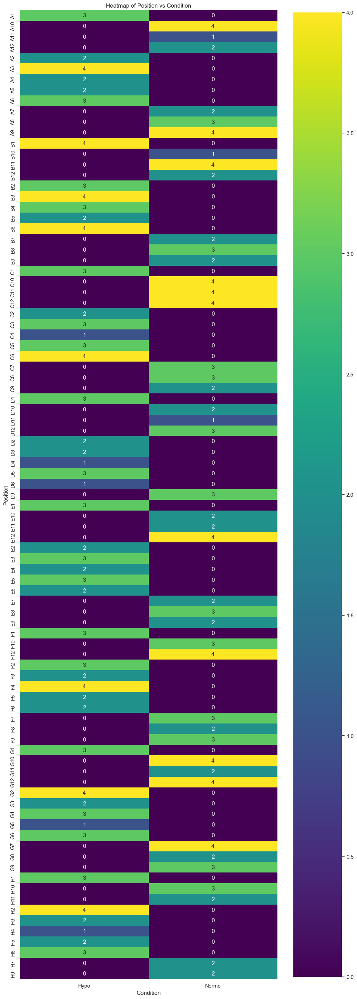

In [185]:
# Create a contingency table of Pos vs Condition
contingency_table = pd.crosstab(df_hcc_ss_meta['Pos'], df_hcc_ss_meta['Condition'])

# Count the number of occurrences of the number 4 in the contingency table
count_of_fours = (contingency_table == 4).sum().sum()

# Print the result
print("Number of occurrences of the number 4 in the contingency table:", count_of_fours)

# Plot the heatmap
plt.figure(figsize=(12, len(contingency_table) * 0.4))  # Adjusting the height based on the number of positions
sns.heatmap(contingency_table, annot=True, cmap='viridis')
plt.title('Heatmap of Position vs Condition')
plt.xlabel('Condition')
plt.ylabel('Position')
plt.show()


The heatmap is generated to visualize the location of cells in different PCR plates under various conditions. This visualization helps in identifying any patterns or biases in the placement of samples within the plates.
By visualizing the cell locations, we can detect any systematic errors or biases in sample placement that might affect the results. This step ensures the experimental setup is robust and unbiased, indicating areas with higher or lower expression levels under different conditions. In this case, we can see that the positions on the PCR Plate always predicts it's condition.

In [186]:
# Create a contingency table of Pos vs Condition
contingency_table = pd.crosstab(df_hcc_ss_meta_cleaned['Pos'], df_hcc_ss_meta_cleaned['Condition'])

# Perform Chi-squared test of independence
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Print the results
print("Chi-squared test statistic:", chi2)
print("p-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies:\n", expected)

# Interpret the p-value
alpha = 0.05
if p < alpha:
    print("There is a significant association between position and condition.")
else:
    print("There is no significant association between position and condition.")


Chi-squared test statistic: 243.00000000000003
p-value: 5.274740351043452e-16
Degrees of freedom: 90
Expected frequencies:
 [[1.55555556 1.44444444]
 [2.07407407 1.92592593]
 [0.51851852 0.48148148]
 [1.03703704 0.96296296]
 [1.03703704 0.96296296]
 [2.07407407 1.92592593]
 [1.03703704 0.96296296]
 [1.03703704 0.96296296]
 [1.55555556 1.44444444]
 [1.03703704 0.96296296]
 [1.55555556 1.44444444]
 [2.07407407 1.92592593]
 [2.07407407 1.92592593]
 [0.51851852 0.48148148]
 [2.07407407 1.92592593]
 [1.03703704 0.96296296]
 [1.55555556 1.44444444]
 [2.07407407 1.92592593]
 [1.55555556 1.44444444]
 [1.03703704 0.96296296]
 [2.07407407 1.92592593]
 [1.03703704 0.96296296]
 [1.55555556 1.44444444]
 [1.03703704 0.96296296]
 [1.55555556 1.44444444]
 [2.07407407 1.92592593]
 [2.07407407 1.92592593]
 [2.07407407 1.92592593]
 [1.03703704 0.96296296]
 [1.55555556 1.44444444]
 [0.51851852 0.48148148]
 [1.55555556 1.44444444]
 [2.07407407 1.92592593]
 [1.55555556 1.44444444]
 [1.55555556 1.44444444]
 

This analysis uses the Chi-squared test to evaluate whether there is a significant association between the positions on the PCR plates and the experimental conditions (Hypoxia, Normoxia). The p-value obtained from the test helps determine the statistical significance. An alpha level of 0.05 is chosen as suggested by multiple statistics websites, like: the university of Idaho, https://www.webpages.uidaho.edu/~brian/why_significance_is_five_percent.pdf and https://www.statisticshowto.com/probability-and-statistics/statistics-definitions/what-is-an-alpha-level/. The results indicate whether any observed association is likely due to random chance or represents a true relationship in the data. If the p-value is less than 0.05, like in this case, we reject the null hypothesis, concluding that there is a significant association between the position and condition. This indicates that the spatial arrangement of samples affects the experimental outcome, which could be due to systematic biases in sample placement. 

In [187]:
# Print the columns to check the names
print("Unfiltered columns:\n", df_hcc_ss_unfilt.columns)

Unfiltered columns:
 Index(['"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam"',
       ...
       '"output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam"',
       '"output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam"',
       '"output.STA

In [188]:
# Check for duplicate names
duplicate_names = df_hcc_ss_unfilt[df_hcc_ss_unfilt.duplicated()]

# Print the duplicate names
if not duplicate_names.empty:
    print("Duplicate names found:\n", duplicate_names)
else:
    print("No duplicate names found.")

# Print the number of duplicate names
print(f"Number of duplicate names: {duplicate_names.shape[0]}")

# Extract gene names
gene_names = df_hcc_ss_unfilt.iloc[:, 0]

# Check for duplicate gene names
duplicate_gene_names = gene_names[gene_names.duplicated() & ~gene_names.str.isnumeric()]

# Print the duplicate gene names
if not duplicate_gene_names.empty:
    print("Duplicate gene names found:\n", duplicate_gene_names)
else:
    print("No duplicate gene names found.")

# Print the number of duplicate gene names
print(f"Number of duplicate gene names: {duplicate_gene_names.shape[0]}")


Duplicate names found:
              "output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"  \
"ITGA10"                                                     0                        
"GPA33"                                                      0                        
"OR2M4"                                                      0                        
"ZBTB45P2"                                                   1                        
"RNY1P12"                                                    0                        
"C4orf50"                                                    0                        
"PCDHA8"                                                     0                        
"PCDHGA3"                                                    0                        
"PCDHGB3"                                                    0                        
"PCDHGA7"                                                    0                        
"PCDHGA9"          

AttributeError: Can only use .str accessor with string values!

For the unfiltered data, we are checking if they contain any duplicate names. Furthermore, from now on we will work with filtered data,

In [189]:
# Initialize lists to store cell names and gene data
cells = []
gene_data = []

# Read the file
with open(file_pat, 'r') as file:
    lines = file.readlines()
    
    # The first line contains the cell names
    cells = lines[0].strip().split()
    
    # Subsequent lines contain gene data
    for line in lines[1:]:
        parts = line.strip().split()
        gene_name = parts[0].strip('"')  # Remove potential quotes around gene names
        expression_values = list(map(float, parts[1:]))
        gene_data.append([gene_name] + expression_values)

# Create a DataFrame
columns = ['Gene'] + cells

print("Data shape:", df_hcc_ss_filt.shape)
print("First few rows:\n", df_hcc_ss_filt.head())


Data shape: (19503, 227)
First few rows:
             "output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"  \
"CICP27"                                                    0                        
"DDX11L17"                                                  0                        
"WASH9P"                                                    0                        
"OR4F29"                                                    2                        
"MTND1P23"                                                250                        

            "output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"  \
"CICP27"                                                    0                       
"DDX11L17"                                                  0                       
"WASH9P"                                                    0                       
"OR4F29"                                                    0                       
"MTND1P23"      

In [20]:
# Extract expression values for t-SNE
expression_values = df_hcc_ss_filt.iloc[:, 1:].values

# Perform t-SNE
tsne = TSNE(n_components=2, random_state=0)
tsne_result = tsne.fit_transform(expression_values)

# Create a DataFrame for t-SNE results
tsne_df = pd.DataFrame(tsne_result, columns=['TSNE1', 'TSNE2'])
tsne_df['Gene'] = df_hcc_ss_filt['Gene']

# Plot t-SNE results
plt.figure(figsize=(12, 8))
sns.scatterplot(df_hcc_ss_filt=tsne_df, x='TSNE1', y='TSNE2', hue='Gene', palette='tab10', legend=None)
plt.title('t-SNE of Gene Expression Data')
plt.show()


KeyboardInterrupt: 

T-Distributed Stochastic Neighbor Embedding (t-SNE) is a powerful dimensionality reduction technique that visualizes high-dimensional data in a two-dimensional space. This technique is particularly effective for revealing clusters in complex datasets. The t-SNE plot displays distinct clusters of cells based on their gene expression profiles. Each point represents a cell, and the proximity of points indicates similarity in gene expression. Clusters in the t-SNE plot suggest groups of cells with similar transcriptional states or cellular identities. Identifying clusters can reveal subpopulations within the dataset, which may correspond to different cell types, stages of differentiation, or responses to treatment. This information is crucial for understanding cellular heterogeneity and the underlying biological processes in further analysis.

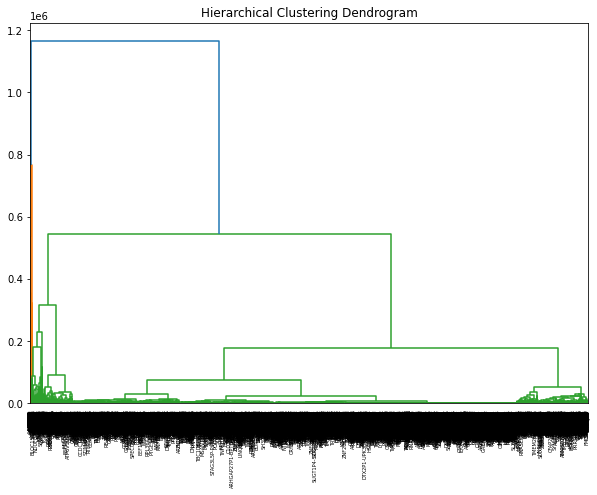

In [17]:
# Perform hierarchical clustering
linked = linkage(expression_values, method='ward')

# Plot graph
plt.figure(figsize=(10, 7))
dendrogram(linked, labels=df_hcc_ss_filt['Gene'].values, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram')
plt.show()


The hierarchical clustering dendrogram visualizes the arrangement of genes or samples into a tree structure based on their pairwise similarities. This method iteratively merges the most similar clusters, providing a comprehensive view of the data's hierarchical relationships. In this case we can see how there is an escalation of clustering on the left side of the graph. For example groups of genes that cluster together might be co-regulated or functionally related, participating in the same biological processes or pathways.

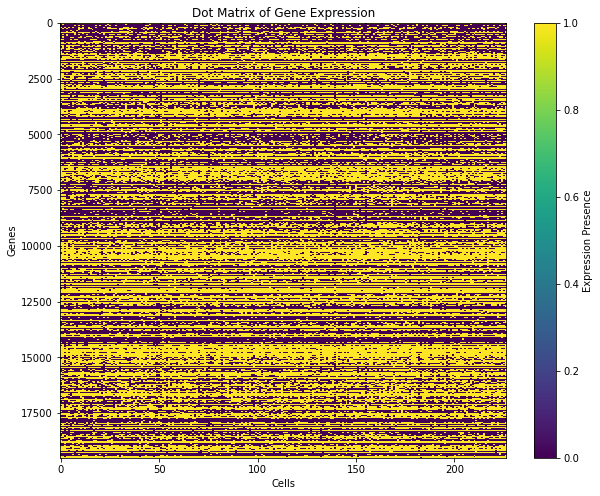

In [18]:
# Create dot matrix (binary matrix indicating presence of gene expression above a threshold)
threshold = 1.0  # Define a threshold for gene expression
binary_matrix = (expression_values > threshold).astype(int)

# Plot dot matrix with colors
plt.figure(figsize=(10, 8))
plt.imshow(binary_matrix, aspect='auto', cmap='viridis', interpolation='nearest')
plt.title('Dot Matrix of Gene Expression')
plt.xlabel('Cells')
plt.ylabel('Genes')
plt.colorbar(label='Expression Presence')
plt.show()


The dot matrix plot visualizes the presence or absence of gene expression across different cells. Each row represents a gene, and each column represents a cell. The presence of gene expression is indicated by colored dots, making it easy to spot patterns of expression, the dot matrix offers a high-level overview of the dataset, making it easier to understand the distribution of gene expression without diving into detailed numerical analysis.

# Unsupervised learning

We will use some unsupervised learning methods to find patterns and explore more our data

# MCF7

## Smart-Seq

# PCA

Principal Component Analysis (PCA) is a statistical technique used for dimensionality reduction, which involves transforming a large set of variables into a smaller one that still contains most of the information in the original set. In more details:

-Dimensionality Reduction: PCA reduces the number of dimensions (variables) in a dataset while retaining as much variability (information) as possible. This makes it easier to visualize and analyze the data.

-Principal Components: PCA identifies new variables called principal components. These components are linear combinations of the original variables, and they are uncorrelated with each other. The first principal component captures the largest possible variance in the data, the second principal component captures the next largest variance orthogonally to the first, and so on.

-Eigenvectors and Eigenvalues: The principal components are derived from the eigenvectors of the covariance matrix of the original variables, and the amount of variance captured by each principal component is given by the corresponding eigenvalues.

-Transformation: The original data is transformed into a new coordinate system defined by the principal components. This transformation helps in reducing the noise and redundancy in the data.

First of all rescale our data to evaluate features with same scale and, after that, apply on it the PCA.

In [192]:
from sklearn.preprocessing import StandardScaler
X=StandardScaler(with_mean=False).fit_transform(df_mcf_ss_train.T.apply(lambda x: np.log2(1+x)))

Text(0, 0.5, 'Variance explained')

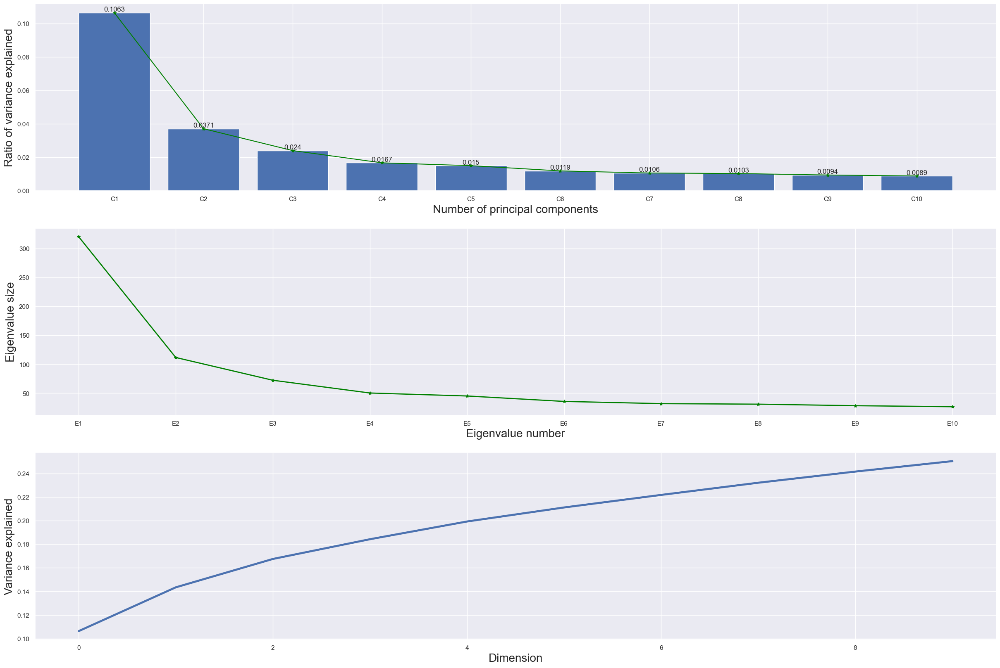

In [193]:
from sklearn.decomposition import PCA
pca=PCA()
pca.fit(X)
explained_variance = np.cumsum(pca.explained_variance_ratio_)
reduced=pca.explained_variance_ratio_
var_ratio_first=pca.explained_variance_ratio_[0:10]
lab0=[f"C{i+1}" for i in range(10)]
fig,ax= plt.subplots(3,1,figsize=(30,20))

ax[0].bar(lab0,var_ratio_first)
rects = ax[0].patches
labels = var_ratio_first.round(4) 
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax[0].text(rect.get_x() + rect.get_width() / 2, height+0.0001, label,
            ha='center', va='bottom')
ax[0].plot([(rect.get_x() + rect.get_width() / 2) for rect in rects],var_ratio_first, color='Green', marker='*')
ax[0].set_xlabel('Number of principal components',fontsize=20)
ax[0].set_ylabel('Ratio of variance explained',fontsize=20)

lab1 = [f"E{i+1}" for i in range(10)]
ax[1].plot(lab1,pca.explained_variance_[0:10], marker='*',linewidth = 2,color='Green')
ax[1].set_xlabel("Eigenvalue number",fontsize=20)
ax[1].set_ylabel("Eigenvalue size",fontsize=20)

cumulative = np.cumsum(var_ratio_first)
ax[2].plot(cumulative, linewidth = 3.5)
ax[2].set_xlabel('Dimension',fontsize=20)
ax[2].set_ylabel('Variance explained',fontsize=20)

In [194]:
pca=PCA(n_components=0.95)
red=pca.fit_transform(X)
red.shape

(250, 215)

The variance is represented mostly by the first components. Now we look at the mean square error.

In [195]:
from sklearn.metrics import mean_squared_error as mse
mse(pca.inverse_transform(red),X)

0.04988596732616943

In [196]:
df_pca=pd.DataFrame(red,index=df_mcf_ss_train.columns,columns=[f'C{i+1}' for i in range(red.shape[1])])
df_pca

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,...,C206,C207,C208,C209,C210,C211,C212,C213,C214,C215
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,-15.710434,-16.179073,-2.263915,-7.774555,5.534131,-3.536737,-0.170578,-2.168164,-1.950439,0.836618,...,-0.643586,2.984677,1.810721,-4.669063,-2.502357,0.348485,0.763315,-2.882541,-1.387289,-0.207850
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,-18.983359,5.473194,7.203289,0.089489,-6.589804,-7.108833,3.529300,-2.144825,-3.148470,-0.083229,...,-2.913559,0.616099,0.382135,0.208147,-4.439216,-2.192125,4.609924,2.078082,6.630333,-3.648201
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,-21.586720,-6.120333,6.762018,-6.174048,1.515609,3.874230,-2.204022,-0.497137,-3.317775,-0.102960,...,3.468686,4.147656,-0.644520,-2.453051,-1.355747,-2.914893,0.437784,-1.290140,-2.502462,-6.260681
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,-17.452256,7.039992,6.295200,5.119553,-5.665692,-5.201047,2.061717,0.184849,4.389004,0.203124,...,6.103490,-5.389288,1.435329,2.089046,-6.716430,0.713273,4.268438,3.504273,4.580596,-3.165122
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,10.021237,10.142292,-3.607099,-0.971443,-0.155845,-4.404010,-2.533807,-2.276717,-9.768236,-1.960110,...,-3.343895,-0.935558,-1.707635,1.216034,0.334017,1.174543,0.595598,1.786563,2.794170,0.830165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,-12.389450,-13.130980,-11.502812,3.322754,11.130915,-4.170237,0.067579,2.716094,-0.934773,3.010714,...,2.241371,2.475669,1.621110,-0.787880,-0.354521,-2.351066,0.019653,0.119624,0.754107,-0.031542
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,-5.385930,-0.403705,-6.632844,-19.545385,-6.544120,0.562801,0.287973,-3.635208,-1.717454,0.778348,...,0.856416,-0.569235,1.179001,1.473204,0.943682,-0.024896,3.034407,0.662864,-1.443625,-0.719632
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,22.759930,-17.672995,-0.867634,6.817852,1.602483,-5.648065,-0.353619,2.580238,9.271918,-9.249382,...,-2.565160,2.398034,3.026567,-3.723884,0.905971,2.863125,-0.172377,0.387128,0.315764,0.446981
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,19.452730,1.769954,5.205248,-3.857214,6.730030,1.235064,1.069662,-0.940838,-0.298645,-3.648170,...,-4.141187,-0.108781,-2.562324,-1.050681,-0.967301,0.941940,-1.392552,-4.140058,6.611750,-0.230135


Then we split the genes into hypoxic and normoxic and then we will plot a graph of the first 2 components and then of the first 3 components

In [197]:
condition_hypo = np.array(['Hypo' in cell for cell in df_mcf_ss_train.columns])
condition_normo = np.array(['Norm' in cell for cell in df_mcf_ss_train.columns])

Text(0, 0.5, 'PC2')

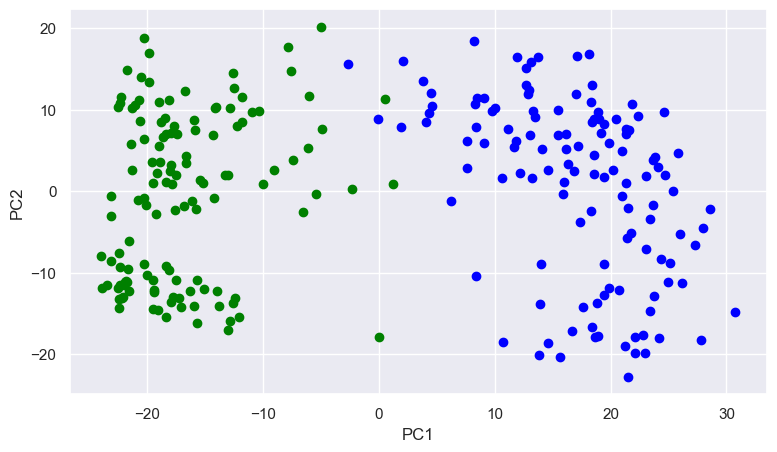

In [198]:
hypo_2= df_pca[condition_hypo].iloc[:,:2]
normo_2 = df_pca[condition_normo].iloc[:,:2]

fig,ax = plt.subplots(figsize=(9,5))
ax.scatter(hypo_2.iloc[:, 0], hypo_2.iloc[:, 1], color='blue')
ax.scatter(normo_2.iloc[:, 0], normo_2.iloc[:, 1], color='green')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

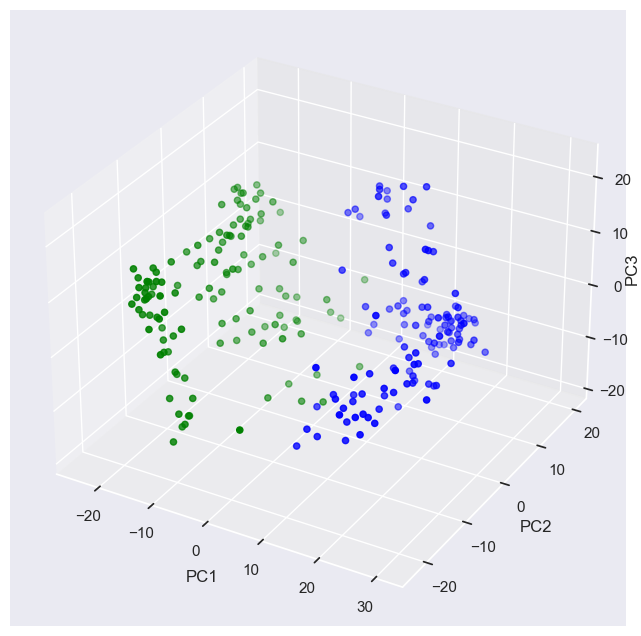

In [199]:
hypo_3 = df_pca[condition_hypo].iloc[:,:3]
normo_3 = df_pca[condition_normo].iloc[:,:3]
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(projection='3d')
ax.scatter(hypo_3.iloc[:, 0], hypo_3.iloc[:, 1], hypo_3.iloc[:, 2], color='blue')
ax.scatter(normo_3.iloc[:, 0], normo_3.iloc[:, 1], normo_3.iloc[:, 2], color='green')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3',rotation=90)
ax.zaxis.labelpad=-3

# Agglomerative clustering

Then we use agglomerative clustering and we visualize the results using dendograms with ward,complete,average and single linkage method.

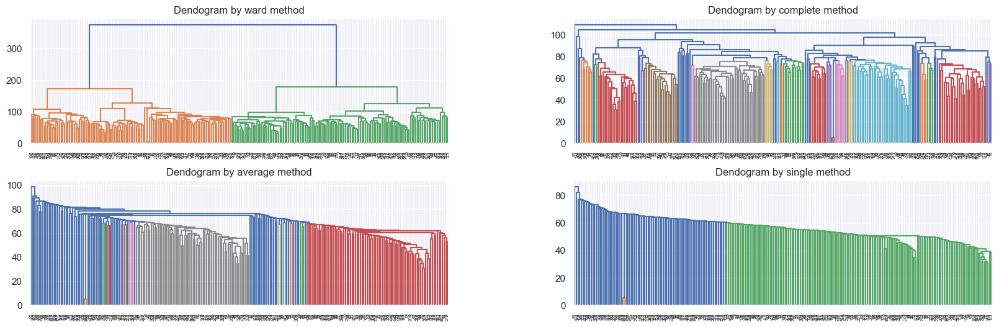

In [200]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as shc

sys.setrecursionlimit(10000)

fig,ax=plt.subplots(2,2,figsize=(20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3,wspace=0.3)
models=["ward","complete","average","single"]
for i, model in enumerate(models):
    row=i//2
    col=i%2
    ax[row][col].set_title(f"Dendogram by {model} method")
    clusters=shc.linkage(df_pca, method=model,metric="euclidean")
    shc.dendrogram(Z=clusters, ax=ax[row][col])

Only complete and ward linkage method found visible clusters.

Since we want to determine the optimal number of clusters given the dataset for achieving the best clustering results we use the silhouette and the elbow methods.

C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Window

The silhouette score for 2 clusters is 0.096
The silhouette score for 3 clusters is 0.048
The silhouette score for 4 clusters is 0.039
The silhouette score for 5 clusters is 0.032


C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Window

The silhouette score for 6 clusters is 0.031
The silhouette score for 7 clusters is 0.033
The silhouette score for 8 clusters is 0.017
The silhouette score for 9 clusters is 0.009


C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


The silhouette score for 10 clusters is 0.027


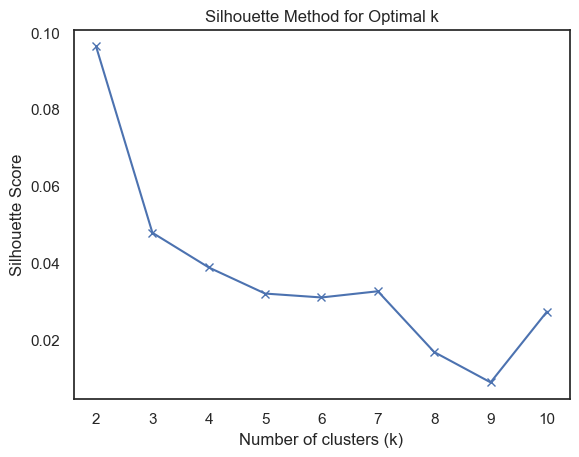

In [201]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

s_score = {} 

for i in range(2, 11):
    
    kmeans = KMeans(n_clusters=i, random_state=0, n_init=10).fit(df_pca)

    classes = kmeans.predict(df_pca)
    
    s_score[i] = (silhouette_score(df_pca, classes)) 
    print(f'The silhouette score for {i} clusters is {s_score[i]:.3f}')

plt.plot(list(s_score.keys()), list(s_score.values()), 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method for Optimal k')
plt.show()

C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Window

The within sum of squares for 1 clusters is 712585.52
The within sum of squares for 2 clusters is 640922.53
The within sum of squares for 3 clusters is 625194.48
The within sum of squares for 4 clusters is 609106.38
The within sum of squares for 5 clusters is 601371.26
The within sum of squares for 6 clusters is 598095.08
The within sum of squares for 7 clusters is 593130.77
The within sum of squares for 8 clusters is 587627.91
The within sum of squares for 9 clusters is 583707.60
The within sum of squares for 10 clusters is 578113.63


C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Window

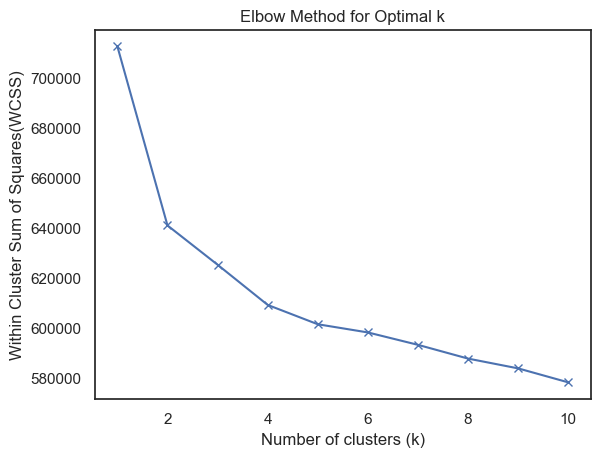

In [202]:
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as hier
from sklearn.mixture import GaussianMixture
wcss={}
for i in range (1,11):
    kmeans=KMeans(n_clusters=i,random_state=0, n_init=10).fit(df_pca)
    wcss[i]=(kmeans.inertia_)
    print(f'The within sum of squares for {i} clusters is {wcss[i]:.2f}')

plt.plot(list(wcss.keys()), list(wcss.values()),'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Within Cluster Sum of Squares(WCSS)')
plt.title('Elbow Method for Optimal k')
plt.show()

We found out that the best numbers of clusters are 2 and 3.

C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


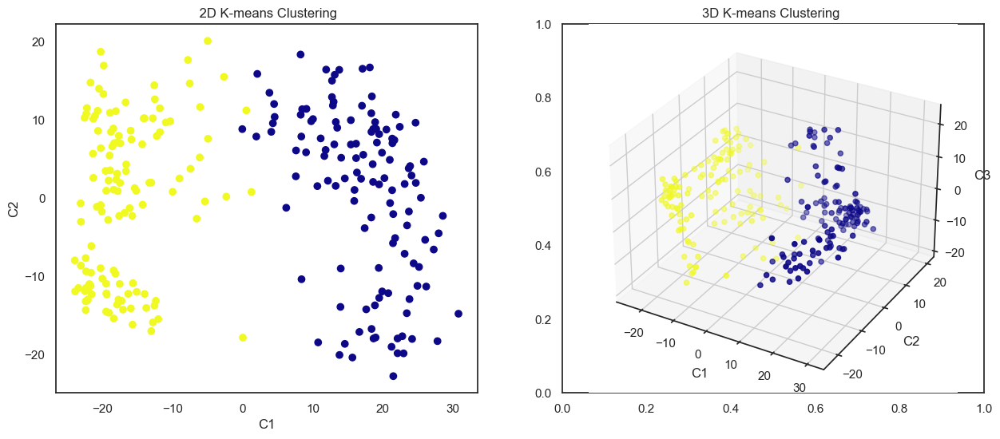

In [203]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import pdist, squareform
from mpl_toolkits.mplot3d import Axes3D

n_clusters = 2

kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10)
kmeans.fit(df_pca)

cluster_labels = kmeans.labels_


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))


ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='plasma')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title(' 2D K-means Clustering')


ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='plasma')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title('3D K-means Clustering ')

plt.show()

C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


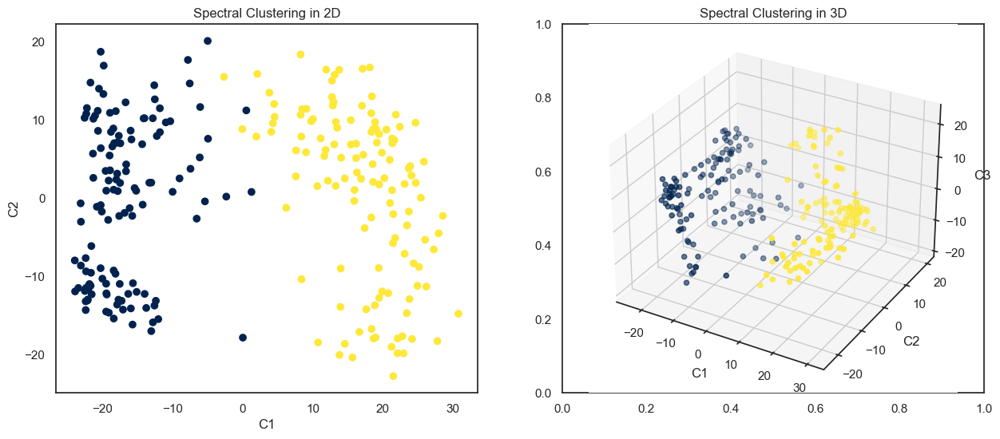

In [204]:
from sklearn.cluster import SpectralClustering
from mpl_toolkits.mplot3d import Axes3D

n_clusters = 2

spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=0)
cluster_labels = spectral_clustering.fit_predict(df_pca)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))


ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='cividis')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title('Spectral Clustering in 2D')


ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='cividis')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title('Spectral Clustering in 3D')

plt.show()

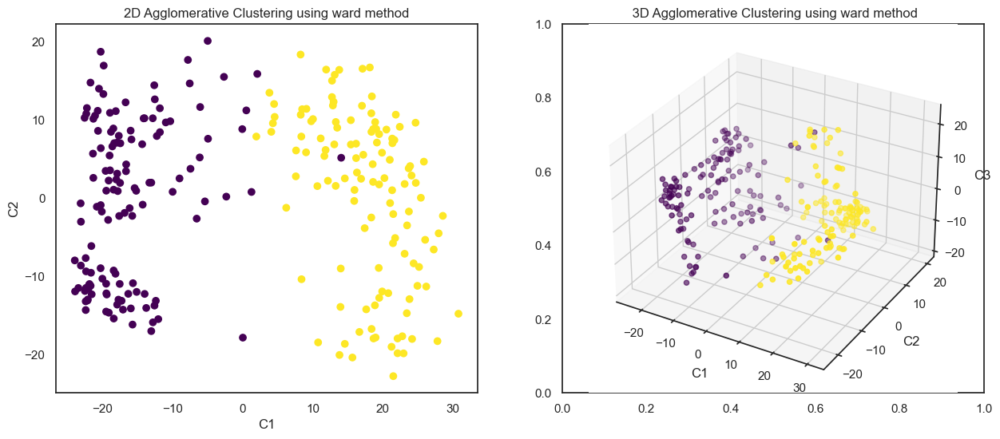

In [205]:
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist, squareform
from mpl_toolkits.mplot3d import Axes3D
 
n_clusters = 2

linkage_method = "ward"

agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage=linkage_method)
cluster_labels = agg_clustering.fit_predict(df_pca)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='viridis')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title(f'2D Agglomerative Clustering using {linkage_method} method')

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='viridis')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title(f' 3D Agglomerative Clustering using {linkage_method} method')

plt.show()

Then,we use correlation_based distance to cluster the data. It measures the similarity between gene expression patterns across various samples. We use the original dataframe and we log_transform the data in order to reduce the dimensionality of the cells using PCA.

In [206]:
from sklearn.preprocessing import StandardScaler
x=StandardScaler(with_mean=False).fit_transform(df_mcf_ss_train.apply(lambda x:np.log2(x+1)))
pca=PCA(n_components=0.95)
red=pca.fit_transform(x)
red.shape

(3000, 153)

In [207]:
df_pca_corr=pd.DataFrame(red,index=df_mcf_ss_train.T.columns, columns=[f'C{i}' for i in range(153)])
df_pca_corr

,C0,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,C143,C144,C145,C146,C147,C148,C149,C150,C151,C152
"""CYP1B1""",35.286560,15.340115,5.810700,5.090120,-1.843803,3.333802,5.551929,-0.425637,0.934824,-1.153662,...,-0.107891,0.451271,0.646830,-0.567559,0.203026,0.097025,0.328575,0.215385,-0.096300,-0.370472
"""CYP1B1-AS1""",29.427301,14.901258,5.365583,4.758536,-1.734846,3.016952,5.148658,-0.337095,0.756137,-1.324313,...,-0.292567,0.567465,0.626987,-0.403551,0.033288,0.050454,0.372366,0.266902,-0.066796,-0.377512
"""CYP1A1""",5.994419,16.951108,5.515493,4.536069,-2.225793,0.700408,1.745945,5.128402,-4.734440,-1.309278,...,-0.927295,0.417873,-0.354579,-0.995464,-0.820289,-0.226124,0.522292,-0.326527,-0.513165,0.345353
"""NDRG1""",17.677353,20.470678,-1.751501,2.652604,-2.583503,0.421096,-0.773873,2.563307,0.438804,0.645561,...,-0.767020,0.771395,-0.272321,-1.410904,-0.391434,-0.219278,-0.271449,0.390973,-0.093278,0.012142
"""DDIT4""",32.387172,15.972149,-1.010484,-0.276106,-1.370010,1.865960,-1.145865,0.234209,-1.311943,2.113242,...,0.157945,0.285522,-0.379019,-0.534676,-0.032366,-0.541859,-0.647499,-0.158211,0.690888,-0.345026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"""GRIK5""",-10.410188,0.696460,-0.052642,-0.117292,-0.307027,0.113962,-0.012732,0.086483,0.240610,-0.057393,...,0.204729,-0.123850,0.120337,-0.081558,-0.070262,-0.059109,0.020162,-0.220589,-0.186599,-0.208632
"""SLC25A27""",-10.533358,0.599722,0.185083,-0.004441,-0.060229,0.279665,-0.094580,-0.144394,0.251283,0.385239,...,-0.078078,-0.027243,0.032795,-0.104086,0.032025,0.171282,-0.013792,0.045957,-0.130305,0.004031
"""DENND5A""",11.495314,5.613233,-1.636321,0.627939,-0.863810,-0.523880,0.069123,-2.956649,-0.909677,0.123118,...,-1.036643,0.721571,0.866264,0.335171,0.840312,-0.291973,0.032547,-0.302956,0.971801,0.472062
"""CDK5R1""",-7.930032,-1.219240,-0.082187,-0.094589,0.575226,0.178141,0.004475,-0.052450,1.242715,0.103209,...,0.207504,0.478442,0.065302,0.008302,-0.610469,0.375850,-0.387906,-0.352967,-0.446645,0.034548


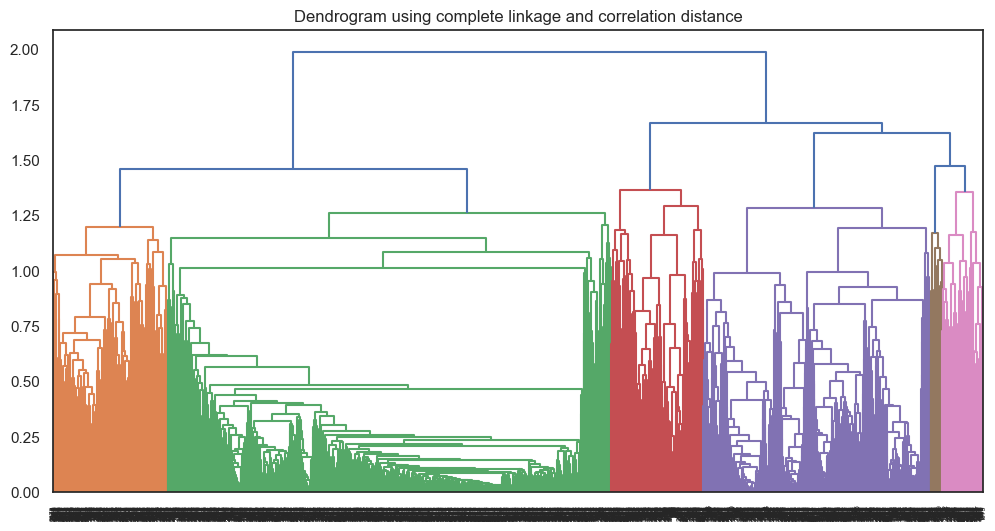

In [208]:
import scipy.cluster.hierarchy as shc
from scipy.spatial.distance import pdist
sys.setrecursionlimit(10000)

plt.figure(figsize=(12, 6))
corr_distance_matrix = pdist(df_pca_corr, metric='correlation')

clusters = shc.linkage(corr_distance_matrix, method='complete', metric='precomputed')

plt.title("Dendrogram using complete linkage and correlation distance")
shc.dendrogram(Z=clusters) 
plt.show()

The within cluster sum of squares for 1 clusters is 712849.06
The within cluster sum of squares for 2 clusters is 345578.98
The within cluster sum of squares for 3 clusters is 277694.82
The within cluster sum of squares for 4 clusters is 254760.38
The within cluster sum of squares for 5 clusters is 238863.84
The within cluster sum of squares for 6 clusters is 228104.20
The within cluster sum of squares for 7 clusters is 220186.21
The within cluster sum of squares for 8 clusters is 213965.60
The within cluster sum of squares for 9 clusters is 208618.01
The within cluster sum of squares for 10 clusters is 204528.68


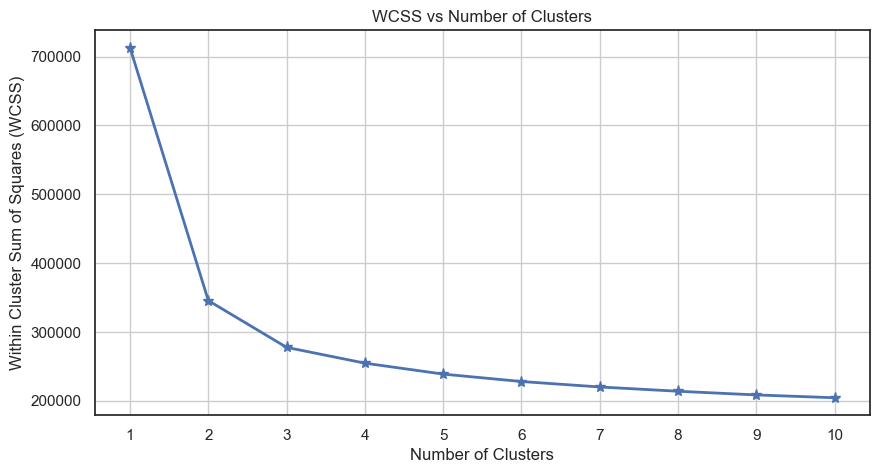

In [209]:
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as hier
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score


wcss = {} 
for i in range(1,11):

  kmeans = KMeans(n_clusters=i, random_state=0, n_init = 10).fit(df_pca_corr)
 
  wcss[i] = (kmeans.inertia_)
  print(f'The within cluster sum of squares for {i} clusters is {wcss[i]:.2f}')

x = list(wcss.keys())
y = list(wcss.values())

plt.figure(figsize=(10, 5))
plt.plot(x, y, marker='*', linestyle='-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares (WCSS)')
plt.title('WCSS vs Number of Clusters')
plt.xticks(x)
plt.grid(True)
plt.show()


Since the biggest decrease of WCSS is at 2 we select this number as the number of clusters.

The silhouette score for 2 clusters is 0.513
The silhouette score for 3 clusters is 0.432
The silhouette score for 4 clusters is 0.430
The silhouette score for 5 clusters is 0.355
The silhouette score for 6 clusters is 0.369
The silhouette score for 7 clusters is 0.285
The silhouette score for 8 clusters is 0.314
The silhouette score for 9 clusters is 0.259
The silhouette score for 10 clusters is 0.255


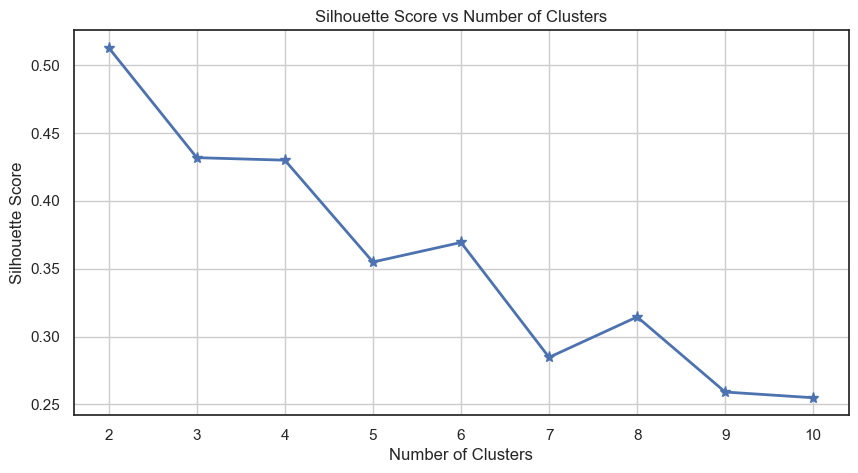

In [210]:
s_score = {} 

for i in range(2,11):

  kmeans = KMeans(n_clusters=i, random_state=0, n_init = 10).fit(df_pca_corr)

  classes = kmeans.predict(df_pca_corr)
 
  s_score[i] = (silhouette_score(df_pca_corr, classes)) 

  print(f'The silhouette score for {i} clusters is {s_score[i]:.3f}') 

x = list(s_score.keys())
y = list(s_score.values())

plt.figure(figsize=(10, 5))
plt.plot(x, y, marker='*', linestyle='-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.xticks(x)
plt.grid(True)
plt.show()

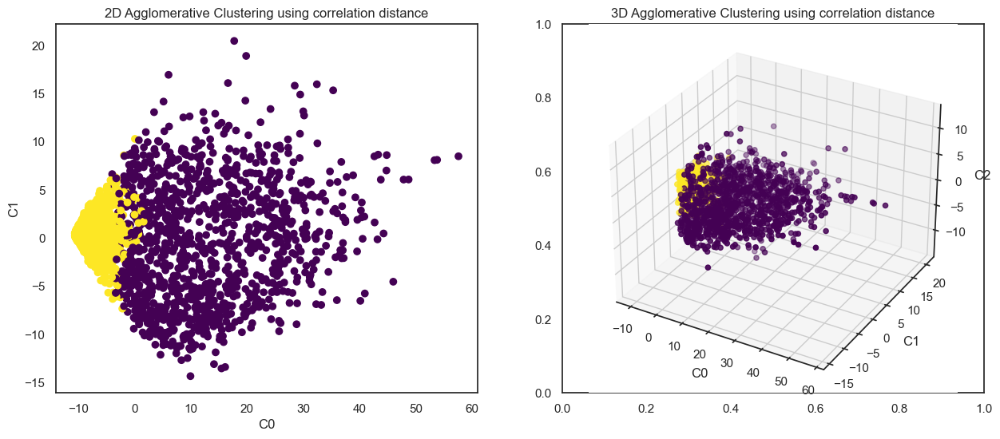

In [211]:
from sklearn.cluster import AgglomerativeClustering

from scipy.spatial.distance import pdist, squareform


n_clusters = 2

linkage_method = "complete"
corr_dist_matrix = pdist(df_pca_corr, metric='correlation')
square_corr_distance_matrix = squareform(corr_dist_matrix)

agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='precomputed', linkage=linkage_method)
cluster_labels = agg_clustering.fit_predict(square_corr_distance_matrix)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='viridis')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title(f'2D Agglomerative Clustering using correlation distance')

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='viridis')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title(f'3D Agglomerative Clustering using correlation distance')
plt.show()


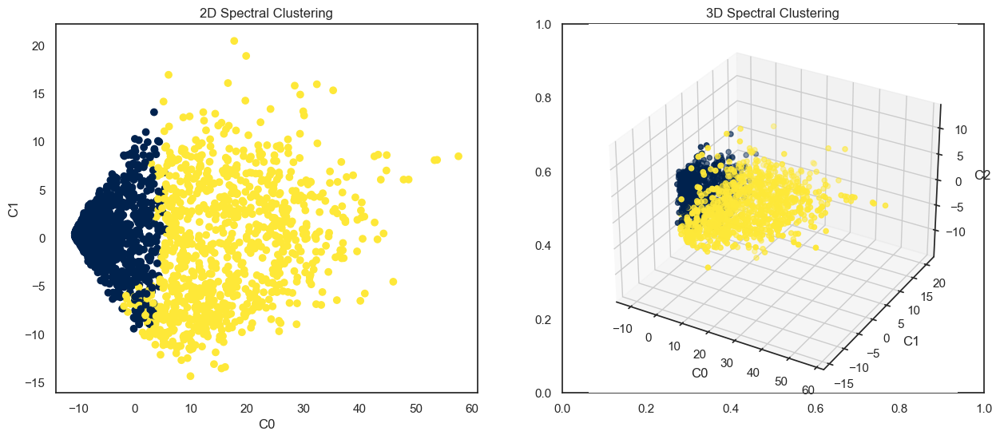

In [212]:
from sklearn.cluster import SpectralClustering

from mpl_toolkits.mplot3d import Axes3D


n_clusters = 2

spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=0)
cluster_labels = spectral_clustering.fit_predict(df_pca_corr)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='cividis')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title('2D Spectral Clustering')

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='cividis')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title('3D Spectral Clustering')

plt.show()

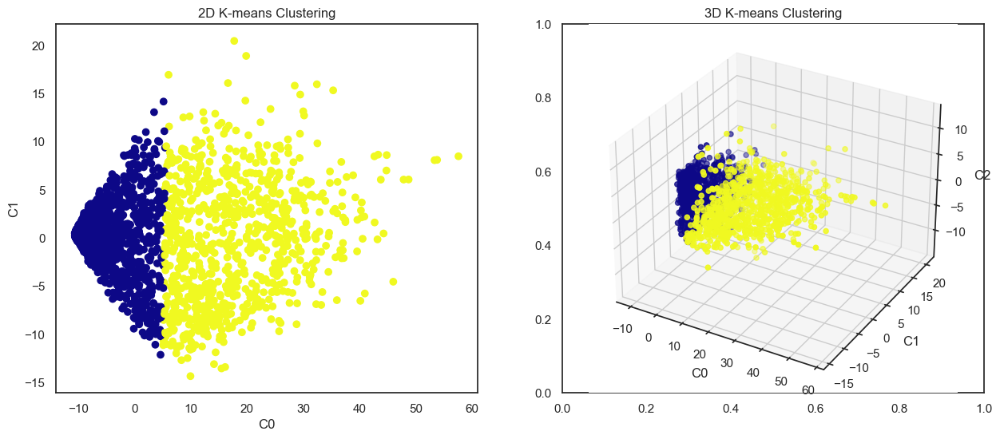

In [213]:
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

 
n_clusters = 2


kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10)
kmeans.fit(df_pca_corr)


cluster_labels = kmeans.labels_


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))


ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='plasma')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title('2D K-means Clustering')


ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='plasma')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title('3D K-means Clustering')

plt.show()

In [214]:
from sklearn.cluster import AgglomerativeClustering

df = df_mcf_ss_train.transpose()

cluster_cells = AgglomerativeClustering().fit(df)
cluster_genes =  AgglomerativeClustering().fit(df.T)

def order(children):
    n_samples = children.shape[0] + 1
    order = []

    stack = [children[-1]]

    while stack:
        root = stack.pop()

        if root[1] >= n_samples:
            stack.append(children[root[1]-n_samples])
        else:
            order.append(root[1])
        
        if root[0] >= n_samples:
            stack.append(children[root[0]-n_samples])
        else:
            order.append(root[0])

    return order

ordered_cells = order(cluster_cells.children_)
ordered_genes =  order(cluster_genes.children_)
ordered_df = df.iloc[ordered_cells, ordered_genes]

To enhance visualization, we apply feature scaling, so we divide each value in our dataframe by the maximum value in its respective column, effectively scaling the values to lie within the range of [0,1]. We do so in order to have data at a similar scale.

In [215]:
norm = ordered_df.div(ordered_df.max(axis=0), axis=1)
len(norm.index)
     

250

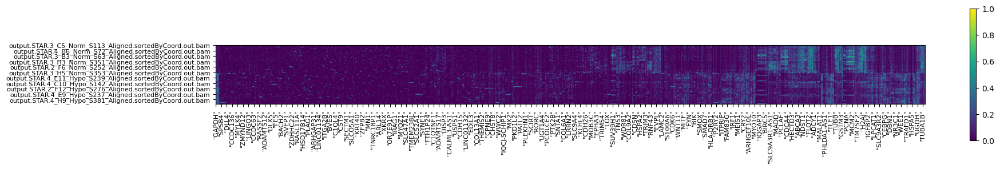

In [216]:
plt.style.use('default')

fig = plt.figure(figsize=(20, 20))

subset = norm.loc[norm.index, norm.columns]

plt.imshow(subset, cmap='viridis') 

plt.yticks(np.arange(0, len(subset.index), 23), subset.index[::23], fontsize=8)
plt.xticks(np.arange(0, len(subset.columns), 23), subset.columns[::23], rotation=90, fontsize=8)

plt.colorbar(shrink=0.15)

plt.show()

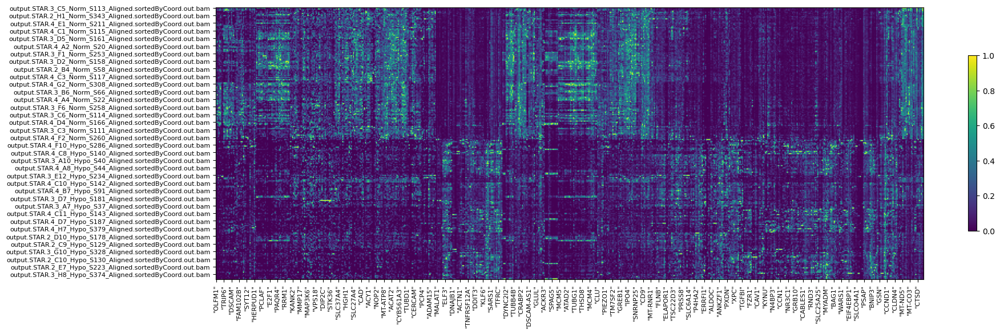

In [217]:
plt.style.use('default')

fig = plt.figure(figsize=(20, 20))

subset = norm.iloc[:,2350:]

plt.imshow(subset, cmap='viridis') 

plt.yticks(np.arange(0, len(subset.index), 7), subset.index[::7], fontsize=8)
plt.xticks(np.arange(0, len(subset.columns), 7), subset.columns[::7], rotation=90, fontsize=8)

plt.colorbar(shrink=0.2)

plt.show()

## Drop-Seq

In [223]:
df_mcf_ds_train

,MALAT1,MT-RNR2,NEAT1,H1-5,TFF1,MT-RNR1,H4C3,GDF15,KRT81,MT-CO3,...,MROH1,SKIDA1,MICALL1,RARG,MYO1F,BRWD1-AS2,RPS19BP1,AUNIP,TNK2,SUDS3
AAAAACCTATCG_Normoxia,1,0,0,0,4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAACAACCCTA_Normoxia,3,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAACACTCTCA_Normoxia,3,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAACCAGGCAC_Normoxia,6,2,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAACCTAGCTC_Normoxia,4,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTCGCGTAGA_Hypoxia,0,0,0,0,3,0,7,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTTTCGTCCGCT_Hypoxia,1,0,0,0,4,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
TTTTCTCCGGCT_Hypoxia,0,0,0,1,2,0,4,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTGTTCAAAG_Hypoxia,0,0,0,0,6,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [224]:
df_mcf_ds_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21626 entries, AAAAACCTATCG_Normoxia to TTTTTTGTATGT_Hypoxia
Columns: 3000 entries, MALAT1 to SUDS3
dtypes: int64(3000)
memory usage: 495.1+ MB


In [225]:
print('Missing values: ', df_mcf_ds_train.isnull().sum().sum())
print('Hypoxic:', pd.Series(('Hypo' in row) for row in df_mcf_ds_train.index).sum())
print('Normo:', pd.Series(('Normo' in row) for row in df_mcf_ds_train.index).sum())

Missing values:  0
Hypoxic: 8921
Normo: 12705


In [226]:
print("Number of duplicate rows: ", df_mcf_ds_train.duplicated().sum())

Number of duplicate rows:  0


In [227]:
print("Number of duplicate columns: ", df_mcf_ds_train.T.duplicated().sum())

Number of duplicate columns:  0


In [228]:
df_mcf_ds_train.T.describe()

,AAAAACCTATCG_Normoxia,AAAACAACCCTA_Normoxia,AAAACACTCTCA_Normoxia,AAAACCAGGCAC_Normoxia,AAAACCTAGCTC_Normoxia,AAAACCTCCGGG_Normoxia,AAAACTCGTTGC_Normoxia,AAAAGAGCTCTC_Normoxia,AAAAGCTAGGCG_Normoxia,AAAATCGCATTT_Normoxia,...,TTTTACAGGATC_Hypoxia,TTTTACCACGTA_Hypoxia,TTTTATGCTACG_Hypoxia,TTTTCCAGACGC_Hypoxia,TTTTCGCGCTCG_Hypoxia,TTTTCGCGTAGA_Hypoxia,TTTTCGTCCGCT_Hypoxia,TTTTCTCCGGCT_Hypoxia,TTTTGTTCAAAG_Hypoxia,TTTTTTGTATGT_Hypoxia
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,...,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,0.034000,0.030333,0.027000,0.032333,0.045333,0.047333,0.030000,0.027333,0.032000,0.027333,...,0.052333,0.043667,0.033667,0.033000,0.025333,0.037000,0.046333,0.055667,0.038000,0.033000
std,0.277254,0.220823,0.195662,0.233751,0.246235,0.299649,0.204403,0.292030,0.281074,0.237918,...,0.364654,0.244499,0.340449,0.302117,0.208261,0.286924,0.301469,0.358623,0.240642,0.244808
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,4.000000,4.000000,5.000000,6.000000,4.000000,8.000000,6.000000,13.000000,7.000000,6.000000,...,7.000000,4.000000,10.000000,8.000000,6.000000,7.000000,7.000000,9.000000,6.000000,6.000000


# PCA

Principal Component Analysis (PCA) is a statistical technique used for dimensionality reduction, which involves transforming a large set of variables into a smaller one that still contains most of the information in the original set. In particular:

-Dimensionality Reduction: PCA reduces the number of dimensions (variables) in a dataset while retaining as much variability (information) as possible. This makes it easier to visualize and analyze the data.

-Principal Components: PCA identifies new variables called principal components. These components are linear combinations of the original variables, and they are uncorrelated with each other. The first principal component captures the largest possible variance in the data, the second principal component captures the next largest variance orthogonally to the first, and so on.

-Eigenvectors and Eigenvalues: The principal components are derived from the eigenvectors of the covariance matrix of the original variables, and the amount of variance captured by each principal component is given by the corresponding eigenvalues.

-Transformation: The original data is transformed into a new coordinate system defined by the principal components. This transformation helps in reducing the noise and redundancy in the data.

In [229]:
X = df_mcf_ds_train.to_numpy()

In [230]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA()
X2D = pca.fit_transform(X_scaled)

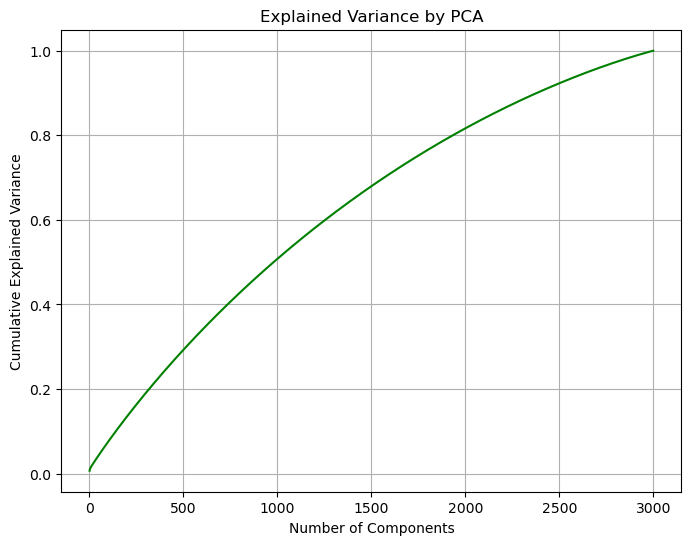

In [231]:
explained_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, color='green')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by PCA')
plt.grid(True)
plt.show()

In [232]:
sparsity_level=(df_mcf_ds_train==0).sum().sum()/df_mcf_ds_train.size
print(f"Sparsity level: {sparsity_level:.4%}")

Sparsity level: 97.5294%


# Autoencoder

In [42]:
hypo_cond=np.array(['Hypoxia' in cell for cell in df_mcf_ds_train.index])

In [43]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test= train_test_split(df_mcf_ds_train,hypo_cond,test_size=0.25,random_state=0)

In [44]:
import tensorflow as tf
from tensorflow import keras
from keras import losses
from keras.models import Model
from keras.layers import Dense, Input, Dropout

In [45]:
def auto_encoder(input_size,n_neurons, hidden_size):
    inpt=Input(shape=(input_size,))
    hidden_1=Dense(n_neurons, activation='relu')(inpt)
    drop_1=Dropout(0.5)(hidden_1)
    hidden=Dense(hidden_size, activation='relu')(drop_1)
    drop_2=Dropout(0.5)(hidden)
    hidden_2=Dense(n_neurons, activation='relu')(drop_2)
    drop_3=Dropout(0.5)(hidden_2)
    outpt=Dense(input_size,activation='relu')(drop_3)
    autoencoder=Model(inpt,outpt)
    return autoencoder

In [46]:
import numpy as np
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
best_autoencoder, best_loss, best_params, best_history = None, np.inf, None, None
from keras.callbacks import EarlyStopping
for n_neurons in [i for i in range(100,500,100)]:
    for dim in [100,200,300]:
        autoencoder = auto_encoder(X_train.shape[1],n_neurons,dim)
        autoencoder.compile(optimizer='adam', loss='mse')
        early_stopping = EarlyStopping(monitor='val_loss', patience=5)
        history = autoencoder.fit(X_train, X_train,
                epochs=50,
                batch_size=32,
                shuffle=True,
                validation_data=(X_test, X_test),
                callbacks=[early_stopping])
        val_loss = history.history['val_loss'][-1]
        if val_loss<best_loss:
            best_loss = val_loss
            best_params = {'n_neurons':n_neurons, 'hidden_size':dim}
            best_history = history
            best_autoencoder = autoencoder
print("Best loss:",best_loss)
print("Best parameters:", best_params)

Epoch 1/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0659 - val_loss: 0.0469
Epoch 2/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0491 - val_loss: 0.0455
Epoch 3/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0472 - val_loss: 0.0444
Epoch 4/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0468 - val_loss: 0.0430
Epoch 5/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0460 - val_loss: 0.0430
Epoch 6/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0457 - val_loss: 0.0419
Epoch 7/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0456 - val_loss: 0.0423
Epoch 8/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0453 - val_loss: 0.0423
Epoch 9/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0462 - val_loss: 0.0422
Epoch 10/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0450 - val_loss: 0.0436
Epoch 11/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0447 - val_loss: 0.0435
Epoch 1/50
507/507 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step 

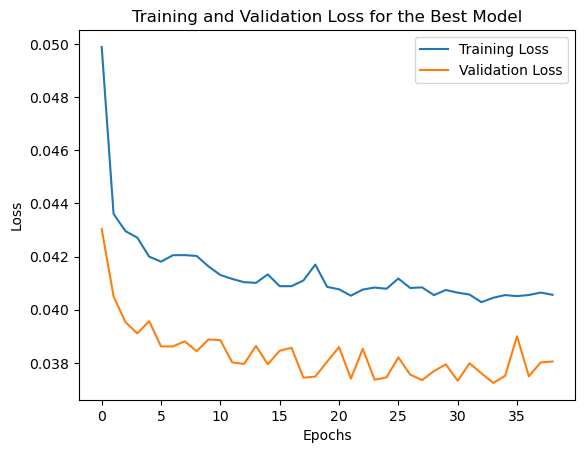

In [47]:
plt.plot(best_history.history["loss"], label="Training Loss")
plt.plot(best_history.history["val_loss"], label="Validation Loss")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss for the Best Model')
plt.show()

In [48]:
best_autoencoder.summary()

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 3000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 400)            │     1,200,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 400)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 300)            │       120,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_34 (Dropout)            │ (None, 300)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 400)            │       120,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_35 (Dropout)            │ (None, 400)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 3000)           │     1,203,000 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,932,302 (30.26 MB)

 Trainable params: 2,644,100 (10.09 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,288,202 (20.17 MB)

In [49]:
encoder = keras.models.Sequential([
    best_autoencoder.get_layer(index=0),
    best_autoencoder.get_layer(index=1),
    best_autoencoder.get_layer(index=2)
])

mcf_auto_df = pd.DataFrame(encoder.predict(df_mcf_ds_train))
mcf_auto_df.index = [df_mcf_ds_train.index]
mcf_auto_df = mcf_auto_df.add_prefix('feature_')
mcf_auto_df.shape

676/676 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


(21626, 400)

In [50]:
mcf_auto_test=pd.DataFrame(encoder.predict(df_mcf_ds_test))
mcf_auto_test.index=[df_mcf_ds_test.index]
mcf_auto_test=mcf_auto_test.add_prefix('feature_')
mcf_auto_test.shape

169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


(5406, 400)

# HCC1806

## Smart-Seq

## PCA 

Principal Component Analysis (PCA) is a statistical technique used for dimensionality reduction, which involves transforming a large set of variables into a smaller one that still contains most of the information in the original set. In more details:

-Dimensionality Reduction: PCA reduces the number of dimensions (variables) in a dataset while retaining as much variability (information) as possible. This makes it easier to visualize and analyze the data.

-Principal Components: PCA identifies new variables called principal components. These components are linear combinations of the original variables, and they are uncorrelated with each other. The first principal component captures the largest possible variance in the data, the second principal component captures the next largest variance orthogonally to the first, and so on.

-Eigenvectors and Eigenvalues: The principal components are derived from the eigenvectors of the covariance matrix of the original variables, and the amount of variance captured by each principal component is given by the corresponding eigenvalues.

-Transformation: The original data is transformed into a new coordinate system defined by the principal components. This transformation helps in reducing the noise and redundancy in the data.

First of all rescale our data to evaluate features with same scale and, after that, apply on it the PCA.

In [235]:
from sklearn.preprocessing import StandardScaler
X=StandardScaler(with_mean=False).fit_transform(df_hcc_ss_train.T.apply(lambda x: np.log2(1+x)))

Text(0, 0.5, 'Variance explained')

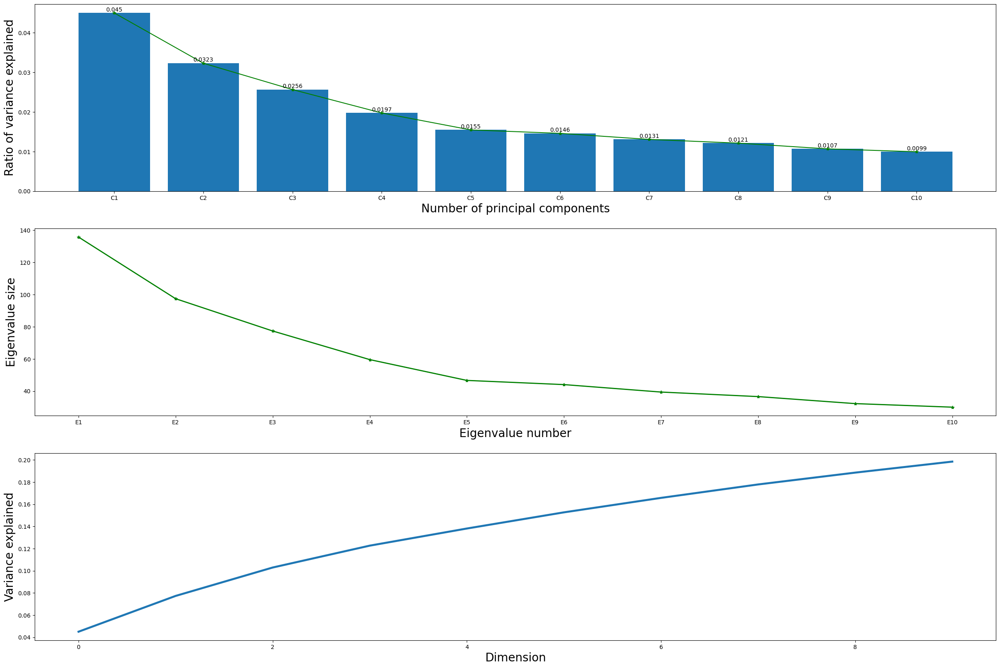

In [236]:
from sklearn.decomposition import PCA
pca=PCA()
pca.fit(X)
explained_variance = np.cumsum(pca.explained_variance_ratio_)
reduced=pca.explained_variance_ratio_
var_ratio_first=pca.explained_variance_ratio_[0:10]
lab0=[f"C{i+1}" for i in range(10)]
fig,ax= plt.subplots(3,1,figsize=(30,20))

ax[0].bar(lab0,var_ratio_first)
rects = ax[0].patches
labels = var_ratio_first.round(4) 
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax[0].text(rect.get_x() + rect.get_width() / 2, height+0.0001, label,
            ha='center', va='bottom')
ax[0].plot([(rect.get_x() + rect.get_width() / 2) for rect in rects],var_ratio_first, color='Green', marker='*')
ax[0].set_xlabel('Number of principal components',fontsize=20)
ax[0].set_ylabel('Ratio of variance explained',fontsize=20)

lab1 = [f"E{i+1}" for i in range(10)]
ax[1].plot(lab1,pca.explained_variance_[0:10], marker='*',linewidth = 2,color='Green')
ax[1].set_xlabel("Eigenvalue number",fontsize=20)
ax[1].set_ylabel("Eigenvalue size",fontsize=20)

cumulative = np.cumsum(var_ratio_first)
ax[2].plot(cumulative, linewidth = 3.5)
ax[2].set_xlabel('Dimension',fontsize=20)
ax[2].set_ylabel('Variance explained',fontsize=20)

In [237]:
pca=PCA(n_components=0.95)
red=pca.fit_transform(X)
red.shape

(182, 161)

The variance is represented mostly by the first components. Now we look at the mean square error.

In [238]:
from sklearn.metrics import mean_squared_error as mse
mse(pca.inverse_transform(red),X)

0.048833222597566665

In [239]:
df_pca=pd.DataFrame(red,index=df_hcc_ss_train.columns,columns=[f'C{i+1}' for i in range(red.shape[1])])
df_pca

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,...,C152,C153,C154,C155,C156,C157,C158,C159,C160,C161
output.STAR.PCRPlate1G12_Normoxia_S32_Aligned.sortedByCoord.out.bam,-2.837383,-8.176826,2.276625,-5.715041,4.280992,-8.950908,-1.477321,7.910201,-6.059668,-0.535211,...,-1.176680,1.415432,-1.548987,0.769595,4.727009,-1.324649,1.722088,1.632482,1.938879,-2.410463
output.STAR.PCRPlate1G1_Hypoxia_S102_Aligned.sortedByCoord.out.bam,5.495977,12.768012,3.005883,10.713463,-13.021329,-2.462059,1.919142,1.757633,-0.615019,3.869392,...,-2.351690,0.447678,6.130519,-1.937219,-2.678231,2.638314,-3.423988,-0.062363,2.503671,-2.651288
output.STAR.PCRPlate1G2_Hypoxia_S2_Aligned.sortedByCoord.out.bam,-0.924635,5.456201,-9.433591,9.074497,-5.357246,-3.236207,4.258730,-2.693919,1.109246,1.974924,...,7.386146,-1.656083,1.368029,-0.933376,-2.355688,0.193482,-2.603446,1.009994,-0.240994,-0.047020
output.STAR.PCRPlate1G3_Hypoxia_S7_Aligned.sortedByCoord.out.bam,2.862781,10.080809,7.009500,1.695630,-4.038668,-4.579361,-2.026551,1.487929,-4.511024,-8.698714,...,0.645534,-2.068330,-1.092031,-2.731243,0.905786,-1.646639,-1.358096,-0.539780,1.328168,1.287631
output.STAR.PCRPlate1G4_Hypoxia_S107_Aligned.sortedByCoord.out.bam,6.506928,-0.384659,-19.163531,9.344595,0.788865,-3.079751,-5.243221,-1.159407,2.200784,2.628923,...,10.001156,4.642193,-1.774366,4.382179,0.224667,5.836415,-3.904856,-1.170407,-5.156202,-5.725523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,-7.245707,2.300265,10.029292,-5.086482,2.583548,-1.532220,4.036843,4.444968,3.145571,-2.436943,...,2.436257,1.824985,-0.057904,5.287038,4.436508,1.509687,-0.805091,-0.013245,4.490840,2.748642
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,-14.116134,5.799054,4.086392,-11.018897,-5.135416,-3.310325,17.503442,-4.968237,-6.236285,4.873069,...,-0.030264,0.758430,-0.547155,2.374603,1.238258,0.532078,-2.497170,2.019960,2.131375,1.229040
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,-5.989040,8.419868,-7.797179,0.572046,1.219821,-2.557698,7.960108,-0.372637,2.767324,-1.006812,...,-0.858013,-0.112174,0.863056,-5.796647,2.520063,2.135834,-1.534455,4.476253,0.273478,-7.478379
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,-6.682577,-3.897496,3.926339,0.738135,2.280136,-4.562404,3.262556,2.794395,4.485668,-1.003560,...,-2.311056,0.599116,2.385715,-1.753388,-1.415110,0.928432,-1.118625,-3.201386,6.275250,-0.644585


Then we split the genes into hypoxic and normoxic and then we will plot a graph of the first 2 components and then of the first 3 components.

In [240]:
normo_cond=np.array(['Normoxia' in j for j in df_hcc_ss_train.columns])
hypo_cond=np.array(['Hypoxia' in j for j in df_hcc_ss_train.columns])

Text(0, 0.5, 'PC2')

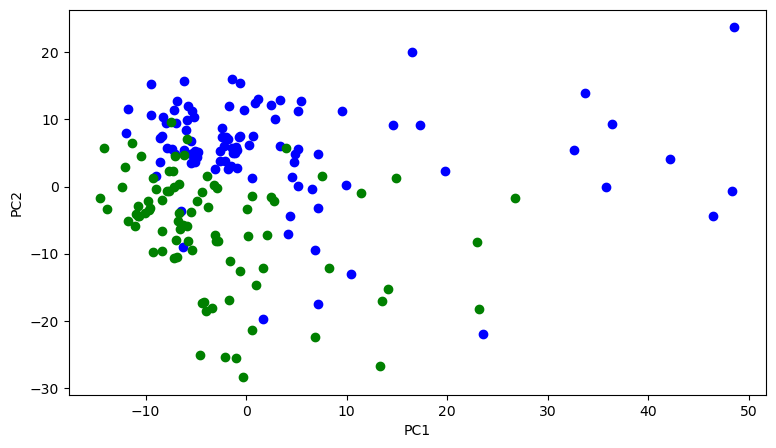

In [241]:
hypo_2= df_pca[hypo_cond].iloc[:,:2]
normo_2 = df_pca[normo_cond].iloc[:,:2]

fig,ax = plt.subplots(figsize=(9,5))
ax.scatter(hypo_2.iloc[:, 0], hypo_2.iloc[:, 1], color='blue')
ax.scatter(normo_2.iloc[:, 0], normo_2.iloc[:, 1], color='green')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

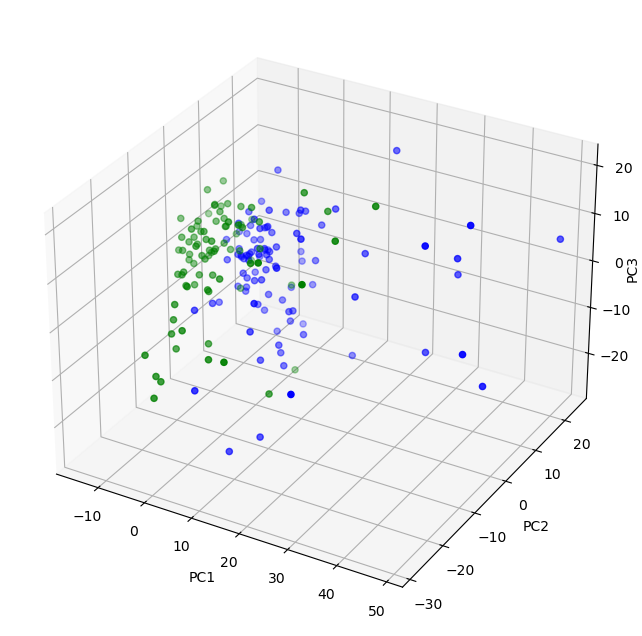

In [242]:
hypo_3 = df_pca[hypo_cond].iloc[:,:3]
normo_3 = df_pca[normo_cond].iloc[:,:3]
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(projection='3d')
ax.scatter(hypo_3.iloc[:, 0], hypo_3.iloc[:, 1], hypo_3.iloc[:, 2], color='blue')
ax.scatter(normo_3.iloc[:, 0], normo_3.iloc[:, 1], normo_3.iloc[:, 2], color='green')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3',rotation=90)
ax.zaxis.labelpad=-3

# Agglomerative clustering

Then we use agglomerative clustering and we visualize the results using dendograms with ward,complete,average and single linkage method.

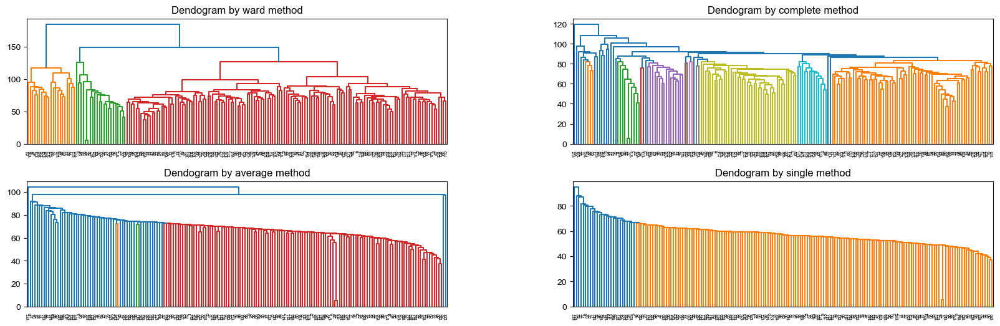

In [243]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as shc

sys.setrecursionlimit(10000)

fig,ax=plt.subplots(2,2,figsize=(20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3,wspace=0.3)
models=["ward","complete","average","single"]
for i, model in enumerate(models):
    row=i//2
    col=i%2
    ax[row][col].set_title(f"Dendogram by {model} method")
    clusters=shc.linkage(df_pca, method=model,metric="euclidean")
    shc.dendrogram(Z=clusters, ax=ax[row][col])

Only complete and ward linkage method found visible clusters.

Since we want to determine the optimal number of clusters given the dataset for achieving the best clustering results we use the silhouette and the elbow methods.

C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


The silhouette score for 2 clusters is 0.126
The silhouette score for 3 clusters is 0.020


C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


The silhouette score for 4 clusters is 0.012
The silhouette score for 5 clusters is 0.024


C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


The silhouette score for 6 clusters is 0.013
The silhouette score for 7 clusters is -0.048


C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


The silhouette score for 8 clusters is -0.002
The silhouette score for 9 clusters is 0.008


C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


The silhouette score for 10 clusters is -0.005


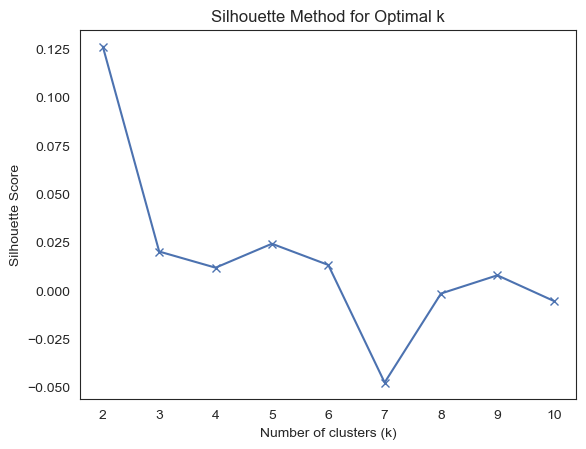

In [244]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

s_score = {} 

for i in range(2, 11):
    
    kmeans = KMeans(n_clusters=i, random_state=0, n_init=10).fit(df_pca)

    classes = kmeans.predict(df_pca)
    
    s_score[i] = (silhouette_score(df_pca, classes)) 
    print(f'The silhouette score for {i} clusters is {s_score[i]:.3f}')

plt.plot(list(s_score.keys()), list(s_score.values()), 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method for Optimal k')
plt.show()

C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


The within sum of squares for 1 clusters is 519337.06
The within sum of squares for 2 clusters is 501203.24
The within sum of squares for 3 clusters is 489367.05


C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


The within sum of squares for 4 clusters is 484247.24
The within sum of squares for 5 clusters is 482637.77
The within sum of squares for 6 clusters is 473535.36


C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


The within sum of squares for 7 clusters is 472648.76
The within sum of squares for 8 clusters is 464653.45


C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


The within sum of squares for 9 clusters is 461835.77
The within sum of squares for 10 clusters is 454486.36


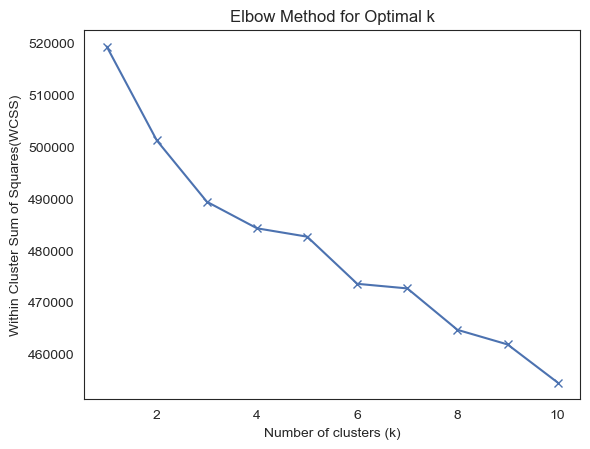

In [245]:
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as hier
from sklearn.mixture import GaussianMixture
wcss={}
for i in range (1,11):
    kmeans=KMeans(n_clusters=i,random_state=0, n_init=10).fit(df_pca)
    wcss[i]=(kmeans.inertia_)
    print(f'The within sum of squares for {i} clusters is {wcss[i]:.2f}')

plt.plot(list(wcss.keys()), list(wcss.values()),'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Within Cluster Sum of Squares(WCSS)')
plt.title('Elbow Method for Optimal k')
plt.show()

We found out that the best numbers of clusters are 2 and 3.

C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


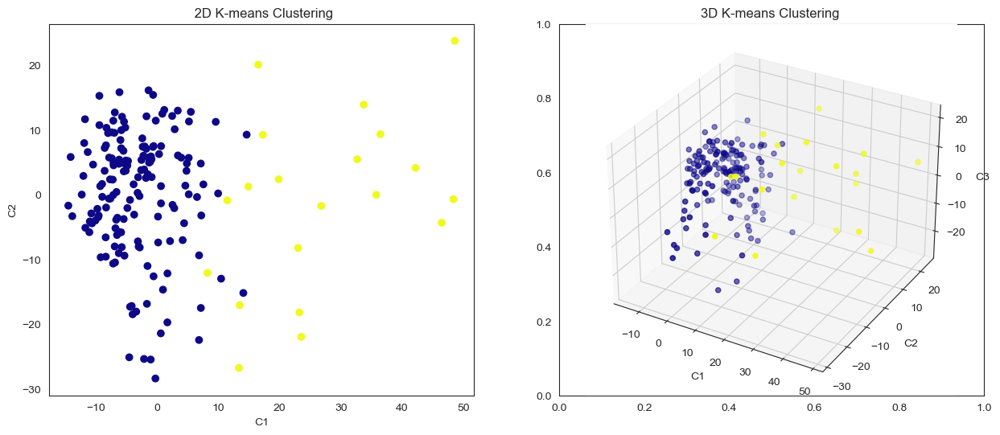

In [246]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import pdist, squareform
from mpl_toolkits.mplot3d import Axes3D

n_clusters = 2

kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10)
kmeans.fit(df_pca)

cluster_labels = kmeans.labels_


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))


ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='plasma')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title(' 2D K-means Clustering')


ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='plasma')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title('3D K-means Clustering ')

plt.show()

C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


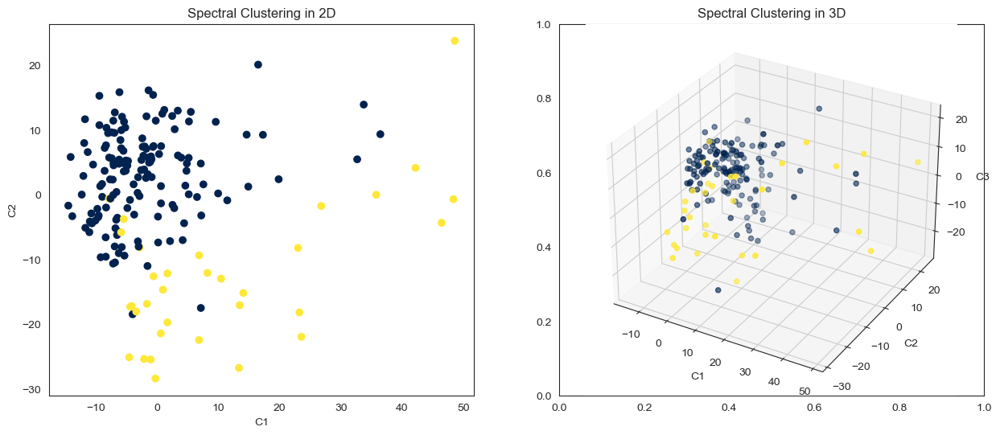

In [247]:
from sklearn.cluster import SpectralClustering
from mpl_toolkits.mplot3d import Axes3D

n_clusters = 2

spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=0)
cluster_labels = spectral_clustering.fit_predict(df_pca)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))


ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='cividis')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title('Spectral Clustering in 2D')


ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='cividis')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title('Spectral Clustering in 3D')

plt.show()

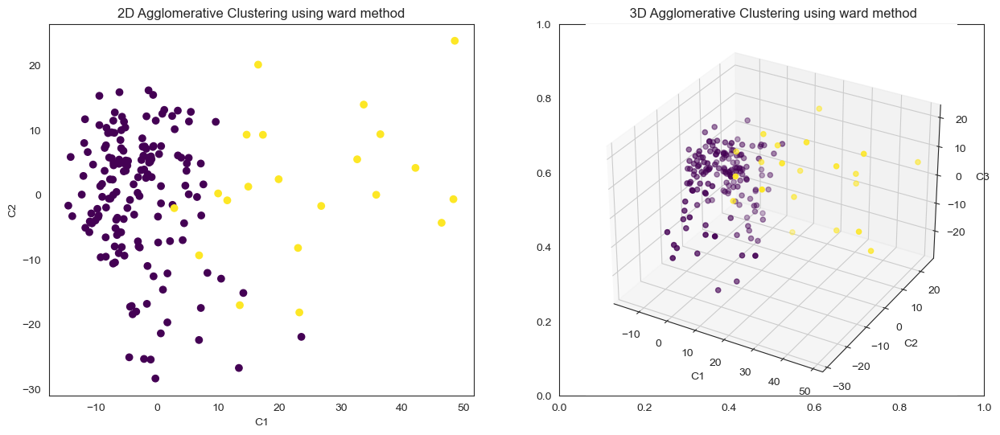

In [248]:
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist, squareform
from mpl_toolkits.mplot3d import Axes3D
 
n_clusters = 2

linkage_method = "ward"

agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage=linkage_method)
cluster_labels = agg_clustering.fit_predict(df_pca)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='viridis')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title(f'2D Agglomerative Clustering using {linkage_method} method')

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='viridis')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title(f' 3D Agglomerative Clustering using {linkage_method} method')

plt.show()

Then,we use correlation_based distance to cluster the data. It measures the similarity between gene expression patterns across various samples.
We use the original dataframe and we log_transform the data in order to reduce the dimensionality of the cells using PCA

In [249]:
from sklearn.preprocessing import StandardScaler
x=StandardScaler(with_mean=False).fit_transform(df_hcc_ss_train.apply(lambda x:np.log2(x+1)))
pca=PCA(n_components=0.95)
red=pca.fit_transform(x)
red.shape

(3000, 110)

In [250]:
df_pca_corr=pd.DataFrame(red,index=df_hcc_ss_train.T.columns, columns=[f'C{i}' for i in range(110)])
df_pca_corr

,C0,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,C100,C101,C102,C103,C104,C105,C106,C107,C108,C109
DDIT4,32.224402,5.806736,-6.433385,-3.402004,3.870499,-0.647127,-1.081253,1.328827,0.640981,1.775323,...,0.120619,0.536889,-0.232900,0.494464,0.354195,-0.106043,-0.449316,-0.066290,0.244249,0.355333
ANGPTL4,19.250937,6.586392,-10.705339,-3.859996,4.754099,-2.623865,-3.590621,-0.902558,1.996680,1.472576,...,-0.308341,0.960824,-1.122656,-0.329939,-1.424828,-0.350618,0.110653,0.074115,0.322549,0.522139
CALML5,4.992276,5.136425,5.291888,-0.934305,2.164917,-3.838124,-0.802021,-1.914341,0.746133,3.130692,...,0.525716,-1.438411,-0.954592,-1.175647,1.172699,-1.107154,1.425035,0.462492,-0.385589,0.000607
KRT14,18.832142,3.086883,0.780937,4.705460,-2.909566,0.217971,-3.342236,-1.137717,0.095063,0.945978,...,0.964694,0.361281,-0.453322,0.052814,-2.113413,0.107482,-0.318716,-0.233978,0.664943,-0.705137
CCNB1,22.823480,-6.207292,3.580959,0.024403,5.963377,3.720301,-0.236877,-2.920957,0.478117,0.315614,...,-0.054828,-0.163579,0.481779,-0.087390,-0.521102,-0.121705,0.891348,0.187524,-0.498695,0.921378
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LINC02693,8.228787,-1.749804,-1.179943,-0.072512,-4.494502,1.739871,1.373133,1.197728,1.501281,-0.494197,...,-1.603223,0.019876,0.946293,-0.052157,0.124770,0.203911,1.024092,-0.519004,0.067514,0.950818
OR8B9P,-7.564615,-0.400582,-0.049364,0.505579,0.330853,-0.313866,-0.070692,-0.090373,-0.095013,0.088387,...,-0.008067,0.066041,-0.041735,0.086768,0.038217,-0.089290,0.077699,-0.155937,0.008184,-0.099816
NEAT1,14.833854,2.646344,-1.030553,1.719790,0.998696,0.132431,0.667090,0.516478,-0.319373,0.208477,...,-0.192845,0.525458,0.056257,0.160390,-0.080433,0.759745,-0.175143,0.146081,-0.291019,0.356126
ZDHHC23,-2.060455,-0.641728,-0.376975,-1.074919,-1.656703,-0.786407,0.455017,1.313058,-0.223238,-0.838614,...,1.035804,-0.279640,-0.949719,2.793696,0.020711,0.005798,0.590601,0.634652,0.898132,-0.181939


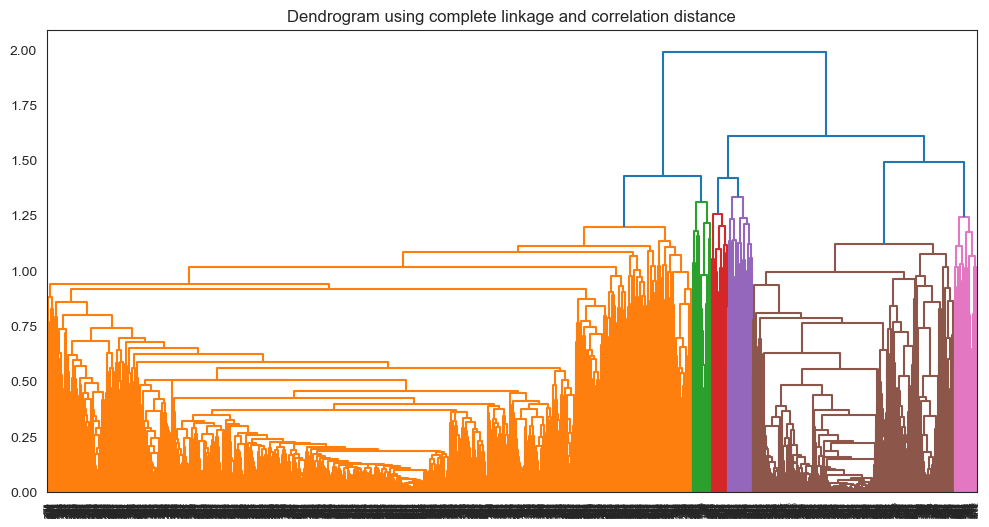

In [251]:
import scipy.cluster.hierarchy as shc
from scipy.spatial.distance import pdist
sys.setrecursionlimit(10000)

plt.figure(figsize=(12, 6))
corr_distance_matrix = pdist(df_pca_corr, metric='correlation')

clusters = shc.linkage(corr_distance_matrix, method='complete', metric='precomputed')

plt.title("Dendrogram using complete linkage and correlation distance")
shc.dendrogram(Z=clusters) 
plt.show()

The within cluster sum of squares for 1 clusters is 518916.19
The within cluster sum of squares for 2 clusters is 179619.25
The within cluster sum of squares for 3 clusters is 143420.54
The within cluster sum of squares for 4 clusters is 130907.26
The within cluster sum of squares for 5 clusters is 123635.65
The within cluster sum of squares for 6 clusters is 119645.46
The within cluster sum of squares for 7 clusters is 116568.82
The within cluster sum of squares for 8 clusters is 113864.18
The within cluster sum of squares for 9 clusters is 112165.32
The within cluster sum of squares for 10 clusters is 110863.36


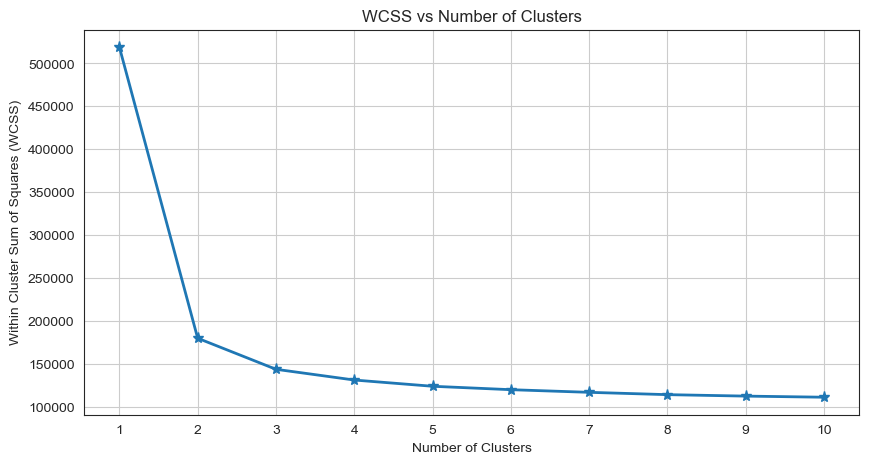

In [252]:
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as hier
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score


wcss = {} 
for i in range(1,11):

  kmeans = KMeans(n_clusters=i, random_state=0, n_init = 10).fit(df_pca_corr)
 
  wcss[i] = (kmeans.inertia_)
  print(f'The within cluster sum of squares for {i} clusters is {wcss[i]:.2f}')

x = list(wcss.keys())
y = list(wcss.values())

plt.figure(figsize=(10, 5))
plt.plot(x, y, marker='*', linestyle='-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares (WCSS)')
plt.title('WCSS vs Number of Clusters')
plt.xticks(x)
plt.grid(True)
plt.show()


Since the biggest decrease of WCSS is at 2 we select this number as the number of clusters.

The silhouette score for 2 clusters is 0.656
The silhouette score for 3 clusters is 0.567
The silhouette score for 4 clusters is 0.487
The silhouette score for 5 clusters is 0.373
The silhouette score for 6 clusters is 0.330
The silhouette score for 7 clusters is 0.325
The silhouette score for 8 clusters is 0.261
The silhouette score for 9 clusters is 0.271
The silhouette score for 10 clusters is 0.269


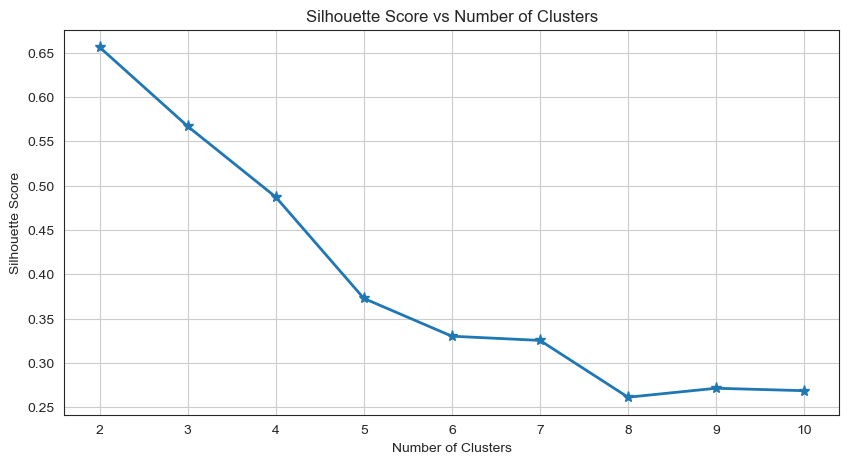

In [253]:
s_score = {} 

for i in range(2,11):

  kmeans = KMeans(n_clusters=i, random_state=0, n_init = 10).fit(df_pca_corr)

  classes = kmeans.predict(df_pca_corr)
 
  s_score[i] = (silhouette_score(df_pca_corr, classes)) 

  print(f'The silhouette score for {i} clusters is {s_score[i]:.3f}') 

x = list(s_score.keys())
y = list(s_score.values())

plt.figure(figsize=(10, 5))
plt.plot(x, y, marker='*', linestyle='-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.xticks(x)
plt.grid(True)
plt.show()

C:\Users\giuli\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:586: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  out = hierarchy.linkage(X, method=linkage, metric=affinity)


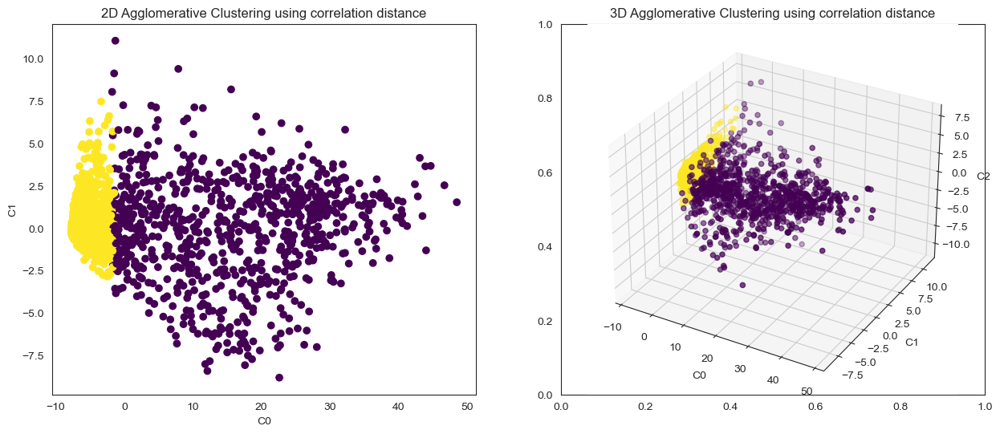

In [254]:
from sklearn.cluster import AgglomerativeClustering

from scipy.spatial.distance import pdist, squareform


n_clusters = 2

linkage_method = "complete"
corr_dist_matrix = pdist(df_pca_corr, metric='correlation')
square_corr_distance_matrix = squareform(corr_dist_matrix)

agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_method)
cluster_labels = agg_clustering.fit_predict(square_corr_distance_matrix)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='viridis')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title(f'2D Agglomerative Clustering using correlation distance')

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='viridis')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title(f'3D Agglomerative Clustering using correlation distance')
plt.show()

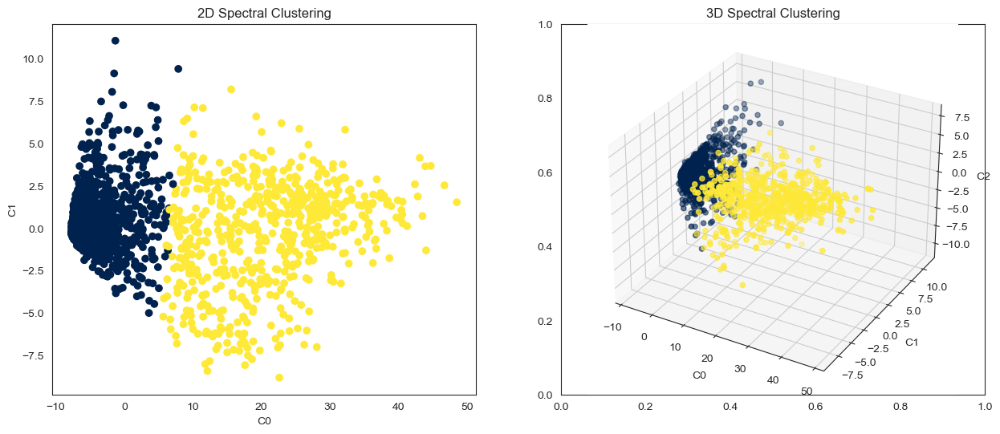

In [255]:
from sklearn.cluster import SpectralClustering

from mpl_toolkits.mplot3d import Axes3D


n_clusters = 2

spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=0)
cluster_labels = spectral_clustering.fit_predict(df_pca_corr)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='cividis')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title('2D Spectral Clustering')

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='cividis')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title('3D Spectral Clustering')

plt.show()

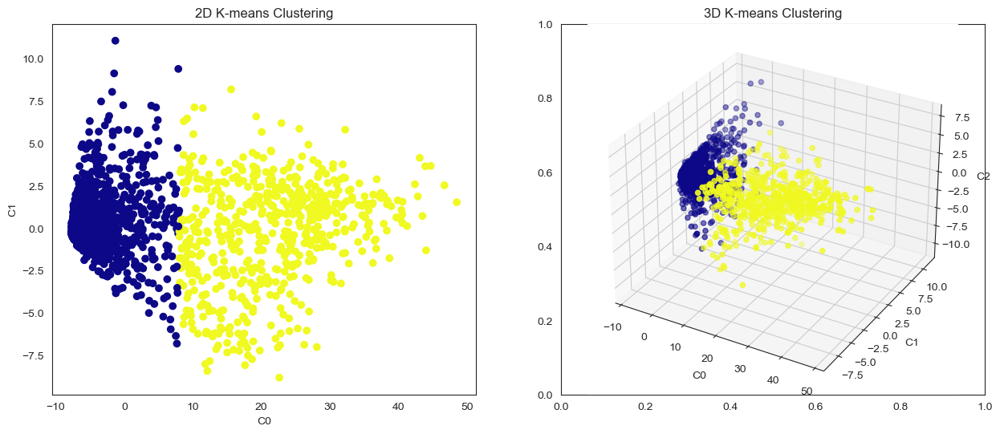

In [256]:
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

 
n_clusters = 2


kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10)
kmeans.fit(df_pca_corr)


cluster_labels = kmeans.labels_


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))


ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='plasma')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title('2D K-means Clustering')


ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='plasma')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title('3D K-means Clustering')

plt.show()

## Heatmap visualization

We now use agglomerative clustering to cluster genes and cells and reorder them in order to have data points that are the most similar to each other  grouped together.

In [257]:
from sklearn.cluster import AgglomerativeClustering

df = df_hcc_ss_train.transpose()

cluster_cells = AgglomerativeClustering().fit(df)
cluster_genes =  AgglomerativeClustering().fit(df.T)

def order(children):
    n_samples = children.shape[0] + 1
    order = []

    stack = [children[-1]]

    while stack:
        root = stack.pop()

        if root[1] >= n_samples:
            stack.append(children[root[1]-n_samples])
        else:
            order.append(root[1])
        
        if root[0] >= n_samples:
            stack.append(children[root[0]-n_samples])
        else:
            order.append(root[0])

    return order

ordered_cells = order(cluster_cells.children_)
ordered_genes =  order(cluster_genes.children_)
ordered_df = df.iloc[ordered_cells, ordered_genes]

To enhance visualization, we apply feature scaling, so we divide  each value in our dataframe by the maximum value in its respective column, effectively scaling the values to lie within the range of [0,1]. We do so in order to have data at a similar scale.

In [258]:
norm = ordered_df.div(ordered_df.max(axis=0), axis=1)
len(norm.index)
     

182

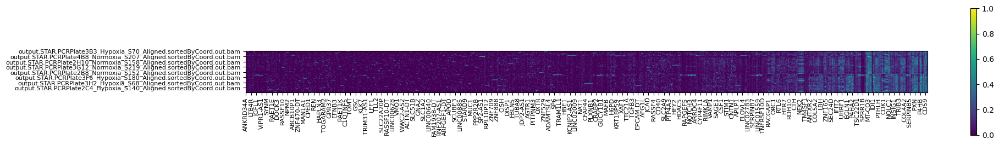

In [259]:
plt.style.use('default')

fig = plt.figure(figsize=(20, 20))

subset = norm.loc[norm.index, norm.columns]

plt.imshow(subset, cmap='viridis') 

plt.yticks(np.arange(0, len(subset.index), 23), subset.index[::23], fontsize=8)
plt.xticks(np.arange(0, len(subset.columns), 23), subset.columns[::23], rotation=90, fontsize=8)

plt.colorbar(shrink=0.15)

plt.show()

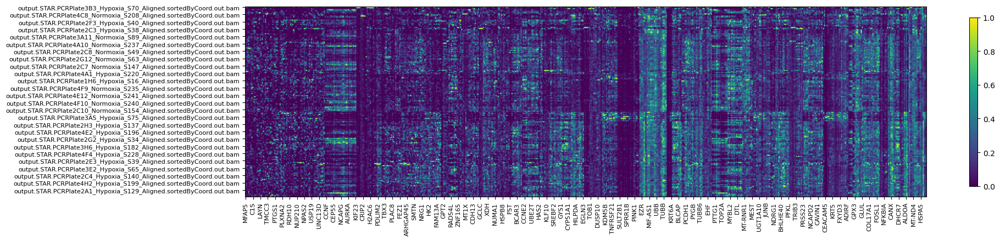

In [260]:
plt.style.use('default')

fig = plt.figure(figsize=(20, 20))

subset = norm.iloc[:,2350:]

plt.imshow(subset, cmap='viridis') 

plt.yticks(np.arange(0, len(subset.index), 7), subset.index[::7], fontsize=8)
plt.xticks(np.arange(0, len(subset.columns), 7), subset.columns[::7], rotation=90, fontsize=8)

plt.colorbar(shrink=0.2)

plt.show()


In [263]:
df_hcc_ds_train

,H1-5,MALAT1,MT-RNR2,ARVCF,BCYRN1,ATXN7L2,IGFBP3,H1-3,CTIF,RNF123,...,BATF3,CDKN3,DLD,PMPCA,ZNF165,SCCPDH,NTAN1,CLIP2,DUSP23,ZNF682
AAAAAACCCGGC_Normoxia,2,3,0,0,0,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAACCGGATGC_Normoxia,2,3,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAACGAGCTAG_Normoxia,5,2,0,0,1,0,1,3,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAACTTCCCCG_Normoxia,1,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAAGCCTACCC_Normoxia,0,12,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTTACCAATC_Hypoxia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTTTTCCGTGCA_Hypoxia,0,4,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTTTTGCCTGGG_Hypoxia,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTTTTGTAACAG_Hypoxia,3,3,1,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [264]:
df_hcc_ds_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14682 entries, AAAAAACCCGGC_Normoxia to TTTTTTTGAATC_Hypoxia
Columns: 3000 entries, H1-5 to ZNF682
dtypes: int64(3000)
memory usage: 336.2+ MB


In [265]:
df_hcc_ds_train.T.describe()

,AAAAAACCCGGC_Normoxia,AAAACCGGATGC_Normoxia,AAAACGAGCTAG_Normoxia,AAAACTTCCCCG_Normoxia,AAAAGCCTACCC_Normoxia,AAACACAAATCT_Normoxia,AAACCAAGCCCA_Normoxia,AAACCATGCACT_Normoxia,AAACCTCCGGCT_Normoxia,AAACGCCGGTCC_Normoxia,...,TTTTCTGATGGT_Hypoxia,TTTTGATTCAGA_Hypoxia,TTTTGCAACTGA_Hypoxia,TTTTGCCGGGCC_Hypoxia,TTTTGTTAGCCT_Hypoxia,TTTTTACCAATC_Hypoxia,TTTTTCCGTGCA_Hypoxia,TTTTTGCCTGGG_Hypoxia,TTTTTGTAACAG_Hypoxia,TTTTTTTGAATC_Hypoxia
count,3000.00000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.00000,3000.000000,3000.000000,...,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,0.02900,0.041667,0.024333,0.021667,0.029667,0.020000,0.036000,0.02600,0.034000,0.029333,...,0.043000,0.049667,0.037000,0.047667,0.057000,0.023333,0.041667,0.041667,0.043333,0.040000
std,0.23276,0.309778,0.231860,0.189409,0.323761,0.170126,0.250449,0.23525,0.231362,0.218683,...,0.271739,0.319219,0.279864,0.259648,0.304053,0.214797,0.236536,0.285116,0.267356,0.282418
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,5.00000,9.000000,7.000000,4.000000,12.000000,3.000000,4.000000,6.00000,4.000000,4.000000,...,4.000000,7.000000,7.000000,4.000000,5.000000,4.000000,4.000000,5.000000,5.000000,6.000000


In [266]:
print('Missing values: ', df_hcc_ds_train.isnull().sum().sum())
print('Hypoxic:', pd.Series(('Hypo' in row) for row in df_hcc_ds_train.index).sum())
print('Normo:', pd.Series(('Normo' in row) for row in df_hcc_ds_train.index).sum())

Missing values:  0
Hypoxic: 8899
Normo: 5783


In [267]:
print("Number of duplicate columns: ", df_hcc_ds_train.T.duplicated().sum())

Number of duplicate columns:  0


In [268]:
print("Number of duplicate rows: ", df_hcc_ds_train.duplicated().sum())

Number of duplicate rows:  0


# PCA

Principal Component Analysis (PCA) is a statistical technique used for dimensionality reduction, which involves transforming a large set of variables into a smaller one that still contains most of the information in the original set. In particular:

-Dimensionality Reduction: PCA reduces the number of dimensions (variables) in a dataset while retaining as much variability (information) as possible. This makes it easier to visualize and analyze the data.

-Principal Components: PCA identifies new variables called principal components. These components are linear combinations of the original variables, and they are uncorrelated with each other. The first principal component captures the largest possible variance in the data, the second principal component captures the next largest variance orthogonally to the first, and so on.

-Eigenvectors and Eigenvalues: The principal components are derived from the eigenvectors of the covariance matrix of the original variables, and the amount of variance captured by each principal component is given by the corresponding eigenvalues.

-Transformation: The original data is transformed into a new coordinate system defined by the principal components. This transformation helps in reducing the noise and redundancy in the data.



In [269]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
X=df_hcc_ds_train.to_numpy()
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
pca=PCA()
X2D=pca.fit_transform(X_scaled)

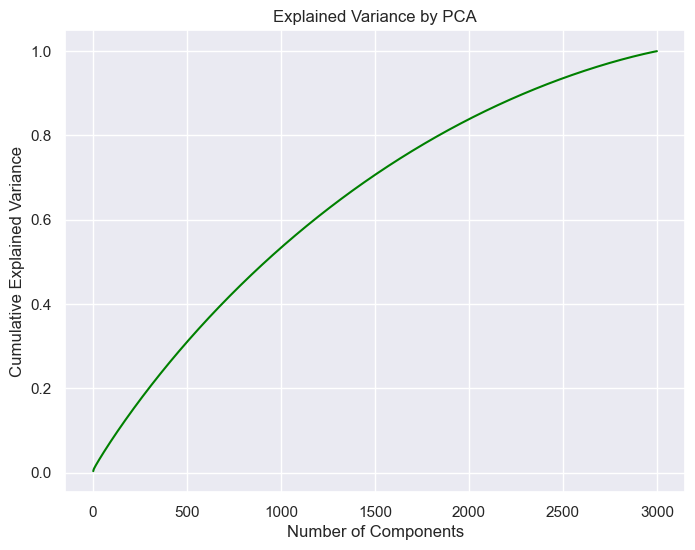

In [270]:
explained_variance = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance,color='green')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by PCA')
plt.grid(True)
plt.show()

In [271]:
sparsity_level=(df_hcc_ds_train==0).sum().sum()/df_hcc_ds_train.size
print(f"Sparsity level: {sparsity_level:.4%}")

Sparsity level: 97.6376%


In [272]:
hypo_cond=np.array(['Hypoxia' in cell for cell in df_hcc_ds_train.index])

In [273]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test= train_test_split(df_hcc_ds_train,hypo_cond,test_size=0.25,random_state=0)

# Autoencoder

In [274]:
import tensorflow as tf
from tensorflow import keras
from keras import losses
from keras.models import Model
from keras.layers import Dense, Input, Dropout

In [48]:
def auto_encoder(input_size,n_neurons, hidden_size):
    inpt=Input(shape=(input_size,))
    hidden_1=Dense(n_neurons, activation='relu')(inpt)
    drop_1=Dropout(0.5)(hidden_1)
    hidden=Dense(hidden_size, activation='relu')(drop_1)
    drop_2=Dropout(0.5)(hidden)
    hidden_2=Dense(n_neurons, activation='relu')(drop_2)
    drop_3=Dropout(0.5)(hidden_2)
    outpt=Dense(input_size,activation='relu')(drop_3)
    autoencoder=Model(inpt,outpt)
    return autoencoder

In [49]:
import numpy as np
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
best_autoencoder, best_loss, best_params, best_history = None, np.inf, None, None
from keras.callbacks import EarlyStopping
for n_neurons in [i for i in range(100,500,100)]:
    for dim in [100,200,300]:
        autoencoder = auto_encoder(X_train.shape[1],n_neurons,dim)
        autoencoder.compile(optimizer='adam', loss='mse')
        early_stopping = EarlyStopping(monitor='val_loss', patience=5)
        history = autoencoder.fit(X_train, X_train,
                epochs=50,
                batch_size=32,
                shuffle=True,
                validation_data=(X_test, X_test),
                callbacks=[early_stopping],
                verbose=0)
        val_loss = history.history['val_loss'][-1]
        if val_loss<best_loss:
            best_loss = val_loss
            best_params = {'n_neurons':n_neurons, 'hidden_size':dim}
            best_history = history
            best_autoencoder = autoencoder
print("Best loss:",best_loss)
print("Best parameters:", best_params)

KeyboardInterrupt: 

In [35]:
plt.plot(best_history.history["loss"], label="Training Loss")
plt.plot(best_history.history["val_loss"], label="Validation Loss")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss for the Best Model')
plt.show()

In [21]:
best_autoencoder.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 3000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 200)            │       600,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 300)            │        60,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 300)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 200)            │        60,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 3000)           │       603,000 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,971,102 (15.15 MB)

 Trainable params: 1,323,700 (5.05 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,647,402 (10.10 MB)

In [22]:
encoder = keras.models.Sequential([
    best_autoencoder.get_layer(index=0),
    best_autoencoder.get_layer(index=1),
    best_autoencoder.get_layer(index=2)
])

hcc_auto_df = pd.DataFrame(encoder.predict(df_hcc_ds_train))
hcc_auto_df.index = [df_hcc_ds_train.index]
hcc_auto_df = hcc_auto_df.add_prefix('feature_')
hcc_auto_df.shape

459/459 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step


(14682, 200)

In [23]:
hcc_auto_test=pd.DataFrame(encoder.predict(df_hcc_ds_test))
hcc_auto_test.index=[df_hcc_ds_test.index]
hcc_auto_test=hcc_auto_test.add_prefix('feature_')
hcc_auto_test.shape

115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


(3671, 200)

# Supervised Learning

First load all data from the files into individual dataframes (and import necessary libraries)

In [287]:
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from  sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

In [288]:
#function to create a y column as a separate dataframe
#1 is Normoxia, 0 is Hypoxia
def oxia(df):
    new_row = {col: None for col in df.columns}
    for col in df.columns:
        if '_Nor' in col:
            new_row[col] = 1
        elif '_Hyp' in col:
            new_row[col] = 0
    return pd.DataFrame(new_row, index=['oxia'])

In [289]:
#Oxia them and split them into X and y
y_df_mcf_ds_train = oxia(df_mcf_ds_train).T
y_df_hcc_ds_train = oxia(df_hcc_ds_train).T
y_df_mcf_ss_train = oxia(df_mcf_ss_train)
y_df_hcc_ss_train = oxia(df_hcc_ss_train)

In [290]:
df_mcf_ds_train = df_mcf_ds_train.T
df_hcc_ds_train = df_hcc_ds_train.T
df_mcf_ss_train = df_mcf_ss_train.T
df_hcc_ss_train = df_hcc_ss_train.T
y_df_mcf_ss_train = y_df_mcf_ss_train.T
y_df_hcc_ss_train = y_df_hcc_ss_train.T

In [291]:
#split X and y into training and testingdf_mcf_ds_train
X_train_df_mcf_ds_train, X_test_df_mcf_ds_train, y_train_df_mcf_ds_train, y_test_df_mcf_ds_train = train_test_split(df_mcf_ds_train, y_df_mcf_ds_train, test_size=0.3)
X_train_df_hcc_ds_train, X_test_df_hcc_ds_train, y_train_df_hcc_ds_train, y_test_df_hcc_ds_train = train_test_split(df_hcc_ds_train, y_df_hcc_ds_train, test_size=0.3)
X_train_df_mcf_ss_train, X_test_df_mcf_ss_train, y_train_df_mcf_ss_train, y_test_df_mcf_ss_train = train_test_split(df_mcf_ss_train, y_df_mcf_ss_train, test_size=0.3)
X_train_df_hcc_ss_train, X_test_df_hcc_ss_train, y_train_df_hcc_ss_train, y_test_df_hcc_ss_train = train_test_split(df_hcc_ss_train, y_df_hcc_ss_train, test_size=0.3)

In [292]:
#split testing into testing and validation
X_test_df_mcf_ds_train, X_val_df_mcf_ds_train, y_test_df_mcf_ds_train, y_val_df_mcf_ds_train = train_test_split(X_test_df_mcf_ds_train, y_test_df_mcf_ds_train, test_size=0.5)
X_test_df_hcc_ds_train, X_val_df_hcc_ds_train, y_test_df_hcc_ds_train, y_val_df_hcc_ds_train = train_test_split(X_test_df_hcc_ds_train, y_test_df_hcc_ds_train, test_size=0.5)
X_test_df_mcf_ss_train, X_val_df_mcf_ss_train, y_test_df_mcf_ss_train, y_val_df_mcf_ss_train = train_test_split(X_test_df_mcf_ss_train, y_test_df_mcf_ss_train, test_size=0.5)
X_test_df_hcc_ss_train, X_val_df_hcc_ss_train, y_test_df_hcc_ss_train, y_val_df_hcc_ss_train = train_test_split(X_test_df_hcc_ss_train, y_test_df_hcc_ss_train, test_size=0.5)

All the data will be added to a dictionary, indexed by the name of the data set (MCF/HCC, DS/SS). This will make it easier to iterate through the data and train models on them.

In [293]:
#put all the data into a dictionary
data = {'df_mcf_ds_train': [X_train_df_mcf_ds_train, X_test_df_mcf_ds_train, y_train_df_mcf_ds_train, y_test_df_mcf_ds_train, X_val_df_mcf_ds_train, y_val_df_mcf_ds_train],
        'df_hcc_ds_train': [X_train_df_hcc_ds_train, X_test_df_hcc_ds_train, y_train_df_hcc_ds_train, y_test_df_hcc_ds_train, X_val_df_hcc_ds_train, y_val_df_hcc_ds_train],
        'MCF_SS': [X_train_df_mcf_ss_train, X_test_df_mcf_ss_train, y_train_df_mcf_ss_train, y_test_df_mcf_ss_train, X_val_df_mcf_ss_train, y_val_df_mcf_ss_train],
        'HCC_SS': [X_train_df_hcc_ss_train, X_test_df_hcc_ss_train, y_train_df_hcc_ss_train, y_test_df_hcc_ss_train, X_val_df_hcc_ss_train, y_val_df_hcc_ss_train]}

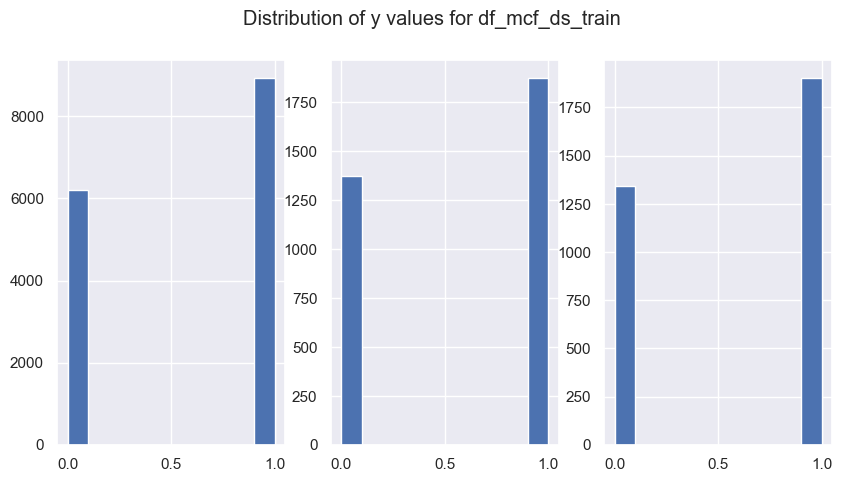

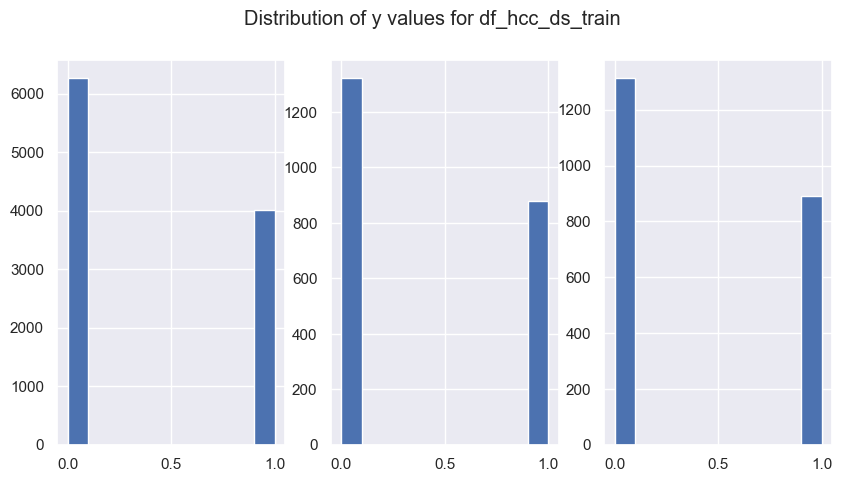

TypeError: '<=' not supported between instances of 'NoneType' and 'NoneType'

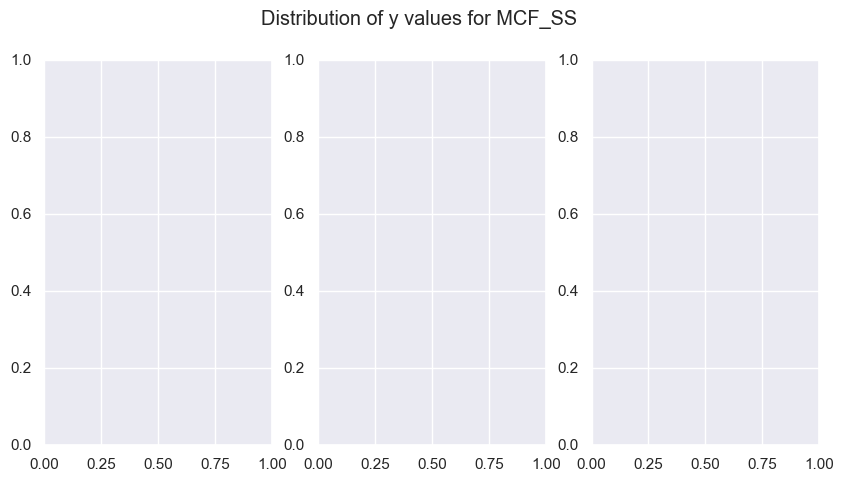

In [294]:
#go through the dict and print a plot for each set of data
for key in data:
    fig, ax = plt.subplots(1, 3, figsize=(10, 5))
    fig.suptitle('Distribution of y values for ' + key)
    ax[0].hist(data[key][2])
    ax[1].hist(data[key][3])
    ax[2].hist(data[key][5])
    plt.show()

There is an imbalance in the distribution for all data sets, however the training, test and validation sets have similar distributions for the Drop Seq data. The Smart Seq data has a less severe imbalance, but for some reason they are not distributed similarly. This could be simply due to the size of the SmartSeq data.

Now we will train a few models on the data and see how they perform on the test sets. To make it easier to understand, all models will be stored in a dictionary. The parameters for each model will be stored in a dictionary as well.
The models we are using are: Logistic Regression, K-Nearest Neighbors, Random Forest, Support Vector Machine, and Neural Network.
One thing to note is that we have placed rather lenient parameters for the SVM model for the sake of run time for the bigger data sets (both DropSeq data sets).

In [295]:
#dictionary of models:
models = {'Logistic Regression': LogisticRegression(solver='liblinear', random_state=42),
          'KNN': KNeighborsClassifier(),
          'Random Forest': RandomForestClassifier(random_state=42),
          'SVM': SVC(probability=True, random_state=42),
          'Neural Network': MLPClassifier(random_state=42, batch_size='auto', max_iter=1000000, solver='sgd')
          }

In [296]:
#now do this with a grid search to find optimal parameteters
#create a dictionary of parameters for each model
params = {'Logistic Regression': {'penalty': ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
          'KNN': {'n_neighbors': [3, 5, 7, 9, 11], 'weights': ['uniform', 'distance']},
          'Random Forest': {'n_estimators': [10, 50, 100, 200], 'max_depth': [10, 50, 100, 200]},
          'SVM': {'C': [1, 10], 'kernel': ['linear', 'rbf']},
          'Neural Network': {'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)], 'learning_rate_init': [0.1, 0.01, 0.001]},
          }

Now to start we will iterate through data sets, and iterate through each model type, performing a grid search at every step to find the best hyperparameters for each model. We will then train the model on the training set and test it on the test set, printing the accuracy and classification report.

In [18]:
#print best parameters
#store the best parameters for each dataset and model in a dictionary
best_params = {}
for key in data:
    for model in models:
        grid = GridSearchCV(models[model], params[model], cv=5)
        grid.fit(data[key][0], np.ravel(data[key][2]))
        y_pred = grid.predict(data[key][1])
        best_params[key + model] = grid.best_params_    
        print(model, key, accuracy_score(data[key][3], y_pred), classification_report(data[key][3], y_pred))
        print(grid.best_params_)

Logistic Regression df_mcf_ds_train 0.9802712700369913               precision    recall  f1-score   support

           0       0.98      0.97      0.98      1311
           1       0.98      0.99      0.98      1933

    accuracy                           0.98      3244
   macro avg       0.98      0.98      0.98      3244
weighted avg       0.98      0.98      0.98      3244

{'C': 0.1, 'penalty': 'l1'}
KNN df_mcf_ds_train 0.8930332922318126               precision    recall  f1-score   support

           0       0.80      0.98      0.88      1311
           1       0.98      0.84      0.90      1933

    accuracy                           0.89      3244
   macro avg       0.89      0.91      0.89      3244
weighted avg       0.91      0.89      0.89      3244

{'n_neighbors': 11, 'weights': 'uniform'}
Random Forest df_mcf_ds_train 0.9707151664611591               precision    recall  f1-score   support

           0       0.99      0.94      0.96      1311
           1       0.96 

KeyboardInterrupt: 

All models seem to work well overall for the MCF/DropSeq data, with the most accurate overall being the Neural Network (Multilayer Perceptron) with 0.98 overall accuracy. The KNN however seems to misclassify 0 labels (Hypoxia labels) being accurate only 83% of the time for them, but is much more accurate for Normoxia labels with 0.98. In the real world this level of miscalculation would be a lot worse, because missing that a cell is Hypoxic has much worse effects, however for the sake of this project we will continue.

The accuracies were more interesting for the HCC/DropSeq data, with the most accurate being the SVM with 0.96 overall accuracy. The KNN model was the least accurate with an overall accuracy of 0.61, however interestingly when it comes down to just Hypoxic labels this time, there is an individual accuracy of 0.98, and for Normoxic 0.51. This is an interesting result and might help with an ensemble approach.

The SmartSeq datasets were also interesting, but due to their size, there was less data to train on. For the MCF/SmartSeq models, there were three models which classified all cells correctly, with 1.0 total accuracy: The Logistic Regression, Random Forest, and Neural Network. Both the SVM and KNN models predicted all Hypoxic cells correctly, but had an accuracy of 0.91 on Normoxic cells.

For the HCC/SmartSeq data once again the Logistic Regression and Random forest were both fully accurate, with 1.0 accuracies, and the SVM and KNN models not far behind. The Neural Network however was the least accurate, actually it was terrible (but this is likely due to the small size of the data). It had an overall accuracy of only 0.44, with a 0.42 accuracy for Hypoxic cells. One thing to note is that, this is the smallest data set overall, and the labels in testing were quite imbalanced.

In [ ]:
print(best_params)

Now to use an enesemble learning model with the best parameters from each. Only Logistic Regression, SVM, and Random Forest will be used in the ensemble model. This might have interesting results, as some models were far more accurate at classifying Hypoxic cells, and some at Normoxic cells. Using an ensemble model might help to balance this out.

In [297]:
#now train an ensemble learning model off the best parameters of each model (only considering log, svm, and random forest)
#take the models from the best_params dictionary and put them into a dictionary indexed by dataset
ensemble_models = {}
for key in data:
    ensemble_models[key] = {'Logistic Regression': LogisticRegression(solver='liblinear', random_state=42, **best_params[key + 'Logistic Regression']),
                            'SVM': SVC(probability=True, random_state=42, **best_params[key + 'SVM']),
                            'Random Forest': RandomForestClassifier(random_state=42, **best_params[key + 'Random Forest'])}


NameError: name 'best_params' is not defined

In [18]:
#train the ensemble models
#remember their parameters
ensemble = {}
for key in data:
    ensemble[key] = VotingClassifier(estimators=[('lr', ensemble_models[key]['Logistic Regression']),
                                                 ('svm', ensemble_models[key]['SVM']),
                                                 ('rf', ensemble_models[key]['Random Forest'])], voting='soft')
    ensemble[key].fit(data[key][0], np.ravel(data[key][2]))
    y_pred = ensemble[key].predict(data[key][1])
    print(key, accuracy_score(data[key][3], y_pred), classification_report(data[key][3], y_pred))

MCF_DS 0.9818125770653514               precision    recall  f1-score   support

           0       0.98      0.97      0.98      1336
           1       0.98      0.99      0.98      1908

    accuracy                           0.98      3244
   macro avg       0.98      0.98      0.98      3244
weighted avg       0.98      0.98      0.98      3244

HCC_DS 0.9677565849227975               precision    recall  f1-score   support

           0       0.97      0.97      0.97      1312
           1       0.96      0.96      0.96       890

    accuracy                           0.97      2202
   macro avg       0.97      0.97      0.97      2202
weighted avg       0.97      0.97      0.97      2202

MCF_SS 1.0               precision    recall  f1-score   support

           0       1.00      1.00      1.00        16
           1       1.00      1.00      1.00        21

    accuracy                           1.00        37
   macro avg       1.00      1.00      1.00        37
weighted av

For the MCF/DropSeq data, the ensemble interestingly had similar accuracy to the neural network, being very balanced between labels, at overall 0.98 accuracy. The HCC/DropSeq data was also very accurate, with an overall accuracy of 0.97, and little imbalance in misclassification. Both the MCF and HCC SmartSeq data sets were also very accurate, with both 1.0 accuracy overall, and no mispredictions, however they were smaller data sets and this could perhaps be some sort of overfitting.

It seems like the Neural Network for MCF/DropSeq data was the most accurate, and the ensemble model was the most accurate for the HCC/DropSeq data. The SmartSeq data sets were all very accurate, but due to the small size and possible overfitting, it is hard to say which model was the best, so we will try the Random Forest for both of them. To see if the results before are consistent, we will use the validation set to test the accuracy of the models.

In [19]:
#use neural network params for mcf ds, ensemble hcc ds
# random forest for the other two
# now use the validation set to make sure that the accuracies are consistent, test their accuracy
for key in data:
    if key == 'MCF_DS':
        NN = MLPClassifier(random_state=42, batch_size='auto', max_iter=1000000, solver='sgd', **best_params[key + 'Neural Network'])
        NN.fit(data[key][0], np.ravel(data[key][2]))
        y_pred = NN.predict(data[key][4])
        print(key, accuracy_score(data[key][5], y_pred), classification_report(data[key][5], y_pred))
    elif key == 'HCC_DS':
        ES = VotingClassifier(estimators=[('lr', ensemble_models[key]['Logistic Regression']),
                                                 ('svm', ensemble_models[key]['SVM']),
                                                 ('rf', ensemble_models[key]['Random Forest'])], voting='soft')
        ES.fit(data[key][0], np.ravel(data[key][2]))
        y_pred = ES.predict(data[key][4])
        print(key, accuracy_score(data[key][5], y_pred), classification_report(data[key][5], y_pred))
    else:
        RF = RandomForestClassifier(random_state=42, **best_params[key + 'Random Forest'])
        RF.fit(data[key][0], np.ravel(data[key][2]))
        y_pred = RF.predict(data[key][4])
        print(key, accuracy_score(data[key][5], y_pred), classification_report(data[key][5], y_pred))

MCF_DS 0.9722564734895192               precision    recall  f1-score   support

           0       0.99      0.94      0.97      1324
           1       0.96      0.99      0.98      1920

    accuracy                           0.97      3244
   macro avg       0.97      0.97      0.97      3244
weighted avg       0.97      0.97      0.97      3244

HCC_DS 0.9623241034952338               precision    recall  f1-score   support

           0       0.97      0.97      0.97      1339
           1       0.95      0.96      0.95       864

    accuracy                           0.96      2203
   macro avg       0.96      0.96      0.96      2203
weighted avg       0.96      0.96      0.96      2203

MCF_SS 1.0               precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       1.00      1.00      1.00        21

    accuracy                           1.00        38
   macro avg       1.00      1.00      1.00        38
weighted av

The results were consistent with the validation sets, with the Neural Network having an overall accuracy of 0.97 for the MCF/DropSeq data, and the ensemble model having an overall accuracy of 0.96 for the HCC/DropSeq data. The SmartSeq data sets were also consistent, with the Random Forest models having an overall accuracy of 1.0 for both the MCF and HCC data sets. So we will consider, among other things their best parameters listed below.

The best parameters for the models were as follows:
MCF/DropSeq: 'Neural Network': {'hidden_layer_sizes': (50, 50), 'learning_rate_init': 0.1}
HCC/DropSeq: Ensemble: of Logistic Regression, SVM, and Random Forest with their best parameters:
'Logistic Regression': {'C': 0.1, 'penalty': 'l2'}, 'Random Forest': {'max_depth': 100, 'n_estimators': 200}, 'SVM': {'C': 10, 'kernel': 'rbf'}
MCF/SmartSeq: 'Random Forest': {'max_depth': 10, 'n_estimators': 50}
HCC/SmartSeq: 'Random Forest': {'max_depth': 10, 'n_estimators': 50}